# Face Mask Detection using NVIDIA TLT 

The MIT License (MIT)

Copyright (c) 2019-2020, NVIDIA CORPORATION.

Permission is hereby granted, free of charge, to any person obtaining a copy of
this software and associated documentation files (the "Software"), to deal in
the Software without restriction, including without limitation the rights to
use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of
the Software, and to permit persons to whom the Software is furnished to do so,
subject to the following conditions:

The above copyright notice and this permission notice shall be included in all
copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR
IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS
FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR
COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER
IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN
CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.

## DetectNet_v2 with ResNet-18 example usecase

The goal of this notebook is to utilize NVIDIA TLT to train and make Face Mask detection model deploy ready.
While working on such application, this notebook will serve as an example usecase of Object Detection using DetectNet_v2 in the Transfer Learning Toolkit.

0. [Set up env variables](#head-0)
1. [Prepare dataset and pre-trained model](#head-1)
    1. [Download dataset and convert in KITTI Format](#head-1-1)
    1. [Prepare tfrecords from kitti format dataset](#head-1-2)
    2. [Download pre-trained model](#head-1-3)
2. [Provide training specification](#head-2)
3. [Run TLT training](#head-3)
4. [Evaluate trained models](#head-4)
5. [Prune trained models](#head-5)
6. [Retrain pruned models](#head-6)
7. [Evaluate retrained model](#head-7)
8. [Visualize inferences](#head-8)
9. [Deploy](#head-9)
    1. [Int8 Optimization](#head-9-1)
    2. [Generate TensorRT engine](#head-9-2)
10. [Verify Deployed Model](#head-10)
    1. [Inference using TensorRT engine](#head-10-1)

![Face Mask Detection Output](https://raw.githubusercontent.com/NVIDIA-AI-IOT/face-mask-detection/master/images/face-mask-detect-output.png)

## 0. Set up env variables <a class="anchor" id="head-0"></a>
When using the purpose-built pretrained models from NGC, please make sure to set the `$KEY` environment variable to the key as mentioned in the model overview. Failing to do so, can lead to errors when trying to load them as pretrained models.

*Note: Please make sure to remove any stray artifacts/files from the `$USER_EXPERIMENT_DIR` or `$DATA_DOWNLOAD_DIR` paths as mentioned below, that may have been generated from previous experiments. Having checkpoint files etc may interfere with creating a training graph for a new experiment.*

In [2]:
# Setting up env variables for cleaner command line commands.
print("Update directory paths if needed")
%env KEY=tlt_encode
# User directory - pre-trained/unpruned/pruned/final models will be saved here
%env USER_EXPERIMENT_DIR=/root/guichao/tao/cv_samples_v1.3.0/face-mask-detection/experiment 
# Download directory - tfrecords will be generated here
%env DATA_DOWNLOAD_DIR=/root/guichao/tao/cv_samples_v1.3.0/face-mask-detection/data           
# Spec Directory
%env SPECS_DIR=/root/guichao/tao/cv_samples_v1.3.0/face-mask-detection/tlt_specs
# Number of GPUs used for training
%env NUM_GPUS=2

Update directory paths if needed
env: KEY=tlt_encode
env: USER_EXPERIMENT_DIR=/root/guichao/tao/cv_samples_v1.3.0/face-mask-detection/experiment
env: DATA_DOWNLOAD_DIR=/root/guichao/tao/cv_samples_v1.3.0/face-mask-detection/data
env: SPECS_DIR=/root/guichao/tao/cv_samples_v1.3.0/face-mask-detection/tlt_specs
env: NUM_GPUS=2


In [2]:
# Mapping up the local directories to the TAO docker.
import json
import os
mounts_file = os.path.expanduser("~/.tao_mounts.json")

# Define the dictionary with the mapped drives
drive_map = {
    "Mounts": [
        # Mapping the data directory
        {
            "source": os.getcwd(),
            "destination": "/tlt-demo"
        }
    ]
}

# Writing the mounts file.
with open(mounts_file, "w") as mfile:
    json.dump(drive_map, mfile, indent=4)
    
!cat ~/.tao_mounts.json

{
    "Mounts": [
        {
            "source": "/root/guichao/tao/cv_samples_v1.3.0/face-mask-detection",
            "destination": "/tlt-demo"
        }
    ]
}

## 1. Prepare dataset and pre-trained model <a class="anchor" id="head-1"></a>

### A. Download dataset and convert in KITTI Format <a class="anchor" id="head-1-1"></a>

In this experiment we will be using 4 different datasets; 

1. Faces with Mask:
    - Kaggle Medical Mask Dataset [Download Link](https://www.kaggle.com/ivandanilovich/medical-masks-dataset-images-tfrecords)
    - MAFA - MAsked FAces [Download Link](https://drive.google.com/drive/folders/1nbtM1n0--iZ3VVbNGhocxbnBGhMau_OG)
2. Faces without Mask:
    - FDDB Dataset [Download Link](http://vis-www.cs.umass.edu/fddb/)
    - WiderFace Dataset [Download Link](http://shuoyang1213.me/WIDERFACE/)

- Download the data using provided links, such that all images and label files are in one folder. We expect in structure noted in GitHub repo.
- Convert dataset to KITTI format 
- Use KITTI format directory as "$DATA_DOWNLOAD_DIR"


Note: We do not use all the images from MAFA and WiderFace. Combining we will use about 6000 faces each with and without mask

### B. Prepare tf records from kitti format dataset <a class="anchor" id="head-1-2"></a>

* Update the tfrecords spec file to take in your kitti format dataset
* Create the tfrecords using the tlt-dataset-convert 

*Note: TfRecords only need to be generated once.*

In [2]:
print("TFrecords conversion spec file for kitti training")
!cat $SPECS_DIR/detectnet_v2_tfrecords_kitti_trainval.txt
!cat /root/.tao_mounts.json

TFrecords conversion spec file for kitti training
kitti_config {
  root_directory_path: "/tlt-demo/data/kitti_dataset/train/"
  image_dir_name: "images"
  label_dir_name: "labels"
  image_extension: ".jpg"
  partition_mode: "random"
  num_partitions: 2
  val_split: 20
  num_shards: 10 }
{
    "Mounts": [
        {
            "source": "/root/guichao/tao/cv_samples_v1.3.0/face-mask-detection",
            "destination": "/tlt-demo"
        }
    ]
}


In [24]:
# Creating a new directory for the output tfrecords dump.
print("Converting Tfrecords for kitti trainval dataset")
# 注意：这里的路径是 /root/.tao_mounts.json 映射进来的
!tao detectnet_v2 dataset_convert -d /tlt-demo/tlt_specs/detectnet_v2_tfrecords_kitti_trainval.txt \
                     -o /tlt-demo/data/tfrecords/kitti_trainval/kitti_trainval

Converting Tfrecords for kitti trainval dataset
/root/conda/envs/py369/lib/python3.6/site-packages/tlt/__init__.py:20: DeprecationWarning: 
The `nvidia-tlt` package will be deprecated soon. Going forward please migrate to using the `nvidia-tao` package.

  warnings.warn(message, DeprecationWarning)
2022-05-03 19:26:54,362 [INFO] root: Registry: ['nvcr.io']
2022-05-03 19:26:54,566 [INFO] tlt.components.instance_handler.local_instance: Running command in container: nvcr.io/nvidia/tao/tao-toolkit-tf:v3.21.11-tf1.15.4-py3
2022-05-03 19:26:55,067 [WARNING] tlt.components.docker_handler.docker_handler: 
Docker will run the commands as root. If you would like to retain your
local host permissions, please add the "user":"UID:GID" in the
DockerOptions portion of the "/root/.tao_mounts.json" file. You can obtain your
users UID and GID by using the "id -u" and "id -g" commands on the
terminal.
Using TensorFlow backend.
Using TensorFlow backend.
2022-05-03 11:27:07,377 [INFO] iva.detectnet_v2.data

In [25]:
!ls -rlth $DATA_DOWNLOAD_DIR/tfrecords/kitti_trainval/
#!ls -rlt /root/guichao/tao/cv_samples_v1.3.0/face-mask-detection/data/tfrecords/kitti_trainval/

total 6.0M
-rw-r--r--. 1 root root 119K May  3 19:27 kitti_trainval-fold-000-of-002-shard-00000-of-00010
-rw-r--r--. 1 root root 118K May  3 19:27 kitti_trainval-fold-000-of-002-shard-00001-of-00010
-rw-r--r--. 1 root root 123K May  3 19:27 kitti_trainval-fold-000-of-002-shard-00002-of-00010
-rw-r--r--. 1 root root 121K May  3 19:27 kitti_trainval-fold-000-of-002-shard-00003-of-00010
-rw-r--r--. 1 root root 120K May  3 19:27 kitti_trainval-fold-000-of-002-shard-00004-of-00010
-rw-r--r--. 1 root root 119K May  3 19:27 kitti_trainval-fold-000-of-002-shard-00005-of-00010
-rw-r--r--. 1 root root 121K May  3 19:27 kitti_trainval-fold-000-of-002-shard-00006-of-00010
-rw-r--r--. 1 root root 120K May  3 19:27 kitti_trainval-fold-000-of-002-shard-00007-of-00010
-rw-r--r--. 1 root root 122K May  3 19:27 kitti_trainval-fold-000-of-002-shard-00008-of-00010
-rw-r--r--. 1 root root 129K May  3 19:27 kitti_trainval-fold-000-of-002-shard-00009-of-00010
-rw-r--r--. 1 root root 475K May  3 19:27 kitti_t

### C. Download pre-trained model <a class="anchor" id="head-1-3"></a>
Download the correct pretrained model from the NGC model registry for your experiment. Please note that for DetectNet_v2, the input is expected to be 0-1 normalized with input channels in RGB order. Therefore, for optimum results please download models with `*_detectnet_v2` in their name string. All other models expect input preprocessing with mean subtraction and input channels in BGR order. Thus, using them as pretrained weights may result in suboptimal performance. 

In [5]:
# List models available in the model registry.
!ngc registry model list nvidia/tlt_pretrained_detectnet_v2:*

[{
    "accuracyReached": 82.6,
    "batchSize": 1,
    "createdByUser": "iaka0m3mg9c91ltqg3a85obt9o",
    "createdDate": "2020-04-29T20:45:30.062Z",
    "description": "",
    "gpuModel": "V100",
    "memoryFootprint": "153.8",
    "numberOfEpochs": 80,
    "status": "UPLOAD_COMPLETE",
    "totalFileCount": 1,
    "totalSizeInBytes": 161239496,
    "versionId": "vgg19"
},{
    "accuracyReached": 82.2,
    "batchSize": 1,
    "createdByUser": "iaka0m3mg9c91ltqg3a85obt9o",
    "createdDate": "2020-04-29T20:46:32.069Z",
    "description": "",
    "gpuModel": "V100",
    "memoryFootprint": "113.2",
    "numberOfEpochs": 80,
    "status": "UPLOAD_COMPLETE",
    "totalFileCount": 1,
    "totalSizeInBytes": 118697088,
    "versionId": "vgg16"
},{
    "accuracyReached": 65.67,
    "batchSize": 1,
    "createdByUser": "iaka0m3mg9c91ltqg3a85obt9o",
    "createdDate": "2020-04-29T20:43:57.476Z",
    "description": "",
    "gpuModel": "V100",
    "memoryFootprint": "6.5",
    "numberOfEpochs": 80

In [6]:
# Create the target destination to download the model.
!mkdir -p $USER_EXPERIMENT_DIR/pretrained_resnet18/

In [7]:
# Download the pretrained model from NGC
!ngc registry model download-version nvidia/tlt_pretrained_detectnet_v2:resnet18 \
    --dest $USER_EXPERIMENT_DIR/pretrained_resnet18

{
    "download_end": "2022-05-03 16:15:18.948422",
    "download_start": "2022-05-03 16:14:58.920624",
    "download_time": "20s",
    "files_downloaded": 1,
    "local_path": "/root/guichao/tao/cv_samples_v1.3.0/face-mask-detection/experiment/pretrained_resnet18/tlt_pretrained_detectnet_v2_vresnet18",
    "size_downloaded": "82.28 MB",
    "status": "Completed",
    "transfer_id": "tlt_pretrained_detectnet_v2_vresnet18"
}


In [26]:
!ls -rlth $USER_EXPERIMENT_DIR/pretrained_resnet18/tlt_pretrained_detectnet_v2_vresnet18

total 90M
-rw-------. 1 root root 90M May  3 16:15 resnet18.hdf5


## 2. Provide training specification <a class="anchor" id="head-2"></a>
* Tfrecords for the train datasets
    * In order to use the newly generated tfrecords, update the dataset_config parameter in the spec file at `$SPECS_DIR/detectnet_v2_train_resnet18_kitti.txt` 
    * Update the fold number to use for evaluation. In case of random data split, please use fold `0` only
    * For sequence-wise split, you may use any fold generated from the dataset convert tool
* Pre-trained models
* Augmentation parameters for on the fly data augmentation
* Other training (hyper-)parameters such as batch size, number of epochs, learning rate etc.

In [9]:
!cat $SPECS_DIR/detectnet_v2_train_resnet18_kitti.txt

random_seed: 42
dataset_config {
  data_sources {
    tfrecords_path: "/tlt-demo/data/tfrecords/kitti_trainval/*"
    image_directory_path: "/tlt-demo/data/kitti_dataset/train"
  }
  image_extension: "jpg"
  target_class_mapping {
    key: "mask"
    value: "mask"
  }
  target_class_mapping {
    key: "no-mask"
    value: "no-mask"
  }
  validation_fold: 0
  #validation_data_source: {
    #tfrecords_path: "/tlt-demo/data/tfrecords/kitti_val/*"
    #image_directory_path: "/tlt-demo/data/kitti_dataset/test"
  #}
}


augmentation_config {
  preprocessing {
    output_image_width: 960
    output_image_height: 544
    min_bbox_width: 1.0
    min_bbox_height: 1.0
    output_image_channel: 3
  }
  spatial_augmentation {
    hflip_probability: 0.5
    vflip_probability: 0.0
    zoom_min: 1.0
    zoom_max: 1.0
    translate_max_x: 8.0
    translate_max_y: 8.0
  }
  color_augmentation {
    hue_rotation_max: 25.0
    saturation_shift_max: 0.20000000298
    contrast_scale_max: 0.10000000149
    c

## 3. Run TLT training <a class="anchor" id="head-3"></a>
* Provide the sample spec file and the output directory location for models

*Note: The training may take hours to complete. Also, the remaining notebook, assumes that the training was done in single-GPU mode. When run in multi-GPU mode, please expect to update the pruning and inference steps with new pruning thresholds and updated parameters in the clusterfile.json accordingly for optimum performance.*

*Detectnet_v2 now supports restart from checkpoint. Incase, the training job is killed prematurely, you may resume training from the closest checkpoint by simply re-running the same command line. Please do make sure to use the same number of GPUs when restarting the training.*

In [ ]:
# 注意：这里的路径是 /root/.tao_mounts.json 映射进来的
!tao detectnet_v2 train -e /tlt-demo/tlt_specs/detectnet_v2_train_resnet18_kitti.txt \
                        -r /tlt-demo/experiment/experiment_dir_unpruned \
                        -k $KEY \
                        -n resnet18_detector \
                        --gpus $NUM_GPUS --use_amp

/root/conda/envs/py369/lib/python3.6/site-packages/tlt/__init__.py:20: DeprecationWarning: 
The `nvidia-tlt` package will be deprecated soon. Going forward please migrate to using the `nvidia-tao` package.

  warnings.warn(message, DeprecationWarning)
2022-05-03 19:29:03,987 [INFO] root: Registry: ['nvcr.io']
2022-05-03 19:29:04,177 [INFO] tlt.components.instance_handler.local_instance: Running command in container: nvcr.io/nvidia/tao/tao-toolkit-tf:v3.21.11-tf1.15.4-py3
2022-05-03 19:29:04,692 [WARNING] tlt.components.docker_handler.docker_handler: 
Docker will run the commands as root. If you would like to retain your
local host permissions, please add the "user":"UID:GID" in the
DockerOptions portion of the "/root/.tao_mounts.json" file. You can obtain your
users UID and GID by using the "id -u" and "id -g" commands on the
terminal.
Using TensorFlow backend.
Using TensorFlow backend.

2022-05-03 11:29:17,665 [WARNING] tensorflow: From /opt/tlt/.cache/dazel/_dazel_tlt/75913d2aee35770

2022-05-03 11:29:18,548 [INFO] __main__: Loading experiment spec at /tlt-demo/tlt_specs/detectnet_v2_train_resnet18_kitti.txt.
2022-05-03 11:29:18,549 [INFO] iva.detectnet_v2.spec_handler.spec_loader: Merging specification from /tlt-demo/tlt_specs/detectnet_v2_train_resnet18_kitti.txt
2022-05-03 11:29:18,603 [INFO] __main__: Loading experiment spec at /tlt-demo/tlt_specs/detectnet_v2_train_resnet18_kitti.txt.
2022-05-03 11:29:18,604 [INFO] iva.detectnet_v2.spec_handler.spec_loader: Merging specification from /tlt-demo/tlt_specs/detectnet_v2_train_resnet18_kitti.txt
2022-05-03 11:29:19,333 [INFO] __main__: Cannot iterate over exactly 7492 samples with a batch size of 24; each epoch will therefore take one extra step.
2022-05-03 11:29:19,333 [INFO] __main__: Cannot iterate over exactly 156 steps per epoch with 24 processors; each processor will therefore take one extra step per epoch.

2022-05-03 11:29:19,335 [WARNING] tensorflow: From /opt/tlt/.cache/dazel/_dazel_tlt/75913d2aee35770fa76


2022-05-03 11:29:21,219 [WARNING] tensorflow: From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:174: The name tf.get_default_session is deprecated. Please use tf.compat.v1.get_default_session instead.


2022-05-03 11:29:21,220 [WARNING] tensorflow: From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:199: The name tf.is_variable_initialized is deprecated. Please use tf.compat.v1.is_variable_initialized instead.


2022-05-03 11:29:21,427 [WARNING] tensorflow: From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:174: The name tf.get_default_session is deprecated. Please use tf.compat.v1.get_default_session instead.


2022-05-03 11:29:21,427 [WARNING] tensorflow: From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:199: The name tf.is_variable_initialized is deprecated. Please use tf.compat.v1.is_variable_initialized instead.


2022-05-03 11:29:21,706 [WARNING] tensorflow: From 


2022-05-03 11:29:30,455 [WARNING] tensorflow: From /usr/local/lib/python3.6/dist-packages/tensorflow_core/python/autograph/converters/directives.py:119: The name tf.set_random_seed is deprecated. Please use tf.compat.v1.set_random_seed instead.

2022-05-03 11:29:30,468 [INFO] iva.detectnet_v2.objectives.bbox_objective: Default L1 loss function will be used.
2022-05-03 11:29:30,506 [WARNING] tensorflow: Entity <bound method DriveNetTFRecordsParser.__call__ of <iva.detectnet_v2.dataloader.drivenet_dataloader.DriveNetTFRecordsParser object at 0x7f80cd82aac8>> could not be transformed and will be executed as-is. Please report this to the AutoGraph team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output. Cause: Unable to locate the source code of <bound method DriveNetTFRecordsParser.__call__ of <iva.detectnet_v2.dataloader.drivenet_dataloader.DriveNetTFRecordsParser object at 0x7f80cd82aac8>>. Note that functions defined in


2022-05-03 11:29:30,570 [WARNING] tensorflow: From /usr/local/lib/python3.6/dist-packages/tensorflow_core/python/autograph/converters/directives.py:119: The name tf.set_random_seed is deprecated. Please use tf.compat.v1.set_random_seed instead.

2022-05-03 11:29:30,615 [WARNING] tensorflow: Entity <bound method DriveNetTFRecordsParser.__call__ of <iva.detectnet_v2.dataloader.drivenet_dataloader.DriveNetTFRecordsParser object at 0x7f96a132a898>> could not be transformed and will be executed as-is. Please report this to the AutoGraph team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output. Cause: Unable to locate the source code of <bound method DriveNetTFRecordsParser.__call__ of <iva.detectnet_v2.dataloader.drivenet_dataloader.DriveNetTFRecordsParser object at 0x7f96a132a898>>. Note that functions defined in certain environments, like the interactive Python shell do not expose their source code. If that is the case, you


2022-05-03 11:29:31,893 [WARNING] tensorflow: From /opt/tlt/.cache/dazel/_dazel_tlt/75913d2aee35770fa76c4a63d877f3aa/execroot/ai_infra/bazel-out/k8-fastbuild/bin/magnet/packages/iva/build_wheel.runfiles/ai_infra/iva/detectnet_v2/training/training_proto_utilities.py:89: The name tf.train.get_or_create_global_step is deprecated. Please use tf.compat.v1.train.get_or_create_global_step instead.


2022-05-03 11:29:31,912 [WARNING] tensorflow: From /opt/tlt/.cache/dazel/_dazel_tlt/75913d2aee35770fa76c4a63d877f3aa/execroot/ai_infra/bazel-out/k8-fastbuild/bin/magnet/packages/iva/build_wheel.runfiles/ai_infra/iva/detectnet_v2/training/training_proto_utilities.py:36: The name tf.train.AdamOptimizer is deprecated. Please use tf.compat.v1.train.AdamOptimizer instead.


2022-05-03 11:29:31,951 [WARNING] tensorflow: From /opt/tlt/.cache/dazel/_dazel_tlt/75913d2aee35770fa76c4a63d877f3aa/execroot/ai_infra/bazel-out/k8-fastbuild/bin/magnet/packages/iva/build_wheel.runfiles/ai_infra/iva/detectnet_v2/tr


2022-05-03 11:29:34,882 [WARNING] tensorflow: From /opt/tlt/.cache/dazel/_dazel_tlt/75913d2aee35770fa76c4a63d877f3aa/execroot/ai_infra/bazel-out/k8-fastbuild/bin/magnet/packages/iva/build_wheel.runfiles/ai_infra/iva/detectnet_v2/tfhooks/utils.py:59: The name tf.train.LoggingTensorHook is deprecated. Please use tf.estimator.LoggingTensorHook instead.


2022-05-03 11:29:34,882 [WARNING] tensorflow: From /opt/tlt/.cache/dazel/_dazel_tlt/75913d2aee35770fa76c4a63d877f3aa/execroot/ai_infra/bazel-out/k8-fastbuild/bin/magnet/packages/iva/build_wheel.runfiles/ai_infra/iva/detectnet_v2/tfhooks/utils.py:60: The name tf.train.StopAtStepHook is deprecated. Please use tf.estimator.StopAtStepHook instead.


2022-05-03 11:29:34,882 [WARNING] tensorflow: From /opt/tlt/.cache/dazel/_dazel_tlt/75913d2aee35770fa76c4a63d877f3aa/execroot/ai_infra/bazel-out/k8-fastbuild/bin/magnet/packages/iva/build_wheel.runfiles/ai_infra/iva/detectnet_v2/training/utilities.py:140: The name tf.train.SingularMonitoredSessio

INFO:tensorflow:Done running local_init_op.
2022-05-03 11:29:39,498 [INFO] tensorflow: Done running local_init_op.
INFO:tensorflow:Graph was finalized.
2022-05-03 11:29:41,215 [INFO] tensorflow: Graph was finalized.
INFO:tensorflow:Running local_init_op.
2022-05-03 11:29:43,340 [INFO] tensorflow: Running local_init_op.
INFO:tensorflow:Done running local_init_op.
2022-05-03 11:29:44,267 [INFO] tensorflow: Done running local_init_op.
INFO:tensorflow:Saving checkpoints for step-0.
2022-05-03 11:29:53,869 [INFO] tensorflow: Saving checkpoints for step-0.
971bddd9a9fe:129:328 [0] NCCL INFO Bootstrap : Using lo:127.0.0.1<0>
971bddd9a9fe:129:328 [0] NCCL INFO NET/Plugin : No plugin found (libnccl-net.so), using internal implementation
971bddd9a9fe:129:328 [0] NCCL INFO NET/IB : No device found.
971bddd9a9fe:129:328 [0] NCCL INFO NET/Socket : Using [0]lo:127.0.0.1<0> [1]eth0:172.17.0.5<0>
971bddd9a9fe:129:328 [0] NCCL INFO Using network Socket
NCCL version 2.9.9+cuda11.3
971bddd9a9fe:130:325 [

INFO:tensorflow:epoch = 0.5477707006369427, learning_rate = 6.1697133e-06, loss = 0.042063717, step = 86 (5.836 sec)
2022-05-03 11:31:40,805 [INFO] tensorflow: epoch = 0.5477707006369427, learning_rate = 6.1697133e-06, loss = 0.042063717, step = 86 (5.836 sec)
INFO:tensorflow:epoch = 0.5477707006369427, learning_rate = 6.1697133e-06, loss = 0.04245525, step = 86 (5.836 sec)
2022-05-03 11:31:40,806 [INFO] tensorflow: epoch = 0.5477707006369427, learning_rate = 6.1697133e-06, loss = 0.04245525, step = 86 (5.836 sec)
INFO:tensorflow:global_step/sec: 1.71101
2022-05-03 11:31:43,153 [INFO] tensorflow: global_step/sec: 1.71101
INFO:tensorflow:epoch = 0.6114649681528663, learning_rate = 6.3223815e-06, loss = 0.038516477, step = 96 (5.814 sec)
2022-05-03 11:31:46,619 [INFO] tensorflow: epoch = 0.6114649681528663, learning_rate = 6.3223815e-06, loss = 0.038516477, step = 96 (5.814 sec)
INFO:tensorflow:epoch = 0.6114649681528663, learning_rate = 6.3223815e-06, loss = 0.03604084, step = 96 (5.814

INFO:tensorflow:global_step/sec: 1.65282
2022-05-03 11:32:54,680 [INFO] tensorflow: global_step/sec: 1.65282
INFO:tensorflow:epoch = 1.3694267515923568, learning_rate = 8.456829e-06, loss = 0.0013365115, step = 215 (6.037 sec)
2022-05-03 11:32:57,706 [INFO] tensorflow: epoch = 1.3694267515923568, learning_rate = 8.456829e-06, loss = 0.0013365115, step = 215 (6.037 sec)
INFO:tensorflow:epoch = 1.3694267515923568, learning_rate = 8.456829e-06, loss = 0.0016277633, step = 215 (6.037 sec)
2022-05-03 11:32:57,706 [INFO] tensorflow: epoch = 1.3694267515923568, learning_rate = 8.456829e-06, loss = 0.0016277633, step = 215 (6.037 sec)
2022-05-03 11:33:03,162 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 79.296
INFO:tensorflow:epoch = 1.4331210191082804, learning_rate = 8.666091e-06, loss = 0.0015460986, step = 225 (6.077 sec)
2022-05-03 11:33:03,783 [INFO] tensorflow: epoch = 1.4331210191082804, learning_rate = 8.666091e-06, loss = 0.0015460986, step = 225 (6.077 sec)
INFO:ten

INFO:tensorflow:global_step/sec: 1.25542
2022-05-03 11:34:15,707 [INFO] tensorflow: global_step/sec: 1.25542
INFO:tensorflow:epoch = 2.1146496815286624, learning_rate = 1.1256717e-05, loss = 0.0019147105, step = 332 (6.406 sec)
2022-05-03 11:34:17,343 [INFO] tensorflow: epoch = 2.1146496815286624, learning_rate = 1.1256717e-05, loss = 0.0019147105, step = 332 (6.406 sec)
INFO:tensorflow:epoch = 2.1146496815286624, learning_rate = 1.1256717e-05, loss = 0.0016709028, step = 332 (6.409 sec)
2022-05-03 11:34:17,346 [INFO] tensorflow: epoch = 2.1146496815286624, learning_rate = 1.1256717e-05, loss = 0.0016709028, step = 332 (6.409 sec)
INFO:tensorflow:epoch = 2.159235668789809, learning_rate = 1.1450974e-05, loss = 0.0017569615, step = 339 (6.064 sec)
2022-05-03 11:34:23,407 [INFO] tensorflow: epoch = 2.159235668789809, learning_rate = 1.1450974e-05, loss = 0.0017569615, step = 339 (6.064 sec)
INFO:tensorflow:epoch = 2.159235668789809, learning_rate = 1.1450974e-05, loss = 0.0017745055, ste

2022-05-03 11:35:42,755 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 50.471
INFO:tensorflow:epoch = 2.7388535031847137, learning_rate = 1.4303608e-05, loss = 0.0017982745, step = 430 (6.920 sec)
2022-05-03 11:35:48,873 [INFO] tensorflow: epoch = 2.7388535031847137, learning_rate = 1.4303608e-05, loss = 0.0017982745, step = 430 (6.920 sec)
INFO:tensorflow:epoch = 2.7388535031847137, learning_rate = 1.4303608e-05, loss = 0.0015332962, step = 430 (6.925 sec)
2022-05-03 11:35:48,879 [INFO] tensorflow: epoch = 2.7388535031847137, learning_rate = 1.4303608e-05, loss = 0.0015332962, step = 430 (6.925 sec)
INFO:tensorflow:global_step/sec: 1.08327
2022-05-03 11:35:53,530 [INFO] tensorflow: global_step/sec: 1.08327
INFO:tensorflow:epoch = 2.78343949044586, learning_rate = 1.455046e-05, loss = 0.0015813936, step = 437 (6.349 sec)
2022-05-03 11:35:55,222 [INFO] tensorflow: epoch = 2.78343949044586, learning_rate = 1.455046e-05, loss = 0.0015813936, step = 437 (6.349 sec)
INFO:ten

INFO:tensorflow:epoch = 3.318471337579618, learning_rate = 1.786688e-05, loss = 0.0015995163, step = 521 (6.195 sec)
2022-05-03 11:37:17,887 [INFO] tensorflow: epoch = 3.318471337579618, learning_rate = 1.786688e-05, loss = 0.0015995163, step = 521 (6.195 sec)
INFO:tensorflow:epoch = 3.318471337579618, learning_rate = 1.786688e-05, loss = 0.0014828471, step = 521 (6.197 sec)
2022-05-03 11:37:17,888 [INFO] tensorflow: epoch = 3.318471337579618, learning_rate = 1.786688e-05, loss = 0.0014828471, step = 521 (6.197 sec)
2022-05-03 11:37:20,409 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 50.999
INFO:tensorflow:global_step/sec: 1.08389
2022-05-03 11:37:21,267 [INFO] tensorflow: global_step/sec: 1.08389
INFO:tensorflow:epoch = 3.3630573248407645, learning_rate = 1.817521e-05, loss = 0.0014420669, step = 528 (6.300 sec)
2022-05-03 11:37:24,186 [INFO] tensorflow: epoch = 3.3630573248407645, learning_rate = 1.817521e-05, loss = 0.0014420669, step = 528 (6.300 sec)
INFO:tensorf

INFO:tensorflow:epoch = 3.8980891719745223, learning_rate = 2.2317801e-05, loss = 0.0014404384, step = 612 (6.837 sec)
2022-05-03 11:38:46,890 [INFO] tensorflow: epoch = 3.8980891719745223, learning_rate = 2.2317801e-05, loss = 0.0014404384, step = 612 (6.837 sec)
INFO:tensorflow:epoch = 3.8980891719745223, learning_rate = 2.2317801e-05, loss = 0.0013849636, step = 612 (6.841 sec)
2022-05-03 11:38:46,893 [INFO] tensorflow: epoch = 3.8980891719745223, learning_rate = 2.2317801e-05, loss = 0.0013849636, step = 612 (6.841 sec)
INFO:tensorflow:global_step/sec: 1.00288
2022-05-03 11:38:49,423 [INFO] tensorflow: global_step/sec: 1.00288
INFO:tensorflow:epoch = 3.942675159235669, learning_rate = 2.2702965e-05, loss = 0.001288919, step = 619 (5.910 sec)
2022-05-03 11:38:52,802 [INFO] tensorflow: epoch = 3.942675159235669, learning_rate = 2.2702965e-05, loss = 0.001288919, step = 619 (5.910 sec)
INFO:tensorflow:epoch = 3.942675159235669, learning_rate = 2.2702965e-05, loss = 0.0014595627, step 

2022-05-03 11:40:13,284 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 46.900
INFO:tensorflow:epoch = 4.471337579617835, learning_rate = 2.780949e-05, loss = 0.001630232, step = 702 (6.836 sec)
2022-05-03 11:40:17,030 [INFO] tensorflow: epoch = 4.471337579617835, learning_rate = 2.780949e-05, loss = 0.001630232, step = 702 (6.836 sec)
INFO:tensorflow:epoch = 4.471337579617835, learning_rate = 2.780949e-05, loss = 0.0016188101, step = 702 (6.836 sec)
2022-05-03 11:40:17,031 [INFO] tensorflow: epoch = 4.471337579617835, learning_rate = 2.780949e-05, loss = 0.0016188101, step = 702 (6.836 sec)
INFO:tensorflow:global_step/sec: 0.959097
2022-05-03 11:40:19,458 [INFO] tensorflow: global_step/sec: 0.959097
INFO:tensorflow:epoch = 4.522292993630574, learning_rate = 2.835863e-05, loss = 0.0011980264, step = 710 (6.521 sec)
2022-05-03 11:40:23,551 [INFO] tensorflow: epoch = 4.522292993630574, learning_rate = 2.835863e-05, loss = 0.0011980264, step = 710 (6.521 sec)
INFO:tensorflo

INFO:tensorflow:global_step/sec: 0.989332
2022-05-03 11:41:49,636 [INFO] tensorflow: global_step/sec: 0.989332
INFO:tensorflow:epoch = 5.070063694267517, learning_rate = 3.4992932e-05, loss = 0.0016057772, step = 796 (6.120 sec)
2022-05-03 11:41:50,483 [INFO] tensorflow: epoch = 5.070063694267517, learning_rate = 3.4992932e-05, loss = 0.0016057772, step = 796 (6.120 sec)
INFO:tensorflow:epoch = 5.070063694267517, learning_rate = 3.4992932e-05, loss = 0.0012083625, step = 796 (6.124 sec)
2022-05-03 11:41:50,487 [INFO] tensorflow: epoch = 5.070063694267517, learning_rate = 3.4992932e-05, loss = 0.0012083625, step = 796 (6.124 sec)
2022-05-03 11:41:53,039 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 47.975
INFO:tensorflow:epoch = 5.114649681528663, learning_rate = 3.5596837e-05, loss = 0.0011216209, step = 803 (5.950 sec)
INFO:tensorflow:epoch = 5.114649681528663, learning_rate = 3.5596837e-05, loss = 0.0012494295, step = 803 (5.945 sec)
2022-05-03 11:41:56,433 [INFO] te

INFO:tensorflow:global_step/sec: 0.98879
2022-05-03 11:43:17,780 [INFO] tensorflow: global_step/sec: 0.98879
INFO:tensorflow:epoch = 5.656050955414013, learning_rate = 4.3817236e-05, loss = 0.0012057207, step = 888 (7.254 sec)
2022-05-03 11:43:21,571 [INFO] tensorflow: epoch = 5.656050955414013, learning_rate = 4.3817236e-05, loss = 0.0012057207, step = 888 (7.254 sec)
INFO:tensorflow:epoch = 5.656050955414013, learning_rate = 4.3817236e-05, loss = 0.0013555218, step = 888 (7.257 sec)
2022-05-03 11:43:21,574 [INFO] tensorflow: epoch = 5.656050955414013, learning_rate = 4.3817236e-05, loss = 0.0013555218, step = 888 (7.257 sec)
INFO:tensorflow:epoch = 5.707006369426752, learning_rate = 4.4682518e-05, loss = 0.0012634288, step = 896 (6.444 sec)
2022-05-03 11:43:28,014 [INFO] tensorflow: epoch = 5.707006369426752, learning_rate = 4.4682518e-05, loss = 0.0012634288, step = 896 (6.444 sec)
INFO:tensorflow:epoch = 5.707006369426752, learning_rate = 4.4682518e-05, loss = 0.0011606338, step = 

INFO:tensorflow:epoch = 6.254777070063694, learning_rate = 5.513567e-05, loss = 0.0010577212, step = 982 (6.180 sec)
2022-05-03 11:44:53,692 [INFO] tensorflow: epoch = 6.254777070063694, learning_rate = 5.513567e-05, loss = 0.0010577212, step = 982 (6.180 sec)
INFO:tensorflow:epoch = 6.254777070063694, learning_rate = 5.513567e-05, loss = 0.001252932, step = 982 (6.179 sec)
2022-05-03 11:44:53,692 [INFO] tensorflow: epoch = 6.254777070063694, learning_rate = 5.513567e-05, loss = 0.001252932, step = 982 (6.179 sec)
INFO:tensorflow:epoch = 6.292993630573249, learning_rate = 5.595028e-05, loss = 0.001121007, step = 988 (5.963 sec)
INFO:tensorflow:epoch = 6.292993630573249, learning_rate = 5.595028e-05, loss = 0.0011453222, step = 988 (5.963 sec)
2022-05-03 11:44:59,656 [INFO] tensorflow: epoch = 6.292993630573249, learning_rate = 5.595028e-05, loss = 0.001121007, step = 988 (5.963 sec)
2022-05-03 11:44:59,656 [INFO] tensorflow: epoch = 6.292993630573249, learning_rate = 5.595028e-05, loss

2022-05-03 11:46:22,854 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 48.658
INFO:tensorflow:epoch = 6.8471337579617835, learning_rate = 6.920841e-05, loss = 0.0009924417, step = 1075 (7.237 sec)
2022-05-03 11:46:24,441 [INFO] tensorflow: epoch = 6.8471337579617835, learning_rate = 6.920841e-05, loss = 0.0009924417, step = 1075 (7.237 sec)
INFO:tensorflow:epoch = 6.8471337579617835, learning_rate = 6.920841e-05, loss = 0.0010119829, step = 1075 (7.239 sec)
2022-05-03 11:46:24,443 [INFO] tensorflow: epoch = 6.8471337579617835, learning_rate = 6.920841e-05, loss = 0.0010119829, step = 1075 (7.239 sec)
INFO:tensorflow:global_step/sec: 0.99242
2022-05-03 11:46:28,964 [INFO] tensorflow: global_step/sec: 0.99242
INFO:tensorflow:epoch = 6.891719745222931, learning_rate = 7.0402806e-05, loss = 0.0010440208, step = 1082 (6.492 sec)
2022-05-03 11:46:30,935 [INFO] tensorflow: epoch = 6.891719745222931, learning_rate = 7.0402806e-05, loss = 0.0010440208, step = 1082 (6.492 sec)
IN

INFO:tensorflow:epoch = 7.445859872611465, learning_rate = 8.7085646e-05, loss = 0.0010571172, step = 1169 (6.470 sec)
2022-05-03 11:47:55,727 [INFO] tensorflow: epoch = 7.445859872611465, learning_rate = 8.7085646e-05, loss = 0.0010571172, step = 1169 (6.470 sec)
INFO:tensorflow:epoch = 7.445859872611465, learning_rate = 8.7085646e-05, loss = 0.0010419982, step = 1169 (6.470 sec)
2022-05-03 11:47:55,728 [INFO] tensorflow: epoch = 7.445859872611465, learning_rate = 8.7085646e-05, loss = 0.0010419982, step = 1169 (6.470 sec)
INFO:tensorflow:global_step/sec: 1.03194
2022-05-03 11:47:56,554 [INFO] tensorflow: global_step/sec: 1.03194
2022-05-03 11:47:59,792 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 50.067
INFO:tensorflow:epoch = 7.496815286624204, learning_rate = 8.880537e-05, loss = 0.0011338817, step = 1177 (8.303 sec)
2022-05-03 11:48:04,031 [INFO] tensorflow: epoch = 7.496815286624204, learning_rate = 8.880537e-05, loss = 0.0011338817, step = 1177 (8.303 sec)
INFO

INFO:tensorflow:global_step/sec: 1.03289
2022-05-03 11:49:23,024 [INFO] tensorflow: global_step/sec: 1.03289
INFO:tensorflow:epoch = 8.044585987261147, learning_rate = 0.00010958075, loss = 0.0011333283, step = 1263 (5.884 sec)
INFO:tensorflow:epoch = 8.044585987261147, learning_rate = 0.00010958075, loss = 0.001111326, step = 1263 (5.886 sec)
2022-05-03 11:49:25,608 [INFO] tensorflow: epoch = 8.044585987261147, learning_rate = 0.00010958075, loss = 0.0011333283, step = 1263 (5.884 sec)
2022-05-03 11:49:25,608 [INFO] tensorflow: epoch = 8.044585987261147, learning_rate = 0.00010958075, loss = 0.001111326, step = 1263 (5.886 sec)
INFO:tensorflow:epoch = 8.0828025477707, learning_rate = 0.00011119967, loss = 0.0011961632, step = 1269 (6.595 sec)
2022-05-03 11:49:32,203 [INFO] tensorflow: epoch = 8.0828025477707, learning_rate = 0.00011119967, loss = 0.0011961632, step = 1269 (6.595 sec)
INFO:tensorflow:epoch = 8.0828025477707, learning_rate = 0.00011119967, loss = 0.0009219509, step = 12

2022-05-03 11:50:53,318 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 46.306
INFO:tensorflow:global_step/sec: 0.985116
2022-05-03 11:50:54,069 [INFO] tensorflow: global_step/sec: 0.985116
INFO:tensorflow:epoch = 8.611464968152866, learning_rate = 0.00013621154, loss = 0.0012283485, step = 1352 (6.861 sec)
2022-05-03 11:50:56,724 [INFO] tensorflow: epoch = 8.611464968152866, learning_rate = 0.00013621154, loss = 0.0012283485, step = 1352 (6.861 sec)
INFO:tensorflow:epoch = 8.611464968152866, learning_rate = 0.00013621154, loss = 0.0010855251, step = 1352 (6.862 sec)
2022-05-03 11:50:56,724 [INFO] tensorflow: epoch = 8.611464968152866, learning_rate = 0.00013621154, loss = 0.0010855251, step = 1352 (6.862 sec)
INFO:tensorflow:epoch = 8.662420382165605, learning_rate = 0.00013890139, loss = 0.0010262637, step = 1360 (7.307 sec)
2022-05-03 11:51:04,031 [INFO] tensorflow: epoch = 8.662420382165605, learning_rate = 0.00013890139, loss = 0.0010262637, step = 1360 (7.307 sec)


INFO:tensorflow:global_step/sec: 1.04817
2022-05-03 11:52:22,213 [INFO] tensorflow: global_step/sec: 1.04817
INFO:tensorflow:epoch = 9.197452229299364, learning_rate = 0.00017056054, loss = 0.0009707195, step = 1444 (6.124 sec)
2022-05-03 11:52:25,708 [INFO] tensorflow: epoch = 9.197452229299364, learning_rate = 0.00017056054, loss = 0.0009707195, step = 1444 (6.124 sec)
INFO:tensorflow:epoch = 9.197452229299364, learning_rate = 0.00017056054, loss = 0.00088558445, step = 1444 (6.125 sec)
2022-05-03 11:52:25,709 [INFO] tensorflow: epoch = 9.197452229299364, learning_rate = 0.00017056054, loss = 0.00088558445, step = 1444 (6.125 sec)
2022-05-03 11:52:30,115 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 52.123
INFO:tensorflow:epoch = 9.24203821656051, learning_rate = 0.00017350409, loss = 0.0010497514, step = 1451 (6.147 sec)
2022-05-03 11:52:31,856 [INFO] tensorflow: epoch = 9.24203821656051, learning_rate = 0.00017350409, loss = 0.0010497514, step = 1451 (6.147 sec)
IN

INFO:tensorflow:global_step/sec: 0.968363
2022-05-03 11:53:49,062 [INFO] tensorflow: global_step/sec: 0.968363
INFO:tensorflow:epoch = 9.783439490445861, learning_rate = 0.00021357147, loss = 0.0010481982, step = 1536 (6.367 sec)
2022-05-03 11:53:53,979 [INFO] tensorflow: epoch = 9.783439490445861, learning_rate = 0.00021357147, loss = 0.0010481982, step = 1536 (6.367 sec)
INFO:tensorflow:epoch = 9.783439490445861, learning_rate = 0.00021357147, loss = 0.0010170478, step = 1536 (6.369 sec)
2022-05-03 11:53:53,981 [INFO] tensorflow: epoch = 9.783439490445861, learning_rate = 0.00021357147, loss = 0.0010170478, step = 1536 (6.369 sec)
INFO:tensorflow:epoch = 9.821656050955415, learning_rate = 0.00021672691, loss = 0.0012056888, step = 1542 (6.363 sec)
2022-05-03 11:54:00,344 [INFO] tensorflow: epoch = 9.821656050955415, learning_rate = 0.00021672691, loss = 0.0012056888, step = 1542 (6.363 sec)
INFO:tensorflow:epoch = 9.821656050955415, learning_rate = 0.00021672691, loss = 0.00096107164

INFO:tensorflow:global_step/sec: 1.80551
2022-05-03 12:05:10,614 [INFO] tensorflow: global_step/sec: 1.80551
INFO:tensorflow:epoch = 10.337579617834395, learning_rate = 0.00026417992, loss = 0.0010911236, step = 1623 (5.649 sec)
2022-05-03 12:05:12,322 [INFO] tensorflow: epoch = 10.337579617834395, learning_rate = 0.00026417992, loss = 0.0010911236, step = 1623 (5.649 sec)
2022-05-03 12:05:12,865 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 86.140
INFO:tensorflow:epoch = 10.343949044585989, learning_rate = 0.00026482643, loss = 0.0010424266, step = 1624 (5.654 sec)
2022-05-03 12:05:12,866 [INFO] tensorflow: epoch = 10.343949044585989, learning_rate = 0.00026482643, loss = 0.0010424266, step = 1624 (5.654 sec)
INFO:tensorflow:epoch = 10.401273885350319, learning_rate = 0.00027071702, loss = 0.0009143148, step = 1633 (5.672 sec)
2022-05-03 12:05:17,994 [INFO] tensorflow: epoch = 10.401273885350319, learning_rate = 0.00027071702, loss = 0.0009143148, step = 1633 (5.672 s

INFO:tensorflow:epoch = 11.108280254777071, learning_rate = 0.0003550994, loss = 0.0012373498, step = 1744 (5.826 sec)
2022-05-03 12:06:21,502 [INFO] tensorflow: epoch = 11.108280254777071, learning_rate = 0.0003550994, loss = 0.0012373498, step = 1744 (5.826 sec)
2022-05-03 12:06:24,339 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 83.308
INFO:tensorflow:epoch = 11.165605095541402, learning_rate = 0.0003629979, loss = 0.0013470197, step = 1753 (5.782 sec)
2022-05-03 12:06:26,680 [INFO] tensorflow: epoch = 11.165605095541402, learning_rate = 0.0003629979, loss = 0.0013470197, step = 1753 (5.782 sec)
INFO:tensorflow:epoch = 11.171974522292993, learning_rate = 0.00036388627, loss = 0.0009902234, step = 1754 (5.757 sec)
2022-05-03 12:06:27,259 [INFO] tensorflow: epoch = 11.171974522292993, learning_rate = 0.00036388627, loss = 0.0009902234, step = 1754 (5.757 sec)
INFO:tensorflow:global_step/sec: 1.72021
2022-05-03 12:06:27,854 [INFO] tensorflow: global_step/sec: 1.72021


INFO:tensorflow:epoch = 11.936305732484078, learning_rate = 0.0004879263, loss = 0.0009985289, step = 1874 (6.651 sec)
2022-05-03 12:07:39,610 [INFO] tensorflow: epoch = 11.936305732484078, learning_rate = 0.0004879263, loss = 0.0009985289, step = 1874 (6.651 sec)
2022-05-03 12:07:39,610 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 75.782
INFO:tensorflow:global_step/sec: 1.53041
2022-05-03 12:07:40,319 [INFO] tensorflow: global_step/sec: 1.53041
INFO:tensorflow:epoch = 11.987261146496817, learning_rate = 0.0004975614, loss = 0.00096165284, step = 1882 (6.124 sec)
2022-05-03 12:07:45,057 [INFO] tensorflow: epoch = 11.987261146496817, learning_rate = 0.0004975614, loss = 0.00096165284, step = 1882 (6.124 sec)
INFO:tensorflow:epoch = 11.993630573248408, learning_rate = 0.0004987791, loss = 0.0008586999, step = 1883 (6.120 sec)
2022-05-03 12:07:45,730 [INFO] tensorflow: epoch = 11.993630573248408, learning_rate = 0.0004987791, loss = 0.0008586999, step = 1883 (6.120 sec)


2022-05-03 12:09:03,122 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 53.238
INFO:tensorflow:epoch = 12.605095541401274, learning_rate = 0.00049999997, loss = 0.0009086278, step = 1979 (5.855 sec)
2022-05-03 12:09:07,310 [INFO] tensorflow: epoch = 12.605095541401274, learning_rate = 0.00049999997, loss = 0.0009086278, step = 1979 (5.855 sec)
INFO:tensorflow:epoch = 12.605095541401274, learning_rate = 0.00049999997, loss = 0.0009285088, step = 1979 (5.856 sec)
2022-05-03 12:09:07,310 [INFO] tensorflow: epoch = 12.605095541401274, learning_rate = 0.00049999997, loss = 0.0009285088, step = 1979 (5.856 sec)
INFO:tensorflow:global_step/sec: 1.10974
2022-05-03 12:09:08,182 [INFO] tensorflow: global_step/sec: 1.10974
INFO:tensorflow:epoch = 12.649681528662422, learning_rate = 0.00049999997, loss = 0.0011719423, step = 1986 (6.341 sec)
2022-05-03 12:09:13,650 [INFO] tensorflow: epoch = 12.649681528662422, learning_rate = 0.00049999997, loss = 0.0011719423, step = 1986 (6.341 s

INFO:tensorflow:global_step/sec: 1.01794
2022-05-03 12:10:33,474 [INFO] tensorflow: global_step/sec: 1.01794
2022-05-03 12:10:36,558 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 52.171
INFO:tensorflow:epoch = 13.21656050955414, learning_rate = 0.00049999997, loss = 0.0009588947, step = 2075 (6.215 sec)
2022-05-03 12:10:37,369 [INFO] tensorflow: epoch = 13.21656050955414, learning_rate = 0.00049999997, loss = 0.0009588947, step = 2075 (6.215 sec)
INFO:tensorflow:epoch = 13.21656050955414, learning_rate = 0.00049999997, loss = 0.0009170135, step = 2075 (6.216 sec)
2022-05-03 12:10:37,371 [INFO] tensorflow: epoch = 13.21656050955414, learning_rate = 0.00049999997, loss = 0.0009170135, step = 2075 (6.216 sec)
INFO:tensorflow:epoch = 13.254777070063694, learning_rate = 0.00049999997, loss = 0.00088334153, step = 2081 (7.092 sec)
2022-05-03 12:10:44,463 [INFO] tensorflow: epoch = 13.254777070063694, learning_rate = 0.00049999997, loss = 0.00088334153, step = 2081 (7.092 sec

INFO:tensorflow:epoch = 13.802547770700638, learning_rate = 0.00049999997, loss = 0.0012063567, step = 2167 (6.398 sec)
2022-05-03 12:12:09,281 [INFO] tensorflow: epoch = 13.802547770700638, learning_rate = 0.00049999997, loss = 0.0012063567, step = 2167 (6.398 sec)
INFO:tensorflow:epoch = 13.802547770700638, learning_rate = 0.00049999997, loss = 0.00093240873, step = 2167 (6.402 sec)
2022-05-03 12:12:09,284 [INFO] tensorflow: epoch = 13.802547770700638, learning_rate = 0.00049999997, loss = 0.00093240873, step = 2167 (6.402 sec)
INFO:tensorflow:epoch = 13.847133757961783, learning_rate = 0.00049999997, loss = 0.0009608944, step = 2174 (6.071 sec)
2022-05-03 12:12:15,356 [INFO] tensorflow: epoch = 13.847133757961783, learning_rate = 0.00049999997, loss = 0.0009608944, step = 2174 (6.071 sec)
2022-05-03 12:12:15,356 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 48.523
INFO:tensorflow:epoch = 13.847133757961783, learning_rate = 0.00049999997, loss = 0.0010348079, step = 

INFO:tensorflow:epoch = 14.414012738853504, learning_rate = 0.00049999997, loss = 0.0007502079, step = 2263 (7.342 sec)
2022-05-03 12:13:43,380 [INFO] tensorflow: epoch = 14.414012738853504, learning_rate = 0.00049999997, loss = 0.0007502079, step = 2263 (7.342 sec)
INFO:tensorflow:epoch = 14.414012738853504, learning_rate = 0.00049999997, loss = 0.00080868544, step = 2263 (7.348 sec)
2022-05-03 12:13:43,383 [INFO] tensorflow: epoch = 14.414012738853504, learning_rate = 0.00049999997, loss = 0.00080868544, step = 2263 (7.348 sec)
INFO:tensorflow:global_step/sec: 0.971579
2022-05-03 12:13:44,904 [INFO] tensorflow: global_step/sec: 0.971579
INFO:tensorflow:epoch = 14.452229299363058, learning_rate = 0.00049999997, loss = 0.00092787965, step = 2269 (5.914 sec)
2022-05-03 12:13:49,294 [INFO] tensorflow: epoch = 14.452229299363058, learning_rate = 0.00049999997, loss = 0.00092787965, step = 2269 (5.914 sec)
INFO:tensorflow:epoch = 14.452229299363058, learning_rate = 0.00049999997, loss = 0.

2022-05-03 12:15:07,102 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 48.518
INFO:tensorflow:epoch = 15.0, learning_rate = 0.00049999997, loss = 0.00080612116, step = 2355 (6.054 sec)
2022-05-03 12:15:12,288 [INFO] tensorflow: epoch = 15.0, learning_rate = 0.00049999997, loss = 0.00080612116, step = 2355 (6.054 sec)
INFO:tensorflow:epoch = 15.0, learning_rate = 0.00049999997, loss = 0.00073493144, step = 2355 (6.050 sec)
2022-05-03 12:15:12,288 [INFO] tensorflow: epoch = 15.0, learning_rate = 0.00049999997, loss = 0.00073493144, step = 2355 (6.050 sec)
INFO:tensorflow:global_step/sec: 1.11465
2022-05-03 12:15:12,290 [INFO] tensorflow: global_step/sec: 1.11465
2022-05-03 12:15:12,293 [INFO] iva.detectnet_v2.tfhooks.task_progress_monitor_hook: Epoch 15/120: loss: 0.00081 learning rate: 0.00050 Time taken: 0:02:33.177042 ETA: 4:28:03.589411
INFO:tensorflow:epoch = 15.038216560509555, learning_rate = 0.00049999997, loss = 0.00085374253, step = 2361 (6.189 sec)
INFO:tensorf

INFO:tensorflow:global_step/sec: 0.973672
2022-05-03 12:16:41,272 [INFO] tensorflow: global_step/sec: 0.973672
INFO:tensorflow:epoch = 15.579617834394906, learning_rate = 0.00049999997, loss = 0.001030489, step = 2446 (6.960 sec)
2022-05-03 12:16:42,500 [INFO] tensorflow: epoch = 15.579617834394906, learning_rate = 0.00049999997, loss = 0.001030489, step = 2446 (6.960 sec)
INFO:tensorflow:epoch = 15.579617834394906, learning_rate = 0.00049999997, loss = 0.0007632742, step = 2446 (6.955 sec)
2022-05-03 12:16:42,501 [INFO] tensorflow: epoch = 15.579617834394906, learning_rate = 0.00049999997, loss = 0.0007632742, step = 2446 (6.955 sec)
2022-05-03 12:16:45,119 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 47.306
INFO:tensorflow:epoch = 15.61783439490446, learning_rate = 0.00049999997, loss = 0.0008249975, step = 2452 (6.425 sec)
2022-05-03 12:16:48,926 [INFO] tensorflow: epoch = 15.61783439490446, learning_rate = 0.00049999997, loss = 0.0008249975, step = 2452 (6.425 sec

INFO:tensorflow:global_step/sec: 1.07764
2022-05-03 12:18:09,913 [INFO] tensorflow: global_step/sec: 1.07764
INFO:tensorflow:epoch = 16.1656050955414, learning_rate = 0.00049999997, loss = 0.0010278753, step = 2538 (7.224 sec)
2022-05-03 12:18:13,392 [INFO] tensorflow: epoch = 16.1656050955414, learning_rate = 0.00049999997, loss = 0.0010278753, step = 2538 (7.224 sec)
INFO:tensorflow:epoch = 16.1656050955414, learning_rate = 0.00049999997, loss = 0.0007572227, step = 2538 (7.231 sec)
2022-05-03 12:18:13,396 [INFO] tensorflow: epoch = 16.1656050955414, learning_rate = 0.00049999997, loss = 0.0007572227, step = 2538 (7.231 sec)
INFO:tensorflow:epoch = 16.21019108280255, learning_rate = 0.00049999997, loss = 0.0007924511, step = 2545 (7.040 sec)
2022-05-03 12:18:20,433 [INFO] tensorflow: epoch = 16.21019108280255, learning_rate = 0.00049999997, loss = 0.0007924511, step = 2545 (7.040 sec)
INFO:tensorflow:epoch = 16.21019108280255, learning_rate = 0.00049999997, loss = 0.0008760817, step 

INFO:tensorflow:global_step/sec: 1.08126
2022-05-03 12:19:39,854 [INFO] tensorflow: global_step/sec: 1.08126
INFO:tensorflow:epoch = 16.751592356687897, learning_rate = 0.00049999997, loss = 0.00080225826, step = 2630 (6.010 sec)
2022-05-03 12:19:45,044 [INFO] tensorflow: epoch = 16.751592356687897, learning_rate = 0.00049999997, loss = 0.00080225826, step = 2630 (6.010 sec)
INFO:tensorflow:epoch = 16.751592356687897, learning_rate = 0.00049999997, loss = 0.000979346, step = 2630 (6.010 sec)
2022-05-03 12:19:45,045 [INFO] tensorflow: epoch = 16.751592356687897, learning_rate = 0.00049999997, loss = 0.000979346, step = 2630 (6.010 sec)
INFO:tensorflow:epoch = 16.796178343949045, learning_rate = 0.00049999997, loss = 0.0008085517, step = 2637 (6.582 sec)
2022-05-03 12:19:51,627 [INFO] tensorflow: epoch = 16.796178343949045, learning_rate = 0.00049999997, loss = 0.0008085517, step = 2637 (6.582 sec)
INFO:tensorflow:epoch = 16.796178343949045, learning_rate = 0.00049999997, loss = 0.000790

2022-05-03 12:21:15,081 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 48.557
INFO:tensorflow:epoch = 17.356687898089174, learning_rate = 0.00049999997, loss = 0.001209036, step = 2725 (6.017 sec)
2022-05-03 12:21:15,915 [INFO] tensorflow: epoch = 17.356687898089174, learning_rate = 0.00049999997, loss = 0.001209036, step = 2725 (6.017 sec)
INFO:tensorflow:epoch = 17.356687898089174, learning_rate = 0.00049999997, loss = 0.0008056887, step = 2725 (6.015 sec)
2022-05-03 12:21:15,918 [INFO] tensorflow: epoch = 17.356687898089174, learning_rate = 0.00049999997, loss = 0.0008056887, step = 2725 (6.015 sec)
INFO:tensorflow:global_step/sec: 0.982595
2022-05-03 12:21:21,624 [INFO] tensorflow: global_step/sec: 0.982595
INFO:tensorflow:epoch = 17.394904458598727, learning_rate = 0.00049999997, loss = 0.00081057113, step = 2731 (6.434 sec)
2022-05-03 12:21:22,351 [INFO] tensorflow: epoch = 17.394904458598727, learning_rate = 0.00049999997, loss = 0.00081057113, step = 2731 (6.434

INFO:tensorflow:epoch = 17.949044585987263, learning_rate = 0.00049999997, loss = 0.0007933148, step = 2818 (6.157 sec)
2022-05-03 12:22:45,603 [INFO] tensorflow: epoch = 17.949044585987263, learning_rate = 0.00049999997, loss = 0.0007933148, step = 2818 (6.157 sec)
INFO:tensorflow:epoch = 17.949044585987263, learning_rate = 0.00049999997, loss = 0.0008766636, step = 2818 (6.155 sec)
2022-05-03 12:22:45,606 [INFO] tensorflow: epoch = 17.949044585987263, learning_rate = 0.00049999997, loss = 0.0008766636, step = 2818 (6.155 sec)
INFO:tensorflow:global_step/sec: 0.990497
2022-05-03 12:22:48,130 [INFO] tensorflow: global_step/sec: 0.990497
INFO:tensorflow:epoch = 17.987261146496817, learning_rate = 0.00049999997, loss = 0.0007674622, step = 2824 (5.955 sec)
INFO:tensorflow:epoch = 17.987261146496817, learning_rate = 0.00049999997, loss = 0.0006891866, step = 2824 (5.959 sec)
2022-05-03 12:22:51,562 [INFO] tensorflow: epoch = 17.987261146496817, learning_rate = 0.00049999997, loss = 0.0007

INFO:tensorflow:global_step/sec: 1.11908
2022-05-03 12:24:14,216 [INFO] tensorflow: global_step/sec: 1.11908
INFO:tensorflow:epoch = 18.56050955414013, learning_rate = 0.00049999997, loss = 0.000749086, step = 2914 (7.020 sec)
2022-05-03 12:24:19,573 [INFO] tensorflow: epoch = 18.56050955414013, learning_rate = 0.00049999997, loss = 0.000749086, step = 2914 (7.020 sec)
INFO:tensorflow:epoch = 18.56050955414013, learning_rate = 0.00049999997, loss = 0.00082828547, step = 2914 (7.019 sec)
2022-05-03 12:24:19,573 [INFO] tensorflow: epoch = 18.56050955414013, learning_rate = 0.00049999997, loss = 0.00082828547, step = 2914 (7.019 sec)
INFO:tensorflow:epoch = 18.605095541401276, learning_rate = 0.00049999997, loss = 0.0007750385, step = 2921 (6.632 sec)
2022-05-03 12:24:26,205 [INFO] tensorflow: epoch = 18.605095541401276, learning_rate = 0.00049999997, loss = 0.0007750385, step = 2921 (6.632 sec)
INFO:tensorflow:epoch = 18.605095541401276, learning_rate = 0.00049999997, loss = 0.0008185959

INFO:tensorflow:global_step/sec: 0.992436
2022-05-03 12:25:44,506 [INFO] tensorflow: global_step/sec: 0.992436
INFO:tensorflow:epoch = 19.146496815286625, learning_rate = 0.00049999997, loss = 0.00084756024, step = 3006 (7.044 sec)
2022-05-03 12:25:50,706 [INFO] tensorflow: epoch = 19.146496815286625, learning_rate = 0.00049999997, loss = 0.00084756024, step = 3006 (7.044 sec)
INFO:tensorflow:epoch = 19.146496815286625, learning_rate = 0.00049999997, loss = 0.0007088297, step = 3006 (7.046 sec)
2022-05-03 12:25:50,708 [INFO] tensorflow: epoch = 19.146496815286625, learning_rate = 0.00049999997, loss = 0.0007088297, step = 3006 (7.046 sec)
INFO:tensorflow:epoch = 19.191082802547772, learning_rate = 0.00049999997, loss = 0.00080118433, step = 3013 (6.007 sec)
2022-05-03 12:25:56,715 [INFO] tensorflow: epoch = 19.191082802547772, learning_rate = 0.00049999997, loss = 0.00080118433, step = 3013 (6.007 sec)
INFO:tensorflow:epoch = 19.191082802547772, learning_rate = 0.00049999997, loss = 0.

2022-05-03 12:27:22,590 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 49.761
INFO:tensorflow:epoch = 19.751592356687897, learning_rate = 0.00049999997, loss = 0.0008030305, step = 3101 (6.487 sec)
2022-05-03 12:27:24,226 [INFO] tensorflow: epoch = 19.751592356687897, learning_rate = 0.00049999997, loss = 0.0008030305, step = 3101 (6.487 sec)
INFO:tensorflow:epoch = 19.751592356687897, learning_rate = 0.00049999997, loss = 0.0007695174, step = 3101 (6.489 sec)
2022-05-03 12:27:24,227 [INFO] tensorflow: epoch = 19.751592356687897, learning_rate = 0.00049999997, loss = 0.0007695174, step = 3101 (6.489 sec)
INFO:tensorflow:global_step/sec: 1.0347
2022-05-03 12:27:27,486 [INFO] tensorflow: global_step/sec: 1.0347
INFO:tensorflow:epoch = 19.796178343949045, learning_rate = 0.00049999997, loss = 0.0009492395, step = 3108 (7.208 sec)
2022-05-03 12:27:31,434 [INFO] tensorflow: epoch = 19.796178343949045, learning_rate = 0.00049999997, loss = 0.0009492395, step = 3108 (7.208 sec

INFO:tensorflow:global_step/sec: 1.5986
2022-05-03 12:29:41,527 [INFO] tensorflow: global_step/sec: 1.5986
INFO:tensorflow:epoch = 20.305732484076433, learning_rate = 0.00049999997, loss = 0.0007219369, step = 3188 (5.635 sec)
2022-05-03 12:29:46,546 [INFO] tensorflow: epoch = 20.305732484076433, learning_rate = 0.00049999997, loss = 0.0007219369, step = 3188 (5.635 sec)
INFO:tensorflow:epoch = 20.305732484076433, learning_rate = 0.00049999997, loss = 0.00068669196, step = 3188 (5.638 sec)
2022-05-03 12:29:46,547 [INFO] tensorflow: epoch = 20.305732484076433, learning_rate = 0.00049999997, loss = 0.00068669196, step = 3188 (5.638 sec)
INFO:tensorflow:global_step/sec: 1.59386
2022-05-03 12:29:50,938 [INFO] tensorflow: global_step/sec: 1.59386
INFO:tensorflow:epoch = 20.363057324840764, learning_rate = 0.00049999997, loss = 0.0007525821, step = 3197 (5.636 sec)
2022-05-03 12:29:52,182 [INFO] tensorflow: epoch = 20.363057324840764, learning_rate = 0.00049999997, loss = 0.0007525821, step 

INFO:tensorflow:epoch = 20.949044585987263, learning_rate = 0.00049999997, loss = 0.0008090563, step = 3289 (6.887 sec)
2022-05-03 12:31:05,252 [INFO] tensorflow: epoch = 20.949044585987263, learning_rate = 0.00049999997, loss = 0.0008090563, step = 3289 (6.887 sec)
INFO:tensorflow:epoch = 20.987261146496817, learning_rate = 0.00049999997, loss = 0.0008780001, step = 3295 (6.086 sec)
2022-05-03 12:31:10,283 [INFO] tensorflow: epoch = 20.987261146496817, learning_rate = 0.00049999997, loss = 0.0008780001, step = 3295 (6.086 sec)
INFO:tensorflow:epoch = 20.99363057324841, learning_rate = 0.00049999997, loss = 0.0008858369, step = 3296 (5.862 sec)
2022-05-03 12:31:11,114 [INFO] tensorflow: epoch = 20.99363057324841, learning_rate = 0.00049999997, loss = 0.0008858369, step = 3296 (5.862 sec)
2022-05-03 12:31:11,972 [INFO] iva.detectnet_v2.tfhooks.task_progress_monitor_hook: Epoch 21/120: loss: 0.00074 learning rate: 0.00050 Time taken: 0:01:54.968335 ETA: 3:09:41.865133
2022-05-03 12:31:14

INFO:tensorflow:epoch = 21.53503184713376, learning_rate = 0.00049999997, loss = 0.00082817633, step = 3381 (6.878 sec)
2022-05-03 12:32:30,618 [INFO] tensorflow: epoch = 21.53503184713376, learning_rate = 0.00049999997, loss = 0.00082817633, step = 3381 (6.878 sec)
INFO:tensorflow:epoch = 21.547770700636942, learning_rate = 0.00049999997, loss = 0.0008738942, step = 3383 (6.918 sec)
2022-05-03 12:32:32,585 [INFO] tensorflow: epoch = 21.547770700636942, learning_rate = 0.00049999997, loss = 0.0008738942, step = 3383 (6.918 sec)
INFO:tensorflow:epoch = 21.579617834394906, learning_rate = 0.00049999997, loss = 0.000756452, step = 3388 (6.035 sec)
2022-05-03 12:32:36,654 [INFO] tensorflow: epoch = 21.579617834394906, learning_rate = 0.00049999997, loss = 0.000756452, step = 3388 (6.035 sec)
INFO:tensorflow:global_step/sec: 1.02177
2022-05-03 12:32:38,422 [INFO] tensorflow: global_step/sec: 1.02177
INFO:tensorflow:epoch = 21.598726114649683, learning_rate = 0.00049999997, loss = 0.00067010

2022-05-03 12:34:02,044 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 47.566
INFO:tensorflow:epoch = 22.13375796178344, learning_rate = 0.00049999997, loss = 0.00071065803, step = 3475 (7.222 sec)
2022-05-03 12:34:03,163 [INFO] tensorflow: epoch = 22.13375796178344, learning_rate = 0.00049999997, loss = 0.00071065803, step = 3475 (7.222 sec)
INFO:tensorflow:epoch = 22.13375796178344, learning_rate = 0.00049999997, loss = 0.0007895838, step = 3475 (7.224 sec)
2022-05-03 12:34:03,164 [INFO] tensorflow: epoch = 22.13375796178344, learning_rate = 0.00049999997, loss = 0.0007895838, step = 3475 (7.224 sec)
INFO:tensorflow:global_step/sec: 1.00431
2022-05-03 12:34:07,287 [INFO] tensorflow: global_step/sec: 1.00431
INFO:tensorflow:epoch = 22.18471337579618, learning_rate = 0.00049999997, loss = 0.0006960177, step = 3483 (7.537 sec)
2022-05-03 12:34:10,700 [INFO] tensorflow: epoch = 22.18471337579618, learning_rate = 0.00049999997, loss = 0.0006960177, step = 3483 (7.537 sec)


INFO:tensorflow:epoch = 22.73248407643312, learning_rate = 0.00049999997, loss = 0.0008965351, step = 3569 (6.355 sec)
2022-05-03 12:35:34,572 [INFO] tensorflow: epoch = 22.73248407643312, learning_rate = 0.00049999997, loss = 0.0008965351, step = 3569 (6.355 sec)
INFO:tensorflow:epoch = 22.73248407643312, learning_rate = 0.00049999997, loss = 0.00087002805, step = 3569 (6.357 sec)
2022-05-03 12:35:34,575 [INFO] tensorflow: epoch = 22.73248407643312, learning_rate = 0.00049999997, loss = 0.00087002805, step = 3569 (6.357 sec)
INFO:tensorflow:global_step/sec: 0.960828
2022-05-03 12:35:35,320 [INFO] tensorflow: global_step/sec: 0.960828
2022-05-03 12:35:39,602 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 48.062
INFO:tensorflow:epoch = 22.770700636942678, learning_rate = 0.00049999997, loss = 0.00092059036, step = 3575 (5.871 sec)
2022-05-03 12:35:40,444 [INFO] tensorflow: epoch = 22.770700636942678, learning_rate = 0.00049999997, loss = 0.00092059036, step = 3575 (5.871

INFO:tensorflow:epoch = 23.305732484076433, learning_rate = 0.00049999997, loss = 0.0010100869, step = 3659 (7.787 sec)
INFO:tensorflow:epoch = 23.305732484076433, learning_rate = 0.00049999997, loss = 0.0006615451, step = 3659 (7.786 sec)
2022-05-03 12:37:06,847 [INFO] tensorflow: epoch = 23.305732484076433, learning_rate = 0.00049999997, loss = 0.0010100869, step = 3659 (7.787 sec)
2022-05-03 12:37:06,847 [INFO] tensorflow: epoch = 23.305732484076433, learning_rate = 0.00049999997, loss = 0.0006615451, step = 3659 (7.786 sec)
INFO:tensorflow:global_step/sec: 0.968028
2022-05-03 12:37:07,732 [INFO] tensorflow: global_step/sec: 0.968028
INFO:tensorflow:epoch = 23.35031847133758, learning_rate = 0.00049999997, loss = 0.00074427726, step = 3666 (6.050 sec)
2022-05-03 12:37:12,897 [INFO] tensorflow: epoch = 23.35031847133758, learning_rate = 0.00049999997, loss = 0.00074427726, step = 3666 (6.050 sec)
INFO:tensorflow:epoch = 23.35031847133758, learning_rate = 0.00049999997, loss = 0.00083

2022-05-03 12:38:34,246 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 49.021
INFO:tensorflow:global_step/sec: 1.00704
2022-05-03 12:38:35,069 [INFO] tensorflow: global_step/sec: 1.00704
INFO:tensorflow:epoch = 23.923566878980893, learning_rate = 0.00049999997, loss = 0.0008552507, step = 3756 (7.224 sec)
2022-05-03 12:38:40,656 [INFO] tensorflow: epoch = 23.923566878980893, learning_rate = 0.00049999997, loss = 0.0008552507, step = 3756 (7.224 sec)
INFO:tensorflow:epoch = 23.923566878980893, learning_rate = 0.00049999997, loss = 0.0007929046, step = 3756 (7.233 sec)
2022-05-03 12:38:40,664 [INFO] tensorflow: epoch = 23.923566878980893, learning_rate = 0.00049999997, loss = 0.0007929046, step = 3756 (7.233 sec)
INFO:tensorflow:epoch = 23.961783439490446, learning_rate = 0.00049999997, loss = 0.0006422322, step = 3762 (5.875 sec)
2022-05-03 12:38:46,540 [INFO] tensorflow: epoch = 23.961783439490446, learning_rate = 0.00049999997, loss = 0.0006422322, step = 3762 (5.875 s

INFO:tensorflow:global_step/sec: 1.02296
2022-05-03 12:40:03,406 [INFO] tensorflow: global_step/sec: 1.02296
INFO:tensorflow:epoch = 24.496815286624205, learning_rate = 0.00049999997, loss = 0.00071425445, step = 3846 (6.060 sec)
2022-05-03 12:40:08,654 [INFO] tensorflow: epoch = 24.496815286624205, learning_rate = 0.00049999997, loss = 0.00071425445, step = 3846 (6.060 sec)
INFO:tensorflow:epoch = 24.496815286624205, learning_rate = 0.00049999997, loss = 0.00074611383, step = 3846 (6.061 sec)
2022-05-03 12:40:08,655 [INFO] tensorflow: epoch = 24.496815286624205, learning_rate = 0.00049999997, loss = 0.00074611383, step = 3846 (6.061 sec)
2022-05-03 12:40:11,262 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 51.794
INFO:tensorflow:epoch = 24.541401273885352, learning_rate = 0.00049999997, loss = 0.0007413636, step = 3853 (6.724 sec)
2022-05-03 12:40:15,378 [INFO] tensorflow: epoch = 24.541401273885352, learning_rate = 0.00049999997, loss = 0.0007413636, step = 3853 (6.7

INFO:tensorflow:epoch = 25.038216560509554, learning_rate = 0.00049999997, loss = 0.000841238, step = 3931 (6.027 sec)
2022-05-03 12:41:31,612 [INFO] tensorflow: epoch = 25.038216560509554, learning_rate = 0.00049999997, loss = 0.000841238, step = 3931 (6.027 sec)
INFO:tensorflow:epoch = 25.038216560509554, learning_rate = 0.00049999997, loss = 0.0007480072, step = 3931 (6.027 sec)
2022-05-03 12:41:31,614 [INFO] tensorflow: epoch = 25.038216560509554, learning_rate = 0.00049999997, loss = 0.0007480072, step = 3931 (6.027 sec)
INFO:tensorflow:epoch = 25.0828025477707, learning_rate = 0.00049999997, loss = 0.0007490534, step = 3938 (6.187 sec)
2022-05-03 12:41:37,800 [INFO] tensorflow: epoch = 25.0828025477707, learning_rate = 0.00049999997, loss = 0.0007490534, step = 3938 (6.187 sec)
INFO:tensorflow:epoch = 25.0828025477707, learning_rate = 0.00049999997, loss = 0.0007156828, step = 3938 (6.193 sec)
2022-05-03 12:41:37,805 [INFO] tensorflow: epoch = 25.0828025477707, learning_rate = 0.

INFO:tensorflow:global_step/sec: 1.01734
2022-05-03 12:42:57,404 [INFO] tensorflow: global_step/sec: 1.01734
INFO:tensorflow:epoch = 25.630573248407643, learning_rate = 0.00049999997, loss = 0.0007565563, step = 4024 (6.294 sec)
2022-05-03 12:43:01,506 [INFO] tensorflow: epoch = 25.630573248407643, learning_rate = 0.00049999997, loss = 0.0007565563, step = 4024 (6.294 sec)
INFO:tensorflow:epoch = 25.630573248407643, learning_rate = 0.00049999997, loss = 0.0006604212, step = 4024 (6.296 sec)
2022-05-03 12:43:01,506 [INFO] tensorflow: epoch = 25.630573248407643, learning_rate = 0.00049999997, loss = 0.0006604212, step = 4024 (6.296 sec)
2022-05-03 12:43:01,506 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 46.898
INFO:tensorflow:epoch = 25.6687898089172, learning_rate = 0.00049999997, loss = 0.0007268332, step = 4030 (6.314 sec)
INFO:tensorflow:epoch = 25.6687898089172, learning_rate = 0.00049999997, loss = 0.00071740843, step = 4030 (6.314 sec)
2022-05-03 12:43:07,819 [I

INFO:tensorflow:global_step/sec: 1.07184
2022-05-03 12:44:26,251 [INFO] tensorflow: global_step/sec: 1.07184
INFO:tensorflow:epoch = 26.203821656050955, learning_rate = 0.00049999997, loss = 0.00068751094, step = 4114 (6.158 sec)
INFO:tensorflow:epoch = 26.203821656050955, learning_rate = 0.00049999997, loss = 0.00080644176, step = 4114 (6.157 sec)
2022-05-03 12:44:30,797 [INFO] tensorflow: epoch = 26.203821656050955, learning_rate = 0.00049999997, loss = 0.00068751094, step = 4114 (6.158 sec)
2022-05-03 12:44:30,797 [INFO] tensorflow: epoch = 26.203821656050955, learning_rate = 0.00049999997, loss = 0.00080644176, step = 4114 (6.157 sec)
INFO:tensorflow:epoch = 26.242038216560513, learning_rate = 0.00049999997, loss = 0.00086279423, step = 4120 (6.388 sec)
2022-05-03 12:44:37,185 [INFO] tensorflow: epoch = 26.242038216560513, learning_rate = 0.00049999997, loss = 0.00086279423, step = 4120 (6.388 sec)
INFO:tensorflow:epoch = 26.242038216560513, learning_rate = 0.00049999997, loss = 0.

INFO:tensorflow:epoch = 26.770700636942678, learning_rate = 0.00049999997, loss = 0.00066437566, step = 4203 (6.162 sec)
2022-05-03 12:45:58,919 [INFO] tensorflow: epoch = 26.770700636942678, learning_rate = 0.00049999997, loss = 0.00066437566, step = 4203 (6.162 sec)
INFO:tensorflow:epoch = 26.80891719745223, learning_rate = 0.00049999997, loss = 0.0007123977, step = 4209 (6.071 sec)
INFO:tensorflow:epoch = 26.80891719745223, learning_rate = 0.00049999997, loss = 0.0009429663, step = 4209 (6.783 sec)
2022-05-03 12:46:04,990 [INFO] tensorflow: epoch = 26.80891719745223, learning_rate = 0.00049999997, loss = 0.0007123977, step = 4209 (6.071 sec)
2022-05-03 12:46:04,991 [INFO] tensorflow: epoch = 26.80891719745223, learning_rate = 0.00049999997, loss = 0.0009429663, step = 4209 (6.783 sec)
INFO:tensorflow:epoch = 26.847133757961785, learning_rate = 0.00049999997, loss = 0.00077409565, step = 4215 (6.279 sec)
2022-05-03 12:46:11,270 [INFO] tensorflow: epoch = 26.847133757961785, learning_

INFO:tensorflow:global_step/sec: 0.934916
2022-05-03 12:47:23,846 [INFO] tensorflow: global_step/sec: 0.934916
INFO:tensorflow:epoch = 27.35031847133758, learning_rate = 0.00049999997, loss = 0.0007005349, step = 4294 (6.368 sec)
2022-05-03 12:47:27,702 [INFO] tensorflow: epoch = 27.35031847133758, learning_rate = 0.00049999997, loss = 0.0007005349, step = 4294 (6.368 sec)
INFO:tensorflow:epoch = 27.35031847133758, learning_rate = 0.00049999997, loss = 0.00068893057, step = 4294 (6.368 sec)
2022-05-03 12:47:27,703 [INFO] tensorflow: epoch = 27.35031847133758, learning_rate = 0.00049999997, loss = 0.00068893057, step = 4294 (6.368 sec)
2022-05-03 12:47:33,177 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 45.781
INFO:tensorflow:epoch = 27.388535031847134, learning_rate = 0.00049999997, loss = 0.00064075354, step = 4300 (6.324 sec)
2022-05-03 12:47:34,026 [INFO] tensorflow: epoch = 27.388535031847134, learning_rate = 0.00049999997, loss = 0.00064075354, step = 4300 (6.324

INFO:tensorflow:global_step/sec: 1.09122
2022-05-03 12:48:52,094 [INFO] tensorflow: global_step/sec: 1.09122
INFO:tensorflow:epoch = 27.923566878980893, learning_rate = 0.00049999997, loss = 0.000656546, step = 4384 (5.893 sec)
2022-05-03 12:48:55,522 [INFO] tensorflow: epoch = 27.923566878980893, learning_rate = 0.00049999997, loss = 0.000656546, step = 4384 (5.893 sec)
INFO:tensorflow:epoch = 27.923566878980893, learning_rate = 0.00049999997, loss = 0.0007413552, step = 4384 (5.896 sec)
2022-05-03 12:48:55,525 [INFO] tensorflow: epoch = 27.923566878980893, learning_rate = 0.00049999997, loss = 0.0007413552, step = 4384 (5.896 sec)
INFO:tensorflow:epoch = 27.961783439490446, learning_rate = 0.00049999997, loss = 0.0006354839, step = 4390 (6.006 sec)
2022-05-03 12:49:01,531 [INFO] tensorflow: epoch = 27.961783439490446, learning_rate = 0.00049999997, loss = 0.0006354839, step = 4390 (6.006 sec)
INFO:tensorflow:epoch = 27.961783439490446, learning_rate = 0.00049999997, loss = 0.00074785

INFO:tensorflow:global_step/sec: 1.0677
2022-05-03 12:50:20,341 [INFO] tensorflow: global_step/sec: 1.0677
INFO:tensorflow:epoch = 28.496815286624205, learning_rate = 0.00049999997, loss = 0.00073906244, step = 4474 (5.993 sec)
2022-05-03 12:50:23,803 [INFO] tensorflow: epoch = 28.496815286624205, learning_rate = 0.00049999997, loss = 0.00073906244, step = 4474 (5.993 sec)
2022-05-03 12:50:23,804 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 51.490
INFO:tensorflow:epoch = 28.496815286624205, learning_rate = 0.00049999997, loss = 0.00061798794, step = 4474 (5.994 sec)
2022-05-03 12:50:23,804 [INFO] tensorflow: epoch = 28.496815286624205, learning_rate = 0.00049999997, loss = 0.00061798794, step = 4474 (5.994 sec)
INFO:tensorflow:epoch = 28.541401273885352, learning_rate = 0.00049999997, loss = 0.00064063555, step = 4481 (6.554 sec)
2022-05-03 12:50:30,357 [INFO] tensorflow: epoch = 28.541401273885352, learning_rate = 0.00049999997, loss = 0.00064063555, step = 4481 (6.5

INFO:tensorflow:global_step/sec: 1.09639
2022-05-03 12:51:46,790 [INFO] tensorflow: global_step/sec: 1.09639
INFO:tensorflow:epoch = 29.07643312101911, learning_rate = 0.00049999997, loss = 0.0006290029, step = 4565 (6.882 sec)
2022-05-03 12:51:51,922 [INFO] tensorflow: epoch = 29.07643312101911, learning_rate = 0.00049999997, loss = 0.0006290029, step = 4565 (6.882 sec)
INFO:tensorflow:epoch = 29.07643312101911, learning_rate = 0.00049999997, loss = 0.00063974864, step = 4565 (6.884 sec)
2022-05-03 12:51:51,923 [INFO] tensorflow: epoch = 29.07643312101911, learning_rate = 0.00049999997, loss = 0.00063974864, step = 4565 (6.884 sec)
INFO:tensorflow:epoch = 29.114649681528665, learning_rate = 0.00049999997, loss = 0.0006321094, step = 4571 (6.558 sec)
2022-05-03 12:51:58,482 [INFO] tensorflow: epoch = 29.114649681528665, learning_rate = 0.00049999997, loss = 0.0006321094, step = 4571 (6.558 sec)
INFO:tensorflow:epoch = 29.114649681528665, learning_rate = 0.00049999997, loss = 0.00058168

INFO:tensorflow:epoch = 29.6687898089172, learning_rate = 0.00049999997, loss = 0.000635911, step = 4658 (6.163 sec)
2022-05-03 12:53:21,345 [INFO] tensorflow: epoch = 29.6687898089172, learning_rate = 0.00049999997, loss = 0.000635911, step = 4658 (6.163 sec)
INFO:tensorflow:epoch = 29.6687898089172, learning_rate = 0.00049999997, loss = 0.00062895485, step = 4658 (6.163 sec)
2022-05-03 12:53:21,346 [INFO] tensorflow: epoch = 29.6687898089172, learning_rate = 0.00049999997, loss = 0.00062895485, step = 4658 (6.163 sec)
INFO:tensorflow:epoch = 29.713375796178344, learning_rate = 0.00049999997, loss = 0.0006189711, step = 4665 (6.634 sec)
2022-05-03 12:53:27,979 [INFO] tensorflow: epoch = 29.713375796178344, learning_rate = 0.00049999997, loss = 0.0006189711, step = 4665 (6.634 sec)
INFO:tensorflow:epoch = 29.713375796178344, learning_rate = 0.00049999997, loss = 0.0006915601, step = 4665 (6.635 sec)
INFO:tensorflow:global_step/sec: 1.09939
2022-05-03 12:53:27,981 [INFO] tensorflow: epo

INFO:tensorflow:epoch = 30.15923566878981, learning_rate = 0.00049999997, loss = 0.00069499837, step = 4735 (5.845 sec)
2022-05-03 12:55:10,764 [INFO] tensorflow: epoch = 30.15923566878981, learning_rate = 0.00049999997, loss = 0.00069499837, step = 4735 (5.845 sec)
INFO:tensorflow:epoch = 30.15923566878981, learning_rate = 0.00049999997, loss = 0.00066531217, step = 4735 (5.846 sec)
2022-05-03 12:55:10,765 [INFO] tensorflow: epoch = 30.15923566878981, learning_rate = 0.00049999997, loss = 0.00066531217, step = 4735 (5.846 sec)
INFO:tensorflow:global_step/sec: 1.25673
2022-05-03 12:55:14,902 [INFO] tensorflow: global_step/sec: 1.25673
INFO:tensorflow:epoch = 30.21019108280255, learning_rate = 0.00049999997, loss = 0.0006515262, step = 4743 (6.617 sec)
2022-05-03 12:55:17,382 [INFO] tensorflow: epoch = 30.21019108280255, learning_rate = 0.00049999997, loss = 0.0006515262, step = 4743 (6.617 sec)
INFO:tensorflow:epoch = 30.21019108280255, learning_rate = 0.00049999997, loss = 0.000700486

INFO:tensorflow:global_step/sec: 1.07344
2022-05-03 12:56:33,935 [INFO] tensorflow: global_step/sec: 1.07344
INFO:tensorflow:epoch = 30.796178343949045, learning_rate = 0.00049999997, loss = 0.00061139965, step = 4835 (6.042 sec)
2022-05-03 12:56:39,129 [INFO] tensorflow: epoch = 30.796178343949045, learning_rate = 0.00049999997, loss = 0.00061139965, step = 4835 (6.042 sec)
INFO:tensorflow:epoch = 30.796178343949045, learning_rate = 0.00049999997, loss = 0.00065548427, step = 4835 (6.043 sec)
2022-05-03 12:56:39,130 [INFO] tensorflow: epoch = 30.796178343949045, learning_rate = 0.00049999997, loss = 0.00065548427, step = 4835 (6.043 sec)
INFO:tensorflow:epoch = 30.840764331210192, learning_rate = 0.00049999997, loss = 0.000769516, step = 4842 (6.165 sec)
2022-05-03 12:56:45,295 [INFO] tensorflow: epoch = 30.840764331210192, learning_rate = 0.00049999997, loss = 0.000769516, step = 4842 (6.165 sec)
INFO:tensorflow:epoch = 30.840764331210192, learning_rate = 0.00049999997, loss = 0.0007

2022-05-03 12:58:05,506 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 48.849
INFO:tensorflow:epoch = 31.40127388535032, learning_rate = 0.00049999997, loss = 0.000617377, step = 4930 (6.061 sec)
2022-05-03 12:58:10,680 [INFO] tensorflow: epoch = 31.40127388535032, learning_rate = 0.00049999997, loss = 0.000617377, step = 4930 (6.061 sec)
INFO:tensorflow:epoch = 31.40127388535032, learning_rate = 0.00049999997, loss = 0.00064290734, step = 4930 (6.062 sec)
2022-05-03 12:58:10,681 [INFO] tensorflow: epoch = 31.40127388535032, learning_rate = 0.00049999997, loss = 0.00064290734, step = 4930 (6.062 sec)
INFO:tensorflow:global_step/sec: 1.06653
2022-05-03 12:58:16,047 [INFO] tensorflow: global_step/sec: 1.06653
INFO:tensorflow:epoch = 31.439490445859875, learning_rate = 0.00049999997, loss = 0.0006716469, step = 4936 (6.533 sec)
2022-05-03 12:58:17,214 [INFO] tensorflow: epoch = 31.439490445859875, learning_rate = 0.00049999997, loss = 0.0006716469, step = 4936 (6.533 sec)


INFO:tensorflow:epoch = 31.96815286624204, learning_rate = 0.00049999997, loss = 0.00068880816, step = 5019 (6.364 sec)
2022-05-03 12:59:39,324 [INFO] tensorflow: epoch = 31.96815286624204, learning_rate = 0.00049999997, loss = 0.00068880816, step = 5019 (6.364 sec)
INFO:tensorflow:epoch = 31.96815286624204, learning_rate = 0.00049999997, loss = 0.0006464401, step = 5019 (6.364 sec)
2022-05-03 12:59:39,324 [INFO] tensorflow: epoch = 31.96815286624204, learning_rate = 0.00049999997, loss = 0.0006464401, step = 5019 (6.364 sec)
2022-05-03 12:59:44,813 [INFO] iva.detectnet_v2.tfhooks.task_progress_monitor_hook: Epoch 32/120: loss: 0.00070 learning rate: 0.00050 Time taken: 0:02:37.052005 ETA: 3:50:20.576445
2022-05-03 12:59:44,813 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 44.768
INFO:tensorflow:epoch = 32.0063694267516, learning_rate = 0.00049999997, loss = 0.00065017457, step = 5025 (6.291 sec)
2022-05-03 12:59:45,615 [INFO] tensorflow: epoch = 32.0063694267516, lear

INFO:tensorflow:epoch = 32.554140127388536, learning_rate = 0.00049999997, loss = 0.0005441577, step = 5111 (6.617 sec)
2022-05-03 13:01:09,964 [INFO] tensorflow: epoch = 32.554140127388536, learning_rate = 0.00049999997, loss = 0.0005441577, step = 5111 (6.617 sec)
INFO:tensorflow:epoch = 32.554140127388536, learning_rate = 0.00049999997, loss = 0.00054025644, step = 5111 (6.619 sec)
2022-05-03 13:01:09,971 [INFO] tensorflow: epoch = 32.554140127388536, learning_rate = 0.00049999997, loss = 0.00054025644, step = 5111 (6.619 sec)
INFO:tensorflow:global_step/sec: 1.00978
2022-05-03 13:01:13,490 [INFO] tensorflow: global_step/sec: 1.00978
INFO:tensorflow:epoch = 32.598726114649686, learning_rate = 0.00049999997, loss = 0.0005646498, step = 5118 (5.883 sec)
2022-05-03 13:01:15,847 [INFO] tensorflow: epoch = 32.598726114649686, learning_rate = 0.00049999997, loss = 0.0005646498, step = 5118 (5.883 sec)
INFO:tensorflow:epoch = 32.598726114649686, learning_rate = 0.00049999997, loss = 0.0006

2022-05-03 13:02:35,997 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 47.355
INFO:tensorflow:epoch = 33.13375796178344, learning_rate = 0.00049999997, loss = 0.0006588525, step = 5202 (6.628 sec)
2022-05-03 13:02:38,625 [INFO] tensorflow: epoch = 33.13375796178344, learning_rate = 0.00049999997, loss = 0.0006588525, step = 5202 (6.628 sec)
INFO:tensorflow:epoch = 33.13375796178344, learning_rate = 0.00049999997, loss = 0.0006015298, step = 5202 (6.627 sec)
2022-05-03 13:02:38,626 [INFO] tensorflow: epoch = 33.13375796178344, learning_rate = 0.00049999997, loss = 0.0006015298, step = 5202 (6.627 sec)
INFO:tensorflow:global_step/sec: 1.02693
2022-05-03 13:02:41,500 [INFO] tensorflow: global_step/sec: 1.02693
INFO:tensorflow:epoch = 33.17834394904459, learning_rate = 0.00049999997, loss = 0.00061665813, step = 5209 (6.416 sec)
2022-05-03 13:02:45,042 [INFO] tensorflow: epoch = 33.17834394904459, learning_rate = 0.00049999997, loss = 0.00061665813, step = 5209 (6.416 sec)


INFO:tensorflow:global_step/sec: 1.03354
2022-05-03 13:04:08,170 [INFO] tensorflow: global_step/sec: 1.03354
INFO:tensorflow:epoch = 33.732484076433124, learning_rate = 0.00049999997, loss = 0.00055418233, step = 5296 (6.068 sec)
2022-05-03 13:04:08,988 [INFO] tensorflow: epoch = 33.732484076433124, learning_rate = 0.00049999997, loss = 0.00055418233, step = 5296 (6.068 sec)
INFO:tensorflow:epoch = 33.732484076433124, learning_rate = 0.00049999997, loss = 0.00061056064, step = 5296 (6.067 sec)
2022-05-03 13:04:08,988 [INFO] tensorflow: epoch = 33.732484076433124, learning_rate = 0.00049999997, loss = 0.00061056064, step = 5296 (6.067 sec)
2022-05-03 13:04:12,645 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 48.987
INFO:tensorflow:epoch = 33.77070063694268, learning_rate = 0.00049999997, loss = 0.0006254948, step = 5302 (6.812 sec)
2022-05-03 13:04:15,800 [INFO] tensorflow: epoch = 33.77070063694268, learning_rate = 0.00049999997, loss = 0.0006254948, step = 5302 (6.812

INFO:tensorflow:global_step/sec: 1.08044
2022-05-03 13:05:35,537 [INFO] tensorflow: global_step/sec: 1.08044
INFO:tensorflow:epoch = 34.32484076433121, learning_rate = 0.00049999997, loss = 0.0005689873, step = 5389 (7.604 sec)
2022-05-03 13:05:40,485 [INFO] tensorflow: epoch = 34.32484076433121, learning_rate = 0.00049999997, loss = 0.0005689873, step = 5389 (7.604 sec)
INFO:tensorflow:epoch = 34.32484076433121, learning_rate = 0.00049999997, loss = 0.0005914252, step = 5389 (7.607 sec)
2022-05-03 13:05:40,489 [INFO] tensorflow: epoch = 34.32484076433121, learning_rate = 0.00049999997, loss = 0.0005914252, step = 5389 (7.607 sec)
INFO:tensorflow:epoch = 34.36305732484077, learning_rate = 0.00049999997, loss = 0.00060233567, step = 5395 (6.182 sec)
2022-05-03 13:05:46,667 [INFO] tensorflow: epoch = 34.36305732484077, learning_rate = 0.00049999997, loss = 0.00060233567, step = 5395 (6.182 sec)
INFO:tensorflow:epoch = 34.36305732484077, learning_rate = 0.00049999997, loss = 0.0006879735,

INFO:tensorflow:epoch = 34.92356687898089, learning_rate = 0.00049999997, loss = 0.00056810805, step = 5483 (7.612 sec)
2022-05-03 13:07:11,759 [INFO] tensorflow: epoch = 34.92356687898089, learning_rate = 0.00049999997, loss = 0.00056810805, step = 5483 (7.612 sec)
INFO:tensorflow:epoch = 34.92356687898089, learning_rate = 0.00049999997, loss = 0.0006938549, step = 5483 (7.615 sec)
2022-05-03 13:07:11,760 [INFO] tensorflow: epoch = 34.92356687898089, learning_rate = 0.00049999997, loss = 0.0006938549, step = 5483 (7.615 sec)
INFO:tensorflow:epoch = 34.96815286624204, learning_rate = 0.00049999997, loss = 0.00051687023, step = 5490 (6.799 sec)
2022-05-03 13:07:18,557 [INFO] tensorflow: epoch = 34.96815286624204, learning_rate = 0.00049999997, loss = 0.00051687023, step = 5490 (6.799 sec)
INFO:tensorflow:epoch = 34.96815286624204, learning_rate = 0.00049999997, loss = 0.0005845082, step = 5490 (6.798 sec)
2022-05-03 13:07:18,558 [INFO] tensorflow: epoch = 34.96815286624204, learning_rat

2022-05-03 13:08:41,448 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 46.875
INFO:tensorflow:epoch = 35.50955414012739, learning_rate = 0.00049999997, loss = 0.0006421185, step = 5575 (8.121 sec)
2022-05-03 13:08:42,815 [INFO] tensorflow: epoch = 35.50955414012739, learning_rate = 0.00049999997, loss = 0.0006421185, step = 5575 (8.121 sec)
INFO:tensorflow:epoch = 35.50955414012739, learning_rate = 0.00049999997, loss = 0.00062357914, step = 5575 (8.125 sec)
2022-05-03 13:08:42,819 [INFO] tensorflow: epoch = 35.50955414012739, learning_rate = 0.00049999997, loss = 0.00062357914, step = 5575 (8.125 sec)
INFO:tensorflow:global_step/sec: 0.974548
2022-05-03 13:08:46,924 [INFO] tensorflow: global_step/sec: 0.974548
INFO:tensorflow:epoch = 35.56050955414013, learning_rate = 0.00049999997, loss = 0.0006935187, step = 5583 (6.560 sec)
2022-05-03 13:08:49,379 [INFO] tensorflow: epoch = 35.56050955414013, learning_rate = 0.00049999997, loss = 0.0006935187, step = 5583 (6.560 sec

INFO:tensorflow:epoch = 36.10191082802548, learning_rate = 0.00049999997, loss = 0.00059623295, step = 5668 (6.148 sec)
INFO:tensorflow:epoch = 36.10191082802548, learning_rate = 0.00049999997, loss = 0.0006653222, step = 5668 (6.145 sec)
2022-05-03 13:10:13,834 [INFO] tensorflow: epoch = 36.10191082802548, learning_rate = 0.00049999997, loss = 0.00059623295, step = 5668 (6.148 sec)
2022-05-03 13:10:13,834 [INFO] tensorflow: epoch = 36.10191082802548, learning_rate = 0.00049999997, loss = 0.0006653222, step = 5668 (6.145 sec)
INFO:tensorflow:global_step/sec: 1.04092
2022-05-03 13:10:16,247 [INFO] tensorflow: global_step/sec: 1.04092
INFO:tensorflow:epoch = 36.140127388535035, learning_rate = 0.00049999997, loss = 0.0005286583, step = 5674 (6.267 sec)
2022-05-03 13:10:20,102 [INFO] tensorflow: epoch = 36.140127388535035, learning_rate = 0.00049999997, loss = 0.0005286583, step = 5674 (6.267 sec)
INFO:tensorflow:epoch = 36.140127388535035, learning_rate = 0.00049999997, loss = 0.00057022

INFO:tensorflow:epoch = 36.68789808917197, learning_rate = 0.00049999997, loss = 0.00049094495, step = 5760 (6.148 sec)
2022-05-03 13:11:43,494 [INFO] tensorflow: epoch = 36.68789808917197, learning_rate = 0.00049999997, loss = 0.00049094495, step = 5760 (6.148 sec)
INFO:tensorflow:epoch = 36.68789808917197, learning_rate = 0.00049999997, loss = 0.000684454, step = 5760 (6.149 sec)
2022-05-03 13:11:43,494 [INFO] tensorflow: epoch = 36.68789808917197, learning_rate = 0.00049999997, loss = 0.000684454, step = 5760 (6.149 sec)
INFO:tensorflow:global_step/sec: 1.06658
2022-05-03 13:11:43,497 [INFO] tensorflow: global_step/sec: 1.06658
INFO:tensorflow:epoch = 36.732484076433124, learning_rate = 0.00049999997, loss = 0.0005265743, step = 5767 (6.145 sec)
2022-05-03 13:11:49,639 [INFO] tensorflow: epoch = 36.732484076433124, learning_rate = 0.00049999997, loss = 0.0005265743, step = 5767 (6.145 sec)
INFO:tensorflow:epoch = 36.732484076433124, learning_rate = 0.00049999997, loss = 0.0005580795

2022-05-03 13:13:09,883 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 50.405
INFO:tensorflow:global_step/sec: 1.00041
2022-05-03 13:13:10,731 [INFO] tensorflow: global_step/sec: 1.00041
INFO:tensorflow:epoch = 37.28662420382166, learning_rate = 0.00049999997, loss = 0.0005153819, step = 5854 (7.160 sec)
2022-05-03 13:13:15,378 [INFO] tensorflow: epoch = 37.28662420382166, learning_rate = 0.00049999997, loss = 0.0005153819, step = 5854 (7.160 sec)
INFO:tensorflow:epoch = 37.28662420382166, learning_rate = 0.00049999997, loss = 0.00047936244, step = 5854 (7.160 sec)
2022-05-03 13:13:15,378 [INFO] tensorflow: epoch = 37.28662420382166, learning_rate = 0.00049999997, loss = 0.00047936244, step = 5854 (7.160 sec)
INFO:tensorflow:epoch = 37.33757961783439, learning_rate = 0.00049999997, loss = 0.00053313916, step = 5862 (6.886 sec)
2022-05-03 13:13:22,264 [INFO] tensorflow: epoch = 37.33757961783439, learning_rate = 0.00049999997, loss = 0.00053313916, step = 5862 (6.886 sec

INFO:tensorflow:epoch = 37.87898089171975, learning_rate = 0.00049999997, loss = 0.00052351254, step = 5947 (5.947 sec)
2022-05-03 13:14:46,777 [INFO] tensorflow: epoch = 37.87898089171975, learning_rate = 0.00049999997, loss = 0.00052351254, step = 5947 (5.947 sec)
INFO:tensorflow:epoch = 37.87898089171975, learning_rate = 0.00049999997, loss = 0.0005478197, step = 5947 (5.946 sec)
2022-05-03 13:14:46,780 [INFO] tensorflow: epoch = 37.87898089171975, learning_rate = 0.00049999997, loss = 0.0005478197, step = 5947 (5.946 sec)
2022-05-03 13:14:49,328 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 49.830
INFO:tensorflow:epoch = 37.9171974522293, learning_rate = 0.00049999997, loss = 0.0005006473, step = 5953 (5.930 sec)
2022-05-03 13:14:52,710 [INFO] tensorflow: epoch = 37.9171974522293, learning_rate = 0.00049999997, loss = 0.0005006473, step = 5953 (5.930 sec)
INFO:tensorflow:epoch = 37.9171974522293, learning_rate = 0.00049999997, loss = 0.00048111498, step = 5953 (5.9

INFO:tensorflow:epoch = 38.490445859872615, learning_rate = 0.00049999997, loss = 0.0005435027, step = 6043 (6.636 sec)
2022-05-03 13:16:20,850 [INFO] tensorflow: epoch = 38.490445859872615, learning_rate = 0.00049999997, loss = 0.0005435027, step = 6043 (6.636 sec)
INFO:tensorflow:epoch = 38.490445859872615, learning_rate = 0.00049999997, loss = 0.0004789866, step = 6043 (6.640 sec)
2022-05-03 13:16:20,856 [INFO] tensorflow: epoch = 38.490445859872615, learning_rate = 0.00049999997, loss = 0.0004789866, step = 6043 (6.640 sec)
INFO:tensorflow:global_step/sec: 1.04235
2022-05-03 13:16:23,333 [INFO] tensorflow: global_step/sec: 1.04235
INFO:tensorflow:epoch = 38.52866242038217, learning_rate = 0.00049999997, loss = 0.00050309533, step = 6049 (5.833 sec)
2022-05-03 13:16:26,683 [INFO] tensorflow: epoch = 38.52866242038217, learning_rate = 0.00049999997, loss = 0.00050309533, step = 6049 (5.833 sec)
INFO:tensorflow:epoch = 38.52866242038217, learning_rate = 0.00049999997, loss = 0.0005901

INFO:tensorflow:epoch = 39.07643312101911, learning_rate = 0.00049999997, loss = 0.0005007576, step = 6135 (5.980 sec)
2022-05-03 13:17:52,302 [INFO] tensorflow: epoch = 39.07643312101911, learning_rate = 0.00049999997, loss = 0.0005007576, step = 6135 (5.980 sec)
INFO:tensorflow:epoch = 39.07643312101911, learning_rate = 0.00049999997, loss = 0.00051755935, step = 6135 (5.981 sec)
2022-05-03 13:17:52,303 [INFO] tensorflow: epoch = 39.07643312101911, learning_rate = 0.00049999997, loss = 0.00051755935, step = 6135 (5.981 sec)
INFO:tensorflow:global_step/sec: 1.02445
2022-05-03 13:17:52,305 [INFO] tensorflow: global_step/sec: 1.02445
INFO:tensorflow:epoch = 39.12101910828026, learning_rate = 0.00049999997, loss = 0.0005544585, step = 6142 (7.004 sec)
2022-05-03 13:17:59,306 [INFO] tensorflow: epoch = 39.12101910828026, learning_rate = 0.00049999997, loss = 0.0005544585, step = 6142 (7.004 sec)
INFO:tensorflow:epoch = 39.12101910828026, learning_rate = 0.00049999997, loss = 0.0005198124,

INFO:tensorflow:global_step/sec: 1.09338
2022-05-03 13:19:19,444 [INFO] tensorflow: global_step/sec: 1.09338
INFO:tensorflow:epoch = 39.68789808917197, learning_rate = 0.00049999997, loss = 0.00057613384, step = 6231 (6.743 sec)
2022-05-03 13:19:25,324 [INFO] tensorflow: epoch = 39.68789808917197, learning_rate = 0.00049999997, loss = 0.00057613384, step = 6231 (6.743 sec)
INFO:tensorflow:epoch = 39.68789808917197, learning_rate = 0.00049999997, loss = 0.00058316515, step = 6231 (6.744 sec)
2022-05-03 13:19:25,326 [INFO] tensorflow: epoch = 39.68789808917197, learning_rate = 0.00049999997, loss = 0.00058316515, step = 6231 (6.744 sec)
INFO:tensorflow:epoch = 39.72611464968153, learning_rate = 0.00049999997, loss = 0.00046337696, step = 6237 (6.417 sec)
2022-05-03 13:19:31,743 [INFO] tensorflow: epoch = 39.72611464968153, learning_rate = 0.00049999997, loss = 0.00046337696, step = 6237 (6.417 sec)
INFO:tensorflow:epoch = 39.72611464968153, learning_rate = 0.00049999997, loss = 0.0004855

INFO:tensorflow:global_step/sec: 1.56434
2022-05-03 13:21:04,392 [INFO] tensorflow: global_step/sec: 1.56434
INFO:tensorflow:epoch = 40.171974522293, learning_rate = 0.00049999997, loss = 0.00045310607, step = 6307 (6.416 sec)
2022-05-03 13:21:09,514 [INFO] tensorflow: epoch = 40.171974522293, learning_rate = 0.00049999997, loss = 0.00045310607, step = 6307 (6.416 sec)
INFO:tensorflow:epoch = 40.171974522293, learning_rate = 0.00049999997, loss = 0.00053223287, step = 6307 (6.415 sec)
2022-05-03 13:21:09,515 [INFO] tensorflow: epoch = 40.171974522293, learning_rate = 0.00049999997, loss = 0.00053223287, step = 6307 (6.415 sec)
INFO:tensorflow:epoch = 40.21656050955414, learning_rate = 0.00049999997, loss = 0.00047785428, step = 6314 (6.372 sec)
2022-05-03 13:21:15,886 [INFO] tensorflow: epoch = 40.21656050955414, learning_rate = 0.00049999997, loss = 0.00047785428, step = 6314 (6.372 sec)
INFO:tensorflow:epoch = 40.21656050955414, learning_rate = 0.00049999997, loss = 0.0005211076, ste

INFO:tensorflow:epoch = 40.77070063694268, learning_rate = 0.00049999997, loss = 0.00043338438, step = 6401 (6.000 sec)
2022-05-03 13:22:29,694 [INFO] tensorflow: epoch = 40.77070063694268, learning_rate = 0.00049999997, loss = 0.00043338438, step = 6401 (6.000 sec)
INFO:tensorflow:global_step/sec: 1.16505
2022-05-03 13:22:33,132 [INFO] tensorflow: global_step/sec: 1.16505
INFO:tensorflow:epoch = 40.80891719745223, learning_rate = 0.00049999997, loss = 0.00053285016, step = 6407 (6.047 sec)
2022-05-03 13:22:34,875 [INFO] tensorflow: epoch = 40.80891719745223, learning_rate = 0.00049999997, loss = 0.00053285016, step = 6407 (6.047 sec)
INFO:tensorflow:epoch = 40.81528662420382, learning_rate = 0.00049999997, loss = 0.00048867124, step = 6408 (6.035 sec)
2022-05-03 13:22:35,729 [INFO] tensorflow: epoch = 40.81528662420382, learning_rate = 0.00049999997, loss = 0.00048867124, step = 6408 (6.035 sec)
INFO:tensorflow:epoch = 40.853503184713375, learning_rate = 0.00049999997, loss = 0.000457

INFO:tensorflow:epoch = 41.35031847133758, learning_rate = 0.00049999997, loss = 0.0005042916, step = 6492 (6.165 sec)
2022-05-03 13:23:58,266 [INFO] tensorflow: epoch = 41.35031847133758, learning_rate = 0.00049999997, loss = 0.0005042916, step = 6492 (6.165 sec)
INFO:tensorflow:epoch = 41.35031847133758, learning_rate = 0.00049999997, loss = 0.00058889564, step = 6492 (6.168 sec)
2022-05-03 13:23:58,267 [INFO] tensorflow: epoch = 41.35031847133758, learning_rate = 0.00049999997, loss = 0.00058889564, step = 6492 (6.168 sec)
INFO:tensorflow:global_step/sec: 0.95214
2022-05-03 13:24:01,700 [INFO] tensorflow: global_step/sec: 0.95214
INFO:tensorflow:epoch = 41.388535031847134, learning_rate = 0.00049999997, loss = 0.00048799216, step = 6498 (5.949 sec)
2022-05-03 13:24:04,216 [INFO] tensorflow: epoch = 41.388535031847134, learning_rate = 0.00049999997, loss = 0.00048799216, step = 6498 (5.949 sec)
INFO:tensorflow:epoch = 41.388535031847134, learning_rate = 0.00049999997, loss = 0.000524

INFO:tensorflow:epoch = 41.92356687898089, learning_rate = 0.00049999997, loss = 0.0005314907, step = 6582 (6.870 sec)
2022-05-03 13:25:26,147 [INFO] tensorflow: epoch = 41.92356687898089, learning_rate = 0.00049999997, loss = 0.0005314907, step = 6582 (6.870 sec)
INFO:tensorflow:epoch = 41.92356687898089, learning_rate = 0.00049999997, loss = 0.0005158237, step = 6582 (6.871 sec)
2022-05-03 13:25:26,148 [INFO] tensorflow: epoch = 41.92356687898089, learning_rate = 0.00049999997, loss = 0.0005158237, step = 6582 (6.871 sec)
INFO:tensorflow:global_step/sec: 1.01035
2022-05-03 13:25:28,703 [INFO] tensorflow: global_step/sec: 1.01035
INFO:tensorflow:epoch = 41.96815286624204, learning_rate = 0.00049999997, loss = 0.0005100054, step = 6589 (6.046 sec)
2022-05-03 13:25:32,193 [INFO] tensorflow: epoch = 41.96815286624204, learning_rate = 0.00049999997, loss = 0.0005100054, step = 6589 (6.046 sec)
INFO:tensorflow:epoch = 41.96815286624204, learning_rate = 0.00049999997, loss = 0.00056263024, 

INFO:tensorflow:epoch = 42.503184713375795, learning_rate = 0.00049999997, loss = 0.00054366724, step = 6673 (6.265 sec)
2022-05-03 13:26:56,748 [INFO] tensorflow: epoch = 42.503184713375795, learning_rate = 0.00049999997, loss = 0.00054366724, step = 6673 (6.265 sec)
INFO:tensorflow:epoch = 42.503184713375795, learning_rate = 0.00049999997, loss = 0.00054280425, step = 6673 (6.263 sec)
2022-05-03 13:26:56,749 [INFO] tensorflow: epoch = 42.503184713375795, learning_rate = 0.00049999997, loss = 0.00054280425, step = 6673 (6.263 sec)
2022-05-03 13:26:57,552 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 48.868
INFO:tensorflow:global_step/sec: 0.933116
2022-05-03 13:26:59,151 [INFO] tensorflow: global_step/sec: 0.933116
INFO:tensorflow:epoch = 42.541401273885356, learning_rate = 0.00049999997, loss = 0.0005212165, step = 6679 (5.967 sec)
2022-05-03 13:27:02,715 [INFO] tensorflow: epoch = 42.541401273885356, learning_rate = 0.00049999997, loss = 0.0005212165, step = 6679 (5

INFO:tensorflow:epoch = 43.089171974522294, learning_rate = 0.00049999997, loss = 0.0004521643, step = 6765 (7.310 sec)
INFO:tensorflow:epoch = 43.089171974522294, learning_rate = 0.00049999997, loss = 0.00044384765, step = 6765 (7.311 sec)
2022-05-03 13:28:27,315 [INFO] tensorflow: epoch = 43.089171974522294, learning_rate = 0.00049999997, loss = 0.00044384765, step = 6765 (7.311 sec)
2022-05-03 13:28:27,314 [INFO] tensorflow: epoch = 43.089171974522294, learning_rate = 0.00049999997, loss = 0.0004521643, step = 6765 (7.310 sec)
INFO:tensorflow:global_step/sec: 1.02336
2022-05-03 13:28:27,317 [INFO] tensorflow: global_step/sec: 1.02336
INFO:tensorflow:epoch = 43.12738853503185, learning_rate = 0.00049999997, loss = 0.00059740583, step = 6771 (6.535 sec)
INFO:tensorflow:epoch = 43.12738853503185, learning_rate = 0.00049999997, loss = 0.00039770245, step = 6771 (6.534 sec)
2022-05-03 13:28:33,849 [INFO] tensorflow: epoch = 43.12738853503185, learning_rate = 0.00049999997, loss = 0.00059

INFO:tensorflow:global_step/sec: 0.941053
2022-05-03 13:29:58,734 [INFO] tensorflow: global_step/sec: 0.941053
INFO:tensorflow:epoch = 43.68789808917197, learning_rate = 0.00049999997, loss = 0.00042764912, step = 6859 (7.196 sec)
2022-05-03 13:30:02,812 [INFO] tensorflow: epoch = 43.68789808917197, learning_rate = 0.00049999997, loss = 0.00042764912, step = 6859 (7.196 sec)
INFO:tensorflow:epoch = 43.68789808917197, learning_rate = 0.00049999997, loss = 0.00047488394, step = 6859 (7.200 sec)
2022-05-03 13:30:02,815 [INFO] tensorflow: epoch = 43.68789808917197, learning_rate = 0.00049999997, loss = 0.00047488394, step = 6859 (7.200 sec)
INFO:tensorflow:epoch = 43.726114649681534, learning_rate = 0.00049999997, loss = 0.00045238665, step = 6865 (5.858 sec)
2022-05-03 13:30:08,673 [INFO] tensorflow: epoch = 43.726114649681534, learning_rate = 0.00049999997, loss = 0.00045238665, step = 6865 (5.858 sec)
INFO:tensorflow:epoch = 43.726114649681534, learning_rate = 0.00049999997, loss = 0.00

INFO:tensorflow:global_step/sec: 1.00452
2022-05-03 13:31:41,031 [INFO] tensorflow: global_step/sec: 1.00452
INFO:tensorflow:epoch = 44.36305732484077, learning_rate = 0.00049999997, loss = 0.00046537875, step = 6965 (6.488 sec)
2022-05-03 13:31:46,094 [INFO] tensorflow: epoch = 44.36305732484077, learning_rate = 0.00049999997, loss = 0.00046537875, step = 6965 (6.488 sec)
INFO:tensorflow:epoch = 44.36305732484077, learning_rate = 0.00049999997, loss = 0.00048179086, step = 6965 (6.488 sec)
2022-05-03 13:31:46,095 [INFO] tensorflow: epoch = 44.36305732484077, learning_rate = 0.00049999997, loss = 0.00048179086, step = 6965 (6.488 sec)
INFO:tensorflow:epoch = 44.40764331210191, learning_rate = 0.00049999997, loss = 0.0003964968, step = 6972 (6.836 sec)
2022-05-03 13:31:52,930 [INFO] tensorflow: epoch = 44.40764331210191, learning_rate = 0.00049999997, loss = 0.0003964968, step = 6972 (6.836 sec)
INFO:tensorflow:epoch = 44.40764331210191, learning_rate = 0.00049999997, loss = 0.000464192

INFO:tensorflow:global_step/sec: 1.01414
2022-05-03 13:33:10,043 [INFO] tensorflow: global_step/sec: 1.01414
INFO:tensorflow:epoch = 44.94267515923567, learning_rate = 0.00049999997, loss = 0.00044006525, step = 7056 (7.271 sec)
2022-05-03 13:33:16,080 [INFO] tensorflow: epoch = 44.94267515923567, learning_rate = 0.00049999997, loss = 0.00044006525, step = 7056 (7.271 sec)
INFO:tensorflow:epoch = 44.94267515923567, learning_rate = 0.00049999997, loss = 0.0005089004, step = 7056 (7.272 sec)
2022-05-03 13:33:16,081 [INFO] tensorflow: epoch = 44.94267515923567, learning_rate = 0.00049999997, loss = 0.0005089004, step = 7056 (7.272 sec)
INFO:tensorflow:epoch = 44.98726114649682, learning_rate = 0.00049999997, loss = 0.0004716609, step = 7063 (6.654 sec)
2022-05-03 13:33:22,734 [INFO] tensorflow: epoch = 44.98726114649682, learning_rate = 0.00049999997, loss = 0.0004716609, step = 7063 (6.654 sec)
INFO:tensorflow:epoch = 44.98726114649682, learning_rate = 0.00049999997, loss = 0.00041423278

INFO:tensorflow:epoch = 45.853503184713375, learning_rate = 0.00049999997, loss = 0.00037589375, step = 7199 (6.733 sec)
INFO:tensorflow:epoch = 45.853503184713375, learning_rate = 0.00049999997, loss = 0.00036806887, step = 7199 (6.733 sec)
2022-05-03 13:35:38,152 [INFO] tensorflow: epoch = 45.853503184713375, learning_rate = 0.00049999997, loss = 0.00037589375, step = 7199 (6.733 sec)
2022-05-03 13:35:38,152 [INFO] tensorflow: epoch = 45.853503184713375, learning_rate = 0.00049999997, loss = 0.00036806887, step = 7199 (6.733 sec)
2022-05-03 13:35:38,153 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 47.079
INFO:tensorflow:global_step/sec: 1.0172
2022-05-03 13:35:39,054 [INFO] tensorflow: global_step/sec: 1.0172
INFO:tensorflow:epoch = 45.89171974522293, learning_rate = 0.00049999997, loss = 0.00044323792, step = 7205 (6.783 sec)
2022-05-03 13:35:44,935 [INFO] tensorflow: epoch = 45.89171974522293, learning_rate = 0.00049999997, loss = 0.00044323792, step = 7205 (6.783

INFO:tensorflow:epoch = 46.433121019108285, learning_rate = 0.00049999997, loss = 0.000353875, step = 7290 (6.080 sec)
INFO:tensorflow:epoch = 46.433121019108285, learning_rate = 0.00049999997, loss = 0.0005013837, step = 7290 (6.082 sec)
2022-05-03 13:37:08,963 [INFO] tensorflow: epoch = 46.433121019108285, learning_rate = 0.00049999997, loss = 0.0005013837, step = 7290 (6.082 sec)
2022-05-03 13:37:08,963 [INFO] tensorflow: epoch = 46.433121019108285, learning_rate = 0.00049999997, loss = 0.000353875, step = 7290 (6.080 sec)
INFO:tensorflow:global_step/sec: 1.03824
2022-05-03 13:37:08,965 [INFO] tensorflow: global_step/sec: 1.03824
INFO:tensorflow:epoch = 46.47133757961784, learning_rate = 0.00049999997, loss = 0.00036547869, step = 7296 (6.130 sec)
2022-05-03 13:37:15,093 [INFO] tensorflow: epoch = 46.47133757961784, learning_rate = 0.00049999997, loss = 0.00036547869, step = 7296 (6.130 sec)
INFO:tensorflow:epoch = 46.47133757961784, learning_rate = 0.00049999997, loss = 0.000419212

2022-05-03 13:40:10,643 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 49.561
INFO:tensorflow:epoch = 47.61783439490446, learning_rate = 0.00049999997, loss = 0.00051964575, step = 7476 (6.127 sec)
2022-05-03 13:40:12,298 [INFO] tensorflow: epoch = 47.61783439490446, learning_rate = 0.00049999997, loss = 0.00051964575, step = 7476 (6.127 sec)
INFO:tensorflow:epoch = 47.61783439490446, learning_rate = 0.00049999997, loss = 0.00038996642, step = 7476 (6.127 sec)
2022-05-03 13:40:12,300 [INFO] tensorflow: epoch = 47.61783439490446, learning_rate = 0.00049999997, loss = 0.00038996642, step = 7476 (6.127 sec)
INFO:tensorflow:epoch = 47.65605095541402, learning_rate = 0.00049999997, loss = 0.00037199055, step = 7482 (6.123 sec)
2022-05-03 13:40:18,422 [INFO] tensorflow: epoch = 47.65605095541402, learning_rate = 0.00049999997, loss = 0.00037199055, step = 7482 (6.123 sec)
INFO:tensorflow:epoch = 47.65605095541402, learning_rate = 0.00049999997, loss = 0.00040538333, step = 74

INFO:tensorflow:epoch = 48.197452229299365, learning_rate = 0.00049999997, loss = 0.00035883763, step = 7567 (5.915 sec)
2022-05-03 13:41:42,638 [INFO] tensorflow: epoch = 48.197452229299365, learning_rate = 0.00049999997, loss = 0.00035883763, step = 7567 (5.915 sec)
INFO:tensorflow:epoch = 48.197452229299365, learning_rate = 0.00049999997, loss = 0.00054482016, step = 7567 (5.913 sec)
2022-05-03 13:41:42,638 [INFO] tensorflow: epoch = 48.197452229299365, learning_rate = 0.00049999997, loss = 0.00054482016, step = 7567 (5.913 sec)
INFO:tensorflow:epoch = 48.24203821656051, learning_rate = 0.00049999997, loss = 0.00038111664, step = 7574 (6.184 sec)
2022-05-03 13:41:48,821 [INFO] tensorflow: epoch = 48.24203821656051, learning_rate = 0.00049999997, loss = 0.00038111664, step = 7574 (6.184 sec)
2022-05-03 13:41:48,822 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 53.199
INFO:tensorflow:epoch = 48.24203821656051, learning_rate = 0.00049999997, loss = 0.0005350969, step =

INFO:tensorflow:epoch = 48.789808917197455, learning_rate = 0.00049999997, loss = 0.000395058, step = 7660 (6.538 sec)
2022-05-03 13:43:15,117 [INFO] tensorflow: epoch = 48.789808917197455, learning_rate = 0.00049999997, loss = 0.000395058, step = 7660 (6.538 sec)
INFO:tensorflow:epoch = 48.789808917197455, learning_rate = 0.00049999997, loss = 0.00036538125, step = 7660 (6.538 sec)
2022-05-03 13:43:15,118 [INFO] tensorflow: epoch = 48.789808917197455, learning_rate = 0.00049999997, loss = 0.00036538125, step = 7660 (6.538 sec)
INFO:tensorflow:global_step/sec: 1.00191
2022-05-03 13:43:19,276 [INFO] tensorflow: global_step/sec: 1.00191
INFO:tensorflow:epoch = 48.840764331210195, learning_rate = 0.00049999997, loss = 0.00034011673, step = 7668 (8.001 sec)
2022-05-03 13:43:23,118 [INFO] tensorflow: epoch = 48.840764331210195, learning_rate = 0.00049999997, loss = 0.00034011673, step = 7668 (8.001 sec)
INFO:tensorflow:epoch = 48.840764331210195, learning_rate = 0.00049999997, loss = 0.0004

2022-05-03 13:44:42,424 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 49.097
INFO:tensorflow:epoch = 49.62420382165605, learning_rate = 0.00049999997, loss = 0.0003678638, step = 7791 (6.902 sec)
2022-05-03 13:45:25,530 [INFO] tensorflow: epoch = 49.62420382165605, learning_rate = 0.00049999997, loss = 0.0003678638, step = 7791 (6.902 sec)
INFO:tensorflow:epoch = 49.62420382165605, learning_rate = 0.00049999997, loss = 0.00043045206, step = 7791 (6.904 sec)
2022-05-03 13:45:25,532 [INFO] tensorflow: epoch = 49.62420382165605, learning_rate = 0.00049999997, loss = 0.00043045206, step = 7791 (6.904 sec)
INFO:tensorflow:epoch = 49.6687898089172, learning_rate = 0.00049999997, loss = 0.00031382812, step = 7798 (5.937 sec)
2022-05-03 13:45:31,469 [INFO] tensorflow: epoch = 49.6687898089172, learning_rate = 0.00049999997, loss = 0.00031382812, step = 7798 (5.937 sec)
INFO:tensorflow:epoch = 49.6687898089172, learning_rate = 0.00049999997, loss = 0.00043636322, step = 7798 (5

INFO:tensorflow:epoch = 50.12101910828026, learning_rate = 0.00049999997, loss = 0.00065568497, step = 7869 (5.760 sec)
2022-05-03 13:47:19,126 [INFO] tensorflow: epoch = 50.12101910828026, learning_rate = 0.00049999997, loss = 0.00065568497, step = 7869 (5.760 sec)
INFO:tensorflow:epoch = 50.12101910828026, learning_rate = 0.00049999997, loss = 0.00054302963, step = 7869 (5.763 sec)
2022-05-03 13:47:19,128 [INFO] tensorflow: epoch = 50.12101910828026, learning_rate = 0.00049999997, loss = 0.00054302963, step = 7869 (5.763 sec)
2022-05-03 13:47:22,331 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 75.764
INFO:tensorflow:global_step/sec: 1.56125
2022-05-03 13:47:22,976 [INFO] tensorflow: global_step/sec: 1.56125
INFO:tensorflow:epoch = 50.17834394904459, learning_rate = 0.00049999997, loss = 0.00056121714, step = 7878 (6.195 sec)
2022-05-03 13:47:25,323 [INFO] tensorflow: epoch = 50.17834394904459, learning_rate = 0.00049999997, loss = 0.00056121714, step = 7878 (6.195 s

INFO:tensorflow:epoch = 51.35031847133758, learning_rate = 0.00049999997, loss = 0.00042051543, step = 8062 (6.432 sec)
2022-05-03 13:50:13,001 [INFO] tensorflow: epoch = 51.35031847133758, learning_rate = 0.00049999997, loss = 0.00042051543, step = 8062 (6.432 sec)
INFO:tensorflow:epoch = 51.35031847133758, learning_rate = 0.00049999997, loss = 0.0004562313, step = 8062 (6.433 sec)
2022-05-03 13:50:13,001 [INFO] tensorflow: epoch = 51.35031847133758, learning_rate = 0.00049999997, loss = 0.0004562313, step = 8062 (6.433 sec)
INFO:tensorflow:epoch = 51.388535031847134, learning_rate = 0.00049999997, loss = 0.0003953984, step = 8068 (6.047 sec)
2022-05-03 13:50:19,048 [INFO] tensorflow: epoch = 51.388535031847134, learning_rate = 0.00049999997, loss = 0.0003953984, step = 8068 (6.047 sec)
INFO:tensorflow:epoch = 51.388535031847134, learning_rate = 0.00049999997, loss = 0.0004704319, step = 8068 (6.049 sec)
2022-05-03 13:50:19,049 [INFO] tensorflow: epoch = 51.388535031847134, learning_r

2022-05-03 13:54:09,777 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 46.933
INFO:tensorflow:epoch = 52.87898089171975, learning_rate = 0.00049999997, loss = 0.00034844736, step = 8302 (5.892 sec)
2022-05-03 13:54:12,647 [INFO] tensorflow: epoch = 52.87898089171975, learning_rate = 0.00049999997, loss = 0.00034844736, step = 8302 (5.892 sec)
INFO:tensorflow:epoch = 52.87898089171975, learning_rate = 0.00049999997, loss = 0.00033638324, step = 8302 (5.892 sec)
2022-05-03 13:54:12,649 [INFO] tensorflow: epoch = 52.87898089171975, learning_rate = 0.00049999997, loss = 0.00033638324, step = 8302 (5.892 sec)
INFO:tensorflow:epoch = 52.9171974522293, learning_rate = 0.00049999997, loss = 0.0005208949, step = 8308 (5.967 sec)
INFO:tensorflow:epoch = 52.9171974522293, learning_rate = 0.00049999997, loss = 0.0003823781, step = 8308 (5.965 sec)
2022-05-03 13:54:18,614 [INFO] tensorflow: epoch = 52.9171974522293, learning_rate = 0.00049999997, loss = 0.0003823781, step = 8308 (5.

INFO:tensorflow:epoch = 53.45222929936306, learning_rate = 0.00049999997, loss = 0.0004403575, step = 8392 (6.476 sec)
2022-05-03 13:55:42,769 [INFO] tensorflow: epoch = 53.45222929936306, learning_rate = 0.00049999997, loss = 0.0004403575, step = 8392 (6.476 sec)
INFO:tensorflow:epoch = 53.45222929936306, learning_rate = 0.00049999997, loss = 0.00033824498, step = 8392 (6.479 sec)
2022-05-03 13:55:42,771 [INFO] tensorflow: epoch = 53.45222929936306, learning_rate = 0.00049999997, loss = 0.00033824498, step = 8392 (6.479 sec)
INFO:tensorflow:epoch = 53.490445859872615, learning_rate = 0.00049999997, loss = 0.0003821868, step = 8398 (6.210 sec)
2022-05-03 13:55:48,980 [INFO] tensorflow: epoch = 53.490445859872615, learning_rate = 0.00049999997, loss = 0.0003821868, step = 8398 (6.210 sec)
INFO:tensorflow:epoch = 53.490445859872615, learning_rate = 0.00049999997, loss = 0.00051888207, step = 8398 (6.212 sec)
2022-05-03 13:55:48,981 [INFO] tensorflow: epoch = 53.490445859872615, learning_

2022-05-03 13:57:07,383 [INFO] iva.detectnet_v2.tfhooks.task_progress_monitor_hook: Epoch 54/120: loss: 0.00046 learning rate: 0.00050 Time taken: 0:02:36.209473 ETA: 2:51:49.825227
INFO:tensorflow:epoch = 54.038216560509554, learning_rate = 0.00049999997, loss = 0.00043650495, step = 8484 (7.286 sec)
2022-05-03 13:57:13,853 [INFO] tensorflow: epoch = 54.038216560509554, learning_rate = 0.00049999997, loss = 0.00043650495, step = 8484 (7.286 sec)
INFO:tensorflow:epoch = 54.038216560509554, learning_rate = 0.00049999997, loss = 0.00038440945, step = 8484 (7.287 sec)
2022-05-03 13:57:13,855 [INFO] tensorflow: epoch = 54.038216560509554, learning_rate = 0.00049999997, loss = 0.00038440945, step = 8484 (7.287 sec)
INFO:tensorflow:epoch = 54.076433121019114, learning_rate = 0.00049999997, loss = 0.00040120538, step = 8490 (6.367 sec)
2022-05-03 13:57:20,220 [INFO] tensorflow: epoch = 54.076433121019114, learning_rate = 0.00049999997, loss = 0.00040120538, step = 8490 (6.367 sec)
INFO:tensor

2022-05-03 13:58:43,907 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 49.122
INFO:tensorflow:epoch = 54.63057324840764, learning_rate = 0.00049999997, loss = 0.00048173848, step = 8577 (6.523 sec)
2022-05-03 13:58:47,005 [INFO] tensorflow: epoch = 54.63057324840764, learning_rate = 0.00049999997, loss = 0.00048173848, step = 8577 (6.523 sec)
INFO:tensorflow:epoch = 54.63057324840764, learning_rate = 0.00049999997, loss = 0.0003609911, step = 8577 (6.529 sec)
2022-05-03 13:58:47,005 [INFO] tensorflow: epoch = 54.63057324840764, learning_rate = 0.00049999997, loss = 0.0003609911, step = 8577 (6.529 sec)
INFO:tensorflow:global_step/sec: 1.00157
2022-05-03 13:58:49,249 [INFO] tensorflow: global_step/sec: 1.00157
INFO:tensorflow:epoch = 54.675159235668794, learning_rate = 0.00049999997, loss = 0.00047975, step = 8584 (7.452 sec)
2022-05-03 13:58:54,457 [INFO] tensorflow: epoch = 54.675159235668794, learning_rate = 0.00049999997, loss = 0.00047975, step = 8584 (7.452 sec)
IN

INFO:tensorflow:global_step/sec: 1.02416
2022-05-03 14:02:48,066 [INFO] tensorflow: global_step/sec: 1.02416
INFO:tensorflow:epoch = 56.18471337579618, learning_rate = 0.00049999997, loss = 0.00044671987, step = 8821 (6.065 sec)
2022-05-03 14:02:48,940 [INFO] tensorflow: epoch = 56.18471337579618, learning_rate = 0.00049999997, loss = 0.00044671987, step = 8821 (6.065 sec)
INFO:tensorflow:epoch = 56.18471337579618, learning_rate = 0.00049999997, loss = 0.00033076087, step = 8821 (6.065 sec)
2022-05-03 14:02:48,940 [INFO] tensorflow: epoch = 56.18471337579618, learning_rate = 0.00049999997, loss = 0.00033076087, step = 8821 (6.065 sec)
2022-05-03 14:02:51,580 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 51.935
INFO:tensorflow:epoch = 56.22929936305733, learning_rate = 0.00049999997, loss = 0.00036420842, step = 8828 (6.133 sec)
2022-05-03 14:02:55,073 [INFO] tensorflow: epoch = 56.22929936305733, learning_rate = 0.00049999997, loss = 0.00036420842, step = 8828 (6.133 s

INFO:tensorflow:global_step/sec: 1.07591
2022-05-03 14:05:14,761 [INFO] tensorflow: global_step/sec: 1.07591
INFO:tensorflow:epoch = 57.146496815286625, learning_rate = 0.00049999997, loss = 0.0004119536, step = 8972 (7.069 sec)
2022-05-03 14:05:17,489 [INFO] tensorflow: epoch = 57.146496815286625, learning_rate = 0.00049999997, loss = 0.0004119536, step = 8972 (7.069 sec)
INFO:tensorflow:epoch = 57.146496815286625, learning_rate = 0.00049999997, loss = 0.00032856473, step = 8972 (7.073 sec)
2022-05-03 14:05:17,493 [INFO] tensorflow: epoch = 57.146496815286625, learning_rate = 0.00049999997, loss = 0.00032856473, step = 8972 (7.073 sec)
2022-05-03 14:05:19,179 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 50.805
INFO:tensorflow:epoch = 57.191082802547776, learning_rate = 0.00049999997, loss = 0.00039409602, step = 8979 (7.447 sec)
2022-05-03 14:05:24,937 [INFO] tensorflow: epoch = 57.191082802547776, learning_rate = 0.00049999997, loss = 0.00039409602, step = 8979 (7.4

INFO:tensorflow:global_step/sec: 1.01674
2022-05-03 14:06:45,518 [INFO] tensorflow: global_step/sec: 1.01674
INFO:tensorflow:epoch = 57.71974522292994, learning_rate = 0.00049999997, loss = 0.00035039993, step = 9062 (6.097 sec)
2022-05-03 14:06:47,307 [INFO] tensorflow: epoch = 57.71974522292994, learning_rate = 0.00049999997, loss = 0.00035039993, step = 9062 (6.097 sec)
INFO:tensorflow:epoch = 57.71974522292994, learning_rate = 0.00049999997, loss = 0.00030301732, step = 9062 (6.099 sec)
2022-05-03 14:06:47,312 [INFO] tensorflow: epoch = 57.71974522292994, learning_rate = 0.00049999997, loss = 0.00030301732, step = 9062 (6.099 sec)
INFO:tensorflow:epoch = 57.76433121019109, learning_rate = 0.00049999997, loss = 0.00036876864, step = 9069 (7.088 sec)
2022-05-03 14:06:54,395 [INFO] tensorflow: epoch = 57.76433121019109, learning_rate = 0.00049999997, loss = 0.00036876864, step = 9069 (7.088 sec)
INFO:tensorflow:epoch = 57.76433121019109, learning_rate = 0.00049999997, loss = 0.0004078

2022-05-03 14:08:13,077 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 47.816
INFO:tensorflow:global_step/sec: 0.91537
2022-05-03 14:08:14,333 [INFO] tensorflow: global_step/sec: 0.91537
INFO:tensorflow:epoch = 58.29936305732485, learning_rate = 0.00049999997, loss = 0.00039443088, step = 9153 (6.445 sec)
2022-05-03 14:08:16,574 [INFO] tensorflow: epoch = 58.29936305732485, learning_rate = 0.00049999997, loss = 0.00039443088, step = 9153 (6.445 sec)
INFO:tensorflow:epoch = 58.29936305732485, learning_rate = 0.00049999997, loss = 0.00038106315, step = 9153 (6.446 sec)
2022-05-03 14:08:16,575 [INFO] tensorflow: epoch = 58.29936305732485, learning_rate = 0.00049999997, loss = 0.00038106315, step = 9153 (6.446 sec)
INFO:tensorflow:epoch = 58.3375796178344, learning_rate = 0.00049999997, loss = 0.0003013743, step = 9159 (6.675 sec)
2022-05-03 14:08:23,250 [INFO] tensorflow: epoch = 58.3375796178344, learning_rate = 0.00049999997, loss = 0.0003013743, step = 9159 (6.675 sec)


INFO:tensorflow:global_step/sec: 1.08019
2022-05-03 14:11:13,233 [INFO] tensorflow: global_step/sec: 1.08019
INFO:tensorflow:epoch = 59.439490445859875, learning_rate = 0.00049999997, loss = 0.00034783303, step = 9332 (6.071 sec)
2022-05-03 14:11:14,954 [INFO] tensorflow: epoch = 59.439490445859875, learning_rate = 0.00049999997, loss = 0.00034783303, step = 9332 (6.071 sec)
INFO:tensorflow:epoch = 59.439490445859875, learning_rate = 0.00049999997, loss = 0.00039483575, step = 9332 (6.072 sec)
2022-05-03 14:11:14,955 [INFO] tensorflow: epoch = 59.439490445859875, learning_rate = 0.00049999997, loss = 0.00039483575, step = 9332 (6.072 sec)
INFO:tensorflow:epoch = 59.484076433121025, learning_rate = 0.00049999997, loss = 0.00032351125, step = 9339 (6.845 sec)
2022-05-03 14:11:21,799 [INFO] tensorflow: epoch = 59.484076433121025, learning_rate = 0.00049999997, loss = 0.00032351125, step = 9339 (6.845 sec)
INFO:tensorflow:epoch = 59.484076433121025, learning_rate = 0.00049999997, loss = 0.

2022-05-03 14:14:42,067 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 56.362
INFO:tensorflow:epoch = 60.668789808917204, learning_rate = 0.00049999997, loss = 0.00028019754, step = 9525 (6.002 sec)
2022-05-03 14:14:42,960 [INFO] tensorflow: epoch = 60.668789808917204, learning_rate = 0.00049999997, loss = 0.00028019754, step = 9525 (6.002 sec)
INFO:tensorflow:epoch = 60.668789808917204, learning_rate = 0.00049999997, loss = 0.0002747812, step = 9525 (6.003 sec)
2022-05-03 14:14:42,960 [INFO] tensorflow: epoch = 60.668789808917204, learning_rate = 0.00049999997, loss = 0.0002747812, step = 9525 (6.003 sec)
INFO:tensorflow:global_step/sec: 1.17417
2022-05-03 14:14:42,962 [INFO] tensorflow: global_step/sec: 1.17417
INFO:tensorflow:epoch = 60.71337579617835, learning_rate = 0.00049999997, loss = 0.00033926676, step = 9532 (6.101 sec)
2022-05-03 14:14:49,061 [INFO] tensorflow: epoch = 60.71337579617835, learning_rate = 0.00049999997, loss = 0.00033926676, step = 9532 (6.101

INFO:tensorflow:global_step/sec: 1.12969
2022-05-03 14:16:07,329 [INFO] tensorflow: global_step/sec: 1.12969
INFO:tensorflow:epoch = 61.242038216560516, learning_rate = 0.00049999997, loss = 0.0003612825, step = 9615 (6.255 sec)
2022-05-03 14:16:07,331 [INFO] tensorflow: epoch = 61.242038216560516, learning_rate = 0.00049999997, loss = 0.0003612825, step = 9615 (6.255 sec)
INFO:tensorflow:epoch = 61.26751592356688, learning_rate = 0.00049999997, loss = 0.00035735048, step = 9619 (6.474 sec)
2022-05-03 14:16:12,000 [INFO] tensorflow: epoch = 61.26751592356688, learning_rate = 0.00049999997, loss = 0.00035735048, step = 9619 (6.474 sec)
INFO:tensorflow:epoch = 61.28025477707007, learning_rate = 0.00049999997, loss = 0.00033536414, step = 9621 (7.224 sec)
2022-05-03 14:16:14,555 [INFO] tensorflow: epoch = 61.28025477707007, learning_rate = 0.00049999997, loss = 0.00033536414, step = 9621 (7.224 sec)
2022-05-03 14:16:17,348 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 49.

INFO:tensorflow:epoch = 61.81528662420382, learning_rate = 0.00049999997, loss = 0.00032884773, step = 9705 (6.716 sec)
2022-05-03 14:17:37,523 [INFO] tensorflow: epoch = 61.81528662420382, learning_rate = 0.00049999997, loss = 0.00032884773, step = 9705 (6.716 sec)
INFO:tensorflow:epoch = 61.81528662420382, learning_rate = 0.00049999997, loss = 0.000260028, step = 9705 (6.717 sec)
2022-05-03 14:17:37,524 [INFO] tensorflow: epoch = 61.81528662420382, learning_rate = 0.00049999997, loss = 0.000260028, step = 9705 (6.717 sec)
INFO:tensorflow:global_step/sec: 1.09579
2022-05-03 14:17:37,526 [INFO] tensorflow: global_step/sec: 1.09579
INFO:tensorflow:epoch = 61.85987261146497, learning_rate = 0.00049999997, loss = 0.0002783236, step = 9712 (5.989 sec)
2022-05-03 14:17:43,512 [INFO] tensorflow: epoch = 61.85987261146497, learning_rate = 0.00049999997, loss = 0.0002783236, step = 9712 (5.989 sec)
INFO:tensorflow:epoch = 61.85987261146497, learning_rate = 0.00049999997, loss = 0.00034616038, 

INFO:tensorflow:global_step/sec: 1.02068
2022-05-03 14:19:07,635 [INFO] tensorflow: global_step/sec: 1.02068
INFO:tensorflow:epoch = 62.40127388535032, learning_rate = 0.00049999997, loss = 0.00036427964, step = 9797 (6.191 sec)
2022-05-03 14:19:09,389 [INFO] tensorflow: epoch = 62.40127388535032, learning_rate = 0.00049999997, loss = 0.00036427964, step = 9797 (6.191 sec)
INFO:tensorflow:epoch = 62.40127388535032, learning_rate = 0.00049999997, loss = 0.00047940845, step = 9797 (6.192 sec)
2022-05-03 14:19:09,390 [INFO] tensorflow: epoch = 62.40127388535032, learning_rate = 0.00049999997, loss = 0.00047940845, step = 9797 (6.192 sec)
2022-05-03 14:19:11,094 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 48.599
INFO:tensorflow:epoch = 62.44585987261147, learning_rate = 0.00049999997, loss = 0.00045880856, step = 9804 (7.404 sec)
2022-05-03 14:19:16,794 [INFO] tensorflow: epoch = 62.44585987261147, learning_rate = 0.00049999997, loss = 0.00045880856, step = 9804 (7.404 s

INFO:tensorflow:global_step/sec: 0.961801
2022-05-03 14:20:34,670 [INFO] tensorflow: global_step/sec: 0.961801
INFO:tensorflow:epoch = 63.0, learning_rate = 0.00049999997, loss = 0.0004256586, step = 9891 (6.400 sec)
2022-05-03 14:20:40,265 [INFO] tensorflow: epoch = 63.0, learning_rate = 0.00049999997, loss = 0.0004256586, step = 9891 (6.400 sec)
2022-05-03 14:20:40,267 [INFO] iva.detectnet_v2.tfhooks.task_progress_monitor_hook: Epoch 63/120: loss: 0.00043 learning rate: 0.00050 Time taken: 0:02:34.518657 ETA: 2:26:47.563434
INFO:tensorflow:epoch = 63.0, learning_rate = 0.00049999997, loss = 0.0003110764, step = 9891 (6.407 sec)
2022-05-03 14:20:40,271 [INFO] tensorflow: epoch = 63.0, learning_rate = 0.00049999997, loss = 0.0003110764, step = 9891 (6.407 sec)
INFO:tensorflow:epoch = 63.03821656050956, learning_rate = 0.00049999997, loss = 0.0003396519, step = 9897 (6.402 sec)
INFO:tensorflow:epoch = 63.03821656050956, learning_rate = 0.00049999997, loss = 0.00027295316, step = 9897 (6

INFO:tensorflow:epoch = 63.57961783439491, learning_rate = 0.00049999997, loss = 0.00037629608, step = 9982 (6.309 sec)
2022-05-03 14:22:10,870 [INFO] tensorflow: epoch = 63.57961783439491, learning_rate = 0.00049999997, loss = 0.00037629608, step = 9982 (6.309 sec)
INFO:tensorflow:epoch = 63.57961783439491, learning_rate = 0.00049999997, loss = 0.00031447635, step = 9982 (6.314 sec)
2022-05-03 14:22:10,870 [INFO] tensorflow: epoch = 63.57961783439491, learning_rate = 0.00049999997, loss = 0.00031447635, step = 9982 (6.314 sec)
INFO:tensorflow:epoch = 63.63057324840765, learning_rate = 0.00049999997, loss = 0.00026548497, step = 9990 (7.555 sec)
2022-05-03 14:22:18,425 [INFO] tensorflow: epoch = 63.63057324840765, learning_rate = 0.00049999997, loss = 0.00026548497, step = 9990 (7.555 sec)
INFO:tensorflow:epoch = 63.63057324840765, learning_rate = 0.00049999997, loss = 0.00027741631, step = 9990 (7.556 sec)
2022-05-03 14:22:18,426 [INFO] tensorflow: epoch = 63.63057324840765, learning_

2022-05-03 14:23:41,282 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 50.405
INFO:tensorflow:epoch = 64.17834394904459, learning_rate = 0.00049999997, loss = 0.00036374654, step = 10076 (6.742 sec)
2022-05-03 14:23:43,060 [INFO] tensorflow: epoch = 64.17834394904459, learning_rate = 0.00049999997, loss = 0.00036374654, step = 10076 (6.742 sec)
INFO:tensorflow:epoch = 64.17834394904459, learning_rate = 0.00049999997, loss = 0.0003688865, step = 10076 (6.745 sec)
2022-05-03 14:23:43,063 [INFO] tensorflow: epoch = 64.17834394904459, learning_rate = 0.00049999997, loss = 0.0003688865, step = 10076 (6.745 sec)
INFO:tensorflow:global_step/sec: 1.04239
2022-05-03 14:23:46,597 [INFO] tensorflow: global_step/sec: 1.04239
INFO:tensorflow:epoch = 64.22292993630573, learning_rate = 0.00049999997, loss = 0.0002986074, step = 10083 (6.199 sec)
2022-05-03 14:23:49,259 [INFO] tensorflow: epoch = 64.22292993630573, learning_rate = 0.00049999997, loss = 0.0002986074, step = 10083 (6.199

INFO:tensorflow:global_step/sec: 0.980116
2022-05-03 14:26:41,753 [INFO] tensorflow: global_step/sec: 0.980116
INFO:tensorflow:epoch = 65.37579617834395, learning_rate = 0.00049999997, loss = 0.00026258905, step = 10264 (6.010 sec)
2022-05-03 14:26:45,239 [INFO] tensorflow: epoch = 65.37579617834395, learning_rate = 0.00049999997, loss = 0.00026258905, step = 10264 (6.010 sec)
INFO:tensorflow:epoch = 65.37579617834395, learning_rate = 0.00049999997, loss = 0.0003675192, step = 10264 (6.019 sec)
2022-05-03 14:26:45,245 [INFO] tensorflow: epoch = 65.37579617834395, learning_rate = 0.00049999997, loss = 0.0003675192, step = 10264 (6.019 sec)
INFO:tensorflow:epoch = 65.4140127388535, learning_rate = 0.00049999997, loss = 0.0002732735, step = 10270 (6.179 sec)
2022-05-03 14:26:51,424 [INFO] tensorflow: epoch = 65.4140127388535, learning_rate = 0.00049999997, loss = 0.0002732735, step = 10270 (6.179 sec)
INFO:tensorflow:epoch = 65.4140127388535, learning_rate = 0.00049999997, loss = 0.000295

INFO:tensorflow:epoch = 65.96178343949045, learning_rate = 0.00049999997, loss = 0.00024418085, step = 10356 (6.096 sec)
2022-05-03 14:28:15,906 [INFO] tensorflow: epoch = 65.96178343949045, learning_rate = 0.00049999997, loss = 0.00024418085, step = 10356 (6.096 sec)
INFO:tensorflow:epoch = 65.96178343949045, learning_rate = 0.00049999997, loss = 0.00034085917, step = 10356 (6.096 sec)
2022-05-03 14:28:15,906 [INFO] tensorflow: epoch = 65.96178343949045, learning_rate = 0.00049999997, loss = 0.00034085917, step = 10356 (6.096 sec)
2022-05-03 14:28:21,058 [INFO] iva.detectnet_v2.tfhooks.task_progress_monitor_hook: Epoch 66/120: loss: 0.00031 learning rate: 0.00050 Time taken: 0:02:32.169782 ETA: 2:16:57.168211
INFO:tensorflow:epoch = 66.00636942675159, learning_rate = 0.00049999997, loss = 0.0002578716, step = 10363 (6.033 sec)
2022-05-03 14:28:21,939 [INFO] tensorflow: epoch = 66.00636942675159, learning_rate = 0.00049999997, loss = 0.0002578716, step = 10363 (6.033 sec)
INFO:tensorfl

INFO:tensorflow:epoch = 67.06369426751593, learning_rate = 0.00049999997, loss = 0.00028735533, step = 10529 (5.905 sec)
2022-05-03 14:31:09,597 [INFO] tensorflow: epoch = 67.06369426751593, learning_rate = 0.00049999997, loss = 0.00028735533, step = 10529 (5.905 sec)
INFO:tensorflow:epoch = 67.06369426751593, learning_rate = 0.00049999997, loss = 0.00025038302, step = 10529 (5.907 sec)
2022-05-03 14:31:09,598 [INFO] tensorflow: epoch = 67.06369426751593, learning_rate = 0.00049999997, loss = 0.00025038302, step = 10529 (5.907 sec)
INFO:tensorflow:global_step/sec: 0.953892
2022-05-03 14:31:11,038 [INFO] tensorflow: global_step/sec: 0.953892
INFO:tensorflow:epoch = 67.10191082802548, learning_rate = 0.00049999997, loss = 0.00033632864, step = 10535 (6.465 sec)
2022-05-03 14:31:16,063 [INFO] tensorflow: epoch = 67.10191082802548, learning_rate = 0.00049999997, loss = 0.00033632864, step = 10535 (6.465 sec)
INFO:tensorflow:epoch = 67.10191082802548, learning_rate = 0.00049999997, loss = 0

INFO:tensorflow:epoch = 67.63694267515923, learning_rate = 0.00049999997, loss = 0.00028823712, step = 10619 (6.174 sec)
2022-05-03 14:32:39,328 [INFO] tensorflow: epoch = 67.63694267515923, learning_rate = 0.00049999997, loss = 0.00028823712, step = 10619 (6.174 sec)
INFO:tensorflow:epoch = 67.63694267515923, learning_rate = 0.00049999997, loss = 0.00025903966, step = 10619 (6.175 sec)
2022-05-03 14:32:39,329 [INFO] tensorflow: epoch = 67.63694267515923, learning_rate = 0.00049999997, loss = 0.00025903966, step = 10619 (6.175 sec)
INFO:tensorflow:global_step/sec: 1.03324
2022-05-03 14:32:40,161 [INFO] tensorflow: global_step/sec: 1.03324
2022-05-03 14:32:44,284 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 48.566
INFO:tensorflow:epoch = 67.68152866242039, learning_rate = 0.00049999997, loss = 0.00028231984, step = 10626 (7.078 sec)
INFO:tensorflow:epoch = 67.68152866242039, learning_rate = 0.00049999997, loss = 0.00019625467, step = 10626 (7.076 sec)
2022-05-03 14:32:

INFO:tensorflow:epoch = 68.22292993630573, learning_rate = 0.00049999997, loss = 0.0002602833, step = 10711 (6.720 sec)
2022-05-03 14:34:06,260 [INFO] tensorflow: epoch = 68.22292993630573, learning_rate = 0.00049999997, loss = 0.0002602833, step = 10711 (6.720 sec)
INFO:tensorflow:epoch = 68.26114649681529, learning_rate = 0.00049999997, loss = 0.000306407, step = 10717 (7.236 sec)
2022-05-03 14:34:12,639 [INFO] tensorflow: epoch = 68.26114649681529, learning_rate = 0.00049999997, loss = 0.000306407, step = 10717 (7.236 sec)
INFO:tensorflow:epoch = 68.26751592356688, learning_rate = 0.00049999997, loss = 0.0002460105, step = 10718 (7.544 sec)
2022-05-03 14:34:13,804 [INFO] tensorflow: epoch = 68.26751592356688, learning_rate = 0.00049999997, loss = 0.0002460105, step = 10718 (7.544 sec)
INFO:tensorflow:epoch = 68.30573248407643, learning_rate = 0.00049999997, loss = 0.00034079133, step = 10724 (6.763 sec)
2022-05-03 14:34:19,401 [INFO] tensorflow: epoch = 68.30573248407643, learning_r

INFO:tensorflow:epoch = 68.79617834394905, learning_rate = 0.00049999997, loss = 0.00042575004, step = 10801 (6.263 sec)
2022-05-03 14:35:36,974 [INFO] tensorflow: epoch = 68.79617834394905, learning_rate = 0.00049999997, loss = 0.00042575004, step = 10801 (6.263 sec)
INFO:tensorflow:epoch = 68.79617834394905, learning_rate = 0.00049999997, loss = 0.00066619326, step = 10801 (6.265 sec)
2022-05-03 14:35:36,976 [INFO] tensorflow: epoch = 68.79617834394905, learning_rate = 0.00049999997, loss = 0.00066619326, step = 10801 (6.265 sec)
INFO:tensorflow:epoch = 68.8407643312102, learning_rate = 0.00049999997, loss = 0.0005448661, step = 10808 (5.884 sec)
2022-05-03 14:35:42,860 [INFO] tensorflow: epoch = 68.8407643312102, learning_rate = 0.00049999997, loss = 0.0005448661, step = 10808 (5.884 sec)
INFO:tensorflow:epoch = 68.8407643312102, learning_rate = 0.00049999997, loss = 0.00055427325, step = 10808 (5.887 sec)
2022-05-03 14:35:42,862 [INFO] tensorflow: epoch = 68.8407643312102, learning

INFO:tensorflow:global_step/sec: 1.02183
2022-05-03 14:37:04,550 [INFO] tensorflow: global_step/sec: 1.02183
INFO:tensorflow:epoch = 69.37579617834395, learning_rate = 0.00049999997, loss = 0.00040327816, step = 10892 (7.740 sec)
2022-05-03 14:37:07,422 [INFO] tensorflow: epoch = 69.37579617834395, learning_rate = 0.00049999997, loss = 0.00040327816, step = 10892 (7.740 sec)
INFO:tensorflow:epoch = 69.37579617834395, learning_rate = 0.00049999997, loss = 0.00048520602, step = 10892 (7.735 sec)
2022-05-03 14:37:07,423 [INFO] tensorflow: epoch = 69.37579617834395, learning_rate = 0.00049999997, loss = 0.00048520602, step = 10892 (7.735 sec)
INFO:tensorflow:epoch = 69.4203821656051, learning_rate = 0.00049999997, loss = 0.00036717398, step = 10899 (6.881 sec)
2022-05-03 14:37:14,303 [INFO] tensorflow: epoch = 69.4203821656051, learning_rate = 0.00049999997, loss = 0.00036717398, step = 10899 (6.881 sec)
INFO:tensorflow:epoch = 69.4203821656051, learning_rate = 0.00049999997, loss = 0.0004

INFO:tensorflow:global_step/sec: 1.0473
2022-05-03 14:38:32,316 [INFO] tensorflow: global_step/sec: 1.0473
INFO:tensorflow:epoch = 69.97452229299364, learning_rate = 0.00049999997, loss = 0.00037955778, step = 10986 (6.183 sec)
INFO:tensorflow:epoch = 69.97452229299364, learning_rate = 0.00049999997, loss = 0.00048762668, step = 10986 (6.178 sec)
2022-05-03 14:38:37,591 [INFO] tensorflow: epoch = 69.97452229299364, learning_rate = 0.00049999997, loss = 0.00048762668, step = 10986 (6.178 sec)
2022-05-03 14:38:37,591 [INFO] tensorflow: epoch = 69.97452229299364, learning_rate = 0.00049999997, loss = 0.00037955778, step = 10986 (6.183 sec)
INFO:tensorflow:Saving checkpoints for step-10990.
2022-05-03 14:38:40,247 [INFO] tensorflow: Saving checkpoints for step-10990.
2022-05-03 14:38:40,484 [WARNING] tensorflow: Ignoring: /tmp/tmp3qp32aff; No such file or directory
2022-05-03 14:38:44,584 [INFO] iva.detectnet_v2.evaluation.evaluation: step 0 / 78, 0.00s/step
2022-05-03 14:38:48,552 [INFO] 

INFO:tensorflow:epoch = 70.49044585987261, learning_rate = 0.00049999997, loss = 0.00040339876, step = 11067 (6.018 sec)
2022-05-03 14:40:17,620 [INFO] tensorflow: epoch = 70.49044585987261, learning_rate = 0.00049999997, loss = 0.00040339876, step = 11067 (6.018 sec)
INFO:tensorflow:epoch = 70.49044585987261, learning_rate = 0.00049999997, loss = 0.00038430074, step = 11067 (6.020 sec)
2022-05-03 14:40:17,622 [INFO] tensorflow: epoch = 70.49044585987261, learning_rate = 0.00049999997, loss = 0.00038430074, step = 11067 (6.020 sec)
INFO:tensorflow:global_step/sec: 1.16162
2022-05-03 14:40:20,210 [INFO] tensorflow: global_step/sec: 1.16162
INFO:tensorflow:epoch = 70.53503184713377, learning_rate = 0.00049999997, loss = 0.00045293852, step = 11074 (6.025 sec)
2022-05-03 14:40:23,645 [INFO] tensorflow: epoch = 70.53503184713377, learning_rate = 0.00049999997, loss = 0.00045293852, step = 11074 (6.025 sec)
INFO:tensorflow:epoch = 70.53503184713377, learning_rate = 0.00049999997, loss = 0.0

INFO:tensorflow:global_step/sec: 1.00478
2022-05-03 14:41:46,361 [INFO] tensorflow: global_step/sec: 1.00478
INFO:tensorflow:epoch = 71.09554140127389, learning_rate = 0.00049999997, loss = 0.0003743207, step = 11162 (6.450 sec)
2022-05-03 14:41:47,812 [INFO] tensorflow: epoch = 71.09554140127389, learning_rate = 0.00049999997, loss = 0.0003743207, step = 11162 (6.450 sec)
INFO:tensorflow:epoch = 71.09554140127389, learning_rate = 0.00049999997, loss = 0.00035179316, step = 11162 (6.448 sec)
2022-05-03 14:41:47,813 [INFO] tensorflow: epoch = 71.09554140127389, learning_rate = 0.00049999997, loss = 0.00035179316, step = 11162 (6.448 sec)
INFO:tensorflow:epoch = 71.14649681528662, learning_rate = 0.00049999997, loss = 0.0003828719, step = 11170 (6.433 sec)
2022-05-03 14:41:54,245 [INFO] tensorflow: epoch = 71.14649681528662, learning_rate = 0.00049999997, loss = 0.0003828719, step = 11170 (6.433 sec)
INFO:tensorflow:epoch = 71.14649681528662, learning_rate = 0.00049999997, loss = 0.00036

INFO:tensorflow:global_step/sec: 1.03476
2022-05-03 14:43:13,125 [INFO] tensorflow: global_step/sec: 1.03476
INFO:tensorflow:epoch = 71.68789808917198, learning_rate = 0.00049999997, loss = 0.0003241425, step = 11255 (7.217 sec)
2022-05-03 14:43:18,840 [INFO] tensorflow: epoch = 71.68789808917198, learning_rate = 0.00049999997, loss = 0.0003241425, step = 11255 (7.217 sec)
INFO:tensorflow:epoch = 71.68789808917198, learning_rate = 0.00049999997, loss = 0.0003726373, step = 11255 (7.221 sec)
2022-05-03 14:43:18,843 [INFO] tensorflow: epoch = 71.68789808917198, learning_rate = 0.00049999997, loss = 0.0003726373, step = 11255 (7.221 sec)
INFO:tensorflow:epoch = 71.73248407643312, learning_rate = 0.00049999997, loss = 0.00032210216, step = 11262 (7.172 sec)
2022-05-03 14:43:26,015 [INFO] tensorflow: epoch = 71.73248407643312, learning_rate = 0.00049999997, loss = 0.00032210216, step = 11262 (7.172 sec)
INFO:tensorflow:epoch = 71.73248407643312, learning_rate = 0.00049999997, loss = 0.00042

INFO:tensorflow:epoch = 72.23566878980893, learning_rate = 0.00049999997, loss = 0.0003156511, step = 11341 (6.202 sec)
2022-05-03 14:44:44,301 [INFO] tensorflow: epoch = 72.23566878980893, learning_rate = 0.00049999997, loss = 0.0003156511, step = 11341 (6.202 sec)
INFO:tensorflow:epoch = 72.23566878980893, learning_rate = 0.00049999997, loss = 0.00034210645, step = 11341 (6.202 sec)
2022-05-03 14:44:44,301 [INFO] tensorflow: epoch = 72.23566878980893, learning_rate = 0.00049999997, loss = 0.00034210645, step = 11341 (6.202 sec)
INFO:tensorflow:epoch = 72.27388535031848, learning_rate = 0.00049999997, loss = 0.00035886012, step = 11347 (7.120 sec)
2022-05-03 14:44:51,421 [INFO] tensorflow: epoch = 72.27388535031848, learning_rate = 0.00049999997, loss = 0.00035886012, step = 11347 (7.120 sec)
INFO:tensorflow:epoch = 72.27388535031848, learning_rate = 0.00049999997, loss = 0.0003273117, step = 11347 (7.124 sec)
2022-05-03 14:44:51,425 [INFO] tensorflow: epoch = 72.27388535031848, learn

INFO:tensorflow:global_step/sec: 1.08048
2022-05-03 14:46:12,019 [INFO] tensorflow: global_step/sec: 1.08048
INFO:tensorflow:epoch = 72.8343949044586, learning_rate = 0.00049999997, loss = 0.00031034456, step = 11435 (6.633 sec)
2022-05-03 14:46:17,036 [INFO] tensorflow: epoch = 72.8343949044586, learning_rate = 0.00049999997, loss = 0.00031034456, step = 11435 (6.633 sec)
INFO:tensorflow:epoch = 72.8343949044586, learning_rate = 0.00049999997, loss = 0.00030091932, step = 11435 (6.635 sec)
2022-05-03 14:46:17,038 [INFO] tensorflow: epoch = 72.8343949044586, learning_rate = 0.00049999997, loss = 0.00030091932, step = 11435 (6.635 sec)
INFO:tensorflow:epoch = 72.88535031847134, learning_rate = 0.00049999997, loss = 0.0002831152, step = 11443 (8.037 sec)
2022-05-03 14:46:25,075 [INFO] tensorflow: epoch = 72.88535031847134, learning_rate = 0.00049999997, loss = 0.0002831152, step = 11443 (8.037 sec)
INFO:tensorflow:epoch = 72.88535031847134, learning_rate = 0.00049999997, loss = 0.0004874

2022-05-03 14:47:43,577 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 48.694
INFO:tensorflow:epoch = 73.40764331210191, learning_rate = 0.00049999997, loss = 0.00035394786, step = 11525 (6.854 sec)
INFO:tensorflow:epoch = 73.40764331210191, learning_rate = 0.00049999997, loss = 0.00031087454, step = 11525 (6.855 sec)
2022-05-03 14:47:45,188 [INFO] tensorflow: epoch = 73.40764331210191, learning_rate = 0.00049999997, loss = 0.00035394786, step = 11525 (6.854 sec)
2022-05-03 14:47:45,188 [INFO] tensorflow: epoch = 73.40764331210191, learning_rate = 0.00049999997, loss = 0.00031087454, step = 11525 (6.855 sec)
INFO:tensorflow:epoch = 73.44585987261146, learning_rate = 0.00049999997, loss = 0.00048979116, step = 11531 (6.060 sec)
INFO:tensorflow:epoch = 73.44585987261146, learning_rate = 0.00049999997, loss = 0.0003762184, step = 11531 (6.061 sec)
2022-05-03 14:47:51,248 [INFO] tensorflow: epoch = 73.44585987261146, learning_rate = 0.00049999997, loss = 0.00048979116, step

INFO:tensorflow:global_step/sec: 0.995868
2022-05-03 14:49:08,713 [INFO] tensorflow: global_step/sec: 0.995868
INFO:tensorflow:epoch = 73.98089171974523, learning_rate = 0.00049999997, loss = 0.00036293405, step = 11615 (6.526 sec)
2022-05-03 14:49:14,322 [INFO] tensorflow: epoch = 73.98089171974523, learning_rate = 0.00049999997, loss = 0.00036293405, step = 11615 (6.526 sec)
INFO:tensorflow:epoch = 73.98089171974523, learning_rate = 0.00049999997, loss = 0.00030419076, step = 11615 (6.526 sec)
2022-05-03 14:49:14,322 [INFO] tensorflow: epoch = 73.98089171974523, learning_rate = 0.00049999997, loss = 0.00030419076, step = 11615 (6.526 sec)
2022-05-03 14:49:16,871 [INFO] iva.detectnet_v2.tfhooks.task_progress_monitor_hook: Epoch 74/120: loss: 0.00030 learning rate: 0.00050 Time taken: 0:02:34.288858 ETA: 1:58:17.287454
INFO:tensorflow:epoch = 74.02547770700637, learning_rate = 0.00049999997, loss = 0.0003683475, step = 11622 (6.063 sec)
2022-05-03 14:49:20,385 [INFO] tensorflow: epoch 

INFO:tensorflow:global_step/sec: 1.05958
2022-05-03 14:50:34,799 [INFO] tensorflow: global_step/sec: 1.05958
INFO:tensorflow:epoch = 74.55414012738854, learning_rate = 0.00049999997, loss = 0.0003416912, step = 11705 (5.957 sec)
INFO:tensorflow:epoch = 74.55414012738854, learning_rate = 0.00049999997, loss = 0.0002782974, step = 11705 (5.957 sec)
2022-05-03 14:50:39,045 [INFO] tensorflow: epoch = 74.55414012738854, learning_rate = 0.00049999997, loss = 0.0003416912, step = 11705 (5.957 sec)
2022-05-03 14:50:39,045 [INFO] tensorflow: epoch = 74.55414012738854, learning_rate = 0.00049999997, loss = 0.0002782974, step = 11705 (5.957 sec)
INFO:tensorflow:epoch = 74.59235668789809, learning_rate = 0.00049999997, loss = 0.00026659644, step = 11711 (6.362 sec)
2022-05-03 14:50:45,407 [INFO] tensorflow: epoch = 74.59235668789809, learning_rate = 0.00049999997, loss = 0.00026659644, step = 11711 (6.362 sec)
INFO:tensorflow:epoch = 74.59235668789809, learning_rate = 0.00049999997, loss = 0.00033

INFO:tensorflow:epoch = 75.14649681528662, learning_rate = 0.00049999997, loss = 0.00029691734, step = 11798 (6.401 sec)
2022-05-03 14:52:09,145 [INFO] tensorflow: epoch = 75.14649681528662, learning_rate = 0.00049999997, loss = 0.00029691734, step = 11798 (6.401 sec)
INFO:tensorflow:epoch = 75.14649681528662, learning_rate = 0.00049999997, loss = 0.0002940563, step = 11798 (6.403 sec)
2022-05-03 14:52:09,146 [INFO] tensorflow: epoch = 75.14649681528662, learning_rate = 0.00049999997, loss = 0.0002940563, step = 11798 (6.403 sec)
2022-05-03 14:52:10,923 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 48.401
INFO:tensorflow:epoch = 75.18471337579618, learning_rate = 0.00049999997, loss = 0.00026617583, step = 11804 (5.984 sec)
INFO:tensorflow:epoch = 75.18471337579618, learning_rate = 0.00049999997, loss = 0.00025357777, step = 11804 (5.983 sec)
2022-05-03 14:52:15,129 [INFO] tensorflow: epoch = 75.18471337579618, learning_rate = 0.00049999997, loss = 0.00025357777, step 

INFO:tensorflow:epoch = 75.71337579617835, learning_rate = 0.00049999997, loss = 0.00027800893, step = 11887 (6.257 sec)
2022-05-03 14:53:35,307 [INFO] tensorflow: epoch = 75.71337579617835, learning_rate = 0.00049999997, loss = 0.00027800893, step = 11887 (6.257 sec)
INFO:tensorflow:epoch = 75.71337579617835, learning_rate = 0.00049999997, loss = 0.0002646136, step = 11887 (6.258 sec)
2022-05-03 14:53:35,308 [INFO] tensorflow: epoch = 75.71337579617835, learning_rate = 0.00049999997, loss = 0.0002646136, step = 11887 (6.258 sec)
INFO:tensorflow:epoch = 75.7579617834395, learning_rate = 0.00049999997, loss = 0.00037642982, step = 11894 (6.712 sec)
2022-05-03 14:53:42,019 [INFO] tensorflow: epoch = 75.7579617834395, learning_rate = 0.00049999997, loss = 0.00037642982, step = 11894 (6.712 sec)
INFO:tensorflow:epoch = 75.7579617834395, learning_rate = 0.00049999997, loss = 0.00028078526, step = 11894 (6.713 sec)
2022-05-03 14:53:42,021 [INFO] tensorflow: epoch = 75.7579617834395, learning

INFO:tensorflow:epoch = 76.32484076433121, learning_rate = 0.00049999997, loss = 0.00024228379, step = 11983 (7.030 sec)
INFO:tensorflow:epoch = 76.32484076433121, learning_rate = 0.00049999997, loss = 0.0003794736, step = 11983 (7.033 sec)
2022-05-03 14:55:08,048 [INFO] tensorflow: epoch = 76.32484076433121, learning_rate = 0.00049999997, loss = 0.0003794736, step = 11983 (7.033 sec)
2022-05-03 14:55:08,048 [INFO] tensorflow: epoch = 76.32484076433121, learning_rate = 0.00049999997, loss = 0.00024228379, step = 11983 (7.030 sec)
INFO:tensorflow:global_step/sec: 0.943592
2022-05-03 14:55:10,992 [INFO] tensorflow: global_step/sec: 0.943592
INFO:tensorflow:epoch = 76.36305732484077, learning_rate = 0.00049999997, loss = 0.00046981743, step = 11989 (6.785 sec)
INFO:tensorflow:epoch = 76.36305732484077, learning_rate = 0.00049999997, loss = 0.00025588748, step = 11989 (6.785 sec)
2022-05-03 14:55:14,833 [INFO] tensorflow: epoch = 76.36305732484077, learning_rate = 0.00049999997, loss = 0.0

INFO:tensorflow:epoch = 76.90445859872612, learning_rate = 0.00049999997, loss = 0.0003712675, step = 12074 (6.504 sec)
INFO:tensorflow:epoch = 76.90445859872612, learning_rate = 0.00049999997, loss = 0.00019584443, step = 12074 (6.506 sec)
2022-05-03 14:56:37,627 [INFO] tensorflow: epoch = 76.90445859872612, learning_rate = 0.00049999997, loss = 0.00019584443, step = 12074 (6.506 sec)
2022-05-03 14:56:37,626 [INFO] tensorflow: epoch = 76.90445859872612, learning_rate = 0.00049999997, loss = 0.0003712675, step = 12074 (6.504 sec)
2022-05-03 14:56:37,628 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 51.280
INFO:tensorflow:global_step/sec: 1.02414
2022-05-03 14:56:39,366 [INFO] tensorflow: global_step/sec: 1.02414
INFO:tensorflow:epoch = 76.94267515923568, learning_rate = 0.00049999997, loss = 0.00027604232, step = 12080 (6.093 sec)
2022-05-03 14:56:43,719 [INFO] tensorflow: epoch = 76.94267515923568, learning_rate = 0.00049999997, loss = 0.00027604232, step = 12080 (6.0

INFO:tensorflow:epoch = 77.45222929936305, learning_rate = 0.00049999997, loss = 0.000274965, step = 12160 (6.768 sec)
2022-05-03 14:58:01,970 [INFO] tensorflow: epoch = 77.45222929936305, learning_rate = 0.00049999997, loss = 0.000274965, step = 12160 (6.768 sec)
INFO:tensorflow:global_step/sec: 1.0199
2022-05-03 14:58:06,328 [INFO] tensorflow: global_step/sec: 1.0199
INFO:tensorflow:epoch = 77.49681528662421, learning_rate = 0.00049999997, loss = 0.0002619233, step = 12167 (7.082 sec)
2022-05-03 14:58:09,048 [INFO] tensorflow: epoch = 77.49681528662421, learning_rate = 0.00049999997, loss = 0.0002619233, step = 12167 (7.082 sec)
INFO:tensorflow:epoch = 77.49681528662421, learning_rate = 0.00049999997, loss = 0.00024735875, step = 12167 (7.079 sec)
2022-05-03 14:58:09,049 [INFO] tensorflow: epoch = 77.49681528662421, learning_rate = 0.00049999997, loss = 0.00024735875, step = 12167 (7.079 sec)
INFO:tensorflow:epoch = 77.53503184713377, learning_rate = 0.00049999997, loss = 0.000359784

2022-05-03 14:59:28,065 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 51.312
INFO:tensorflow:epoch = 78.04458598726114, learning_rate = 0.00049999997, loss = 0.00025353243, step = 12253 (6.135 sec)
2022-05-03 14:59:31,564 [INFO] tensorflow: epoch = 78.04458598726114, learning_rate = 0.00049999997, loss = 0.00025353243, step = 12253 (6.135 sec)
INFO:tensorflow:epoch = 78.04458598726114, learning_rate = 0.00049999997, loss = 0.0002720476, step = 12253 (6.136 sec)
2022-05-03 14:59:31,566 [INFO] tensorflow: epoch = 78.04458598726114, learning_rate = 0.00049999997, loss = 0.0002720476, step = 12253 (6.136 sec)
INFO:tensorflow:global_step/sec: 1.0942
2022-05-03 14:59:33,860 [INFO] tensorflow: global_step/sec: 1.0942
INFO:tensorflow:epoch = 78.0891719745223, learning_rate = 0.00049999997, loss = 0.00028810452, step = 12260 (6.772 sec)
2022-05-03 14:59:38,338 [INFO] tensorflow: epoch = 78.0891719745223, learning_rate = 0.00049999997, loss = 0.00028810452, step = 12260 (6.772 s

INFO:tensorflow:epoch = 78.62420382165605, learning_rate = 0.00049999997, loss = 0.00026711018, step = 12344 (6.520 sec)
2022-05-03 15:01:01,649 [INFO] tensorflow: epoch = 78.62420382165605, learning_rate = 0.00049999997, loss = 0.00026711018, step = 12344 (6.520 sec)
INFO:tensorflow:epoch = 78.62420382165605, learning_rate = 0.00049999997, loss = 0.00034463394, step = 12344 (6.520 sec)
2022-05-03 15:01:01,650 [INFO] tensorflow: epoch = 78.62420382165605, learning_rate = 0.00049999997, loss = 0.00034463394, step = 12344 (6.520 sec)
INFO:tensorflow:global_step/sec: 1.05825
2022-05-03 15:01:02,463 [INFO] tensorflow: global_step/sec: 1.05825
2022-05-03 15:01:05,714 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 51.678
INFO:tensorflow:epoch = 78.6751592356688, learning_rate = 0.00049999997, loss = 0.00024227335, step = 12352 (6.512 sec)
2022-05-03 15:01:08,162 [INFO] tensorflow: epoch = 78.6751592356688, learning_rate = 0.00049999997, loss = 0.00024227335, step = 12352 (6.5

INFO:tensorflow:global_step/sec: 1.04669
2022-05-03 15:02:28,785 [INFO] tensorflow: global_step/sec: 1.04669
INFO:tensorflow:epoch = 79.23566878980893, learning_rate = 0.00049999997, loss = 0.00024477547, step = 12440 (6.305 sec)
2022-05-03 15:02:34,229 [INFO] tensorflow: epoch = 79.23566878980893, learning_rate = 0.00049999997, loss = 0.00024477547, step = 12440 (6.305 sec)
INFO:tensorflow:epoch = 79.23566878980893, learning_rate = 0.00049999997, loss = 0.00024772296, step = 12440 (6.305 sec)
2022-05-03 15:02:34,230 [INFO] tensorflow: epoch = 79.23566878980893, learning_rate = 0.00049999997, loss = 0.00024772296, step = 12440 (6.305 sec)
INFO:tensorflow:epoch = 79.27388535031848, learning_rate = 0.00049999997, loss = 0.00027797135, step = 12446 (6.049 sec)
2022-05-03 15:02:40,279 [INFO] tensorflow: epoch = 79.27388535031848, learning_rate = 0.00049999997, loss = 0.00027797135, step = 12446 (6.049 sec)
INFO:tensorflow:epoch = 79.27388535031848, learning_rate = 0.00049999997, loss = 0.0

INFO:tensorflow:global_step/sec: 1.0583
2022-05-03 15:03:57,844 [INFO] tensorflow: global_step/sec: 1.0583
INFO:tensorflow:epoch = 79.81528662420382, learning_rate = 0.00049999997, loss = 0.00027132846, step = 12531 (5.994 sec)
2022-05-03 15:04:02,981 [INFO] tensorflow: epoch = 79.81528662420382, learning_rate = 0.00049999997, loss = 0.00027132846, step = 12531 (5.994 sec)
INFO:tensorflow:epoch = 79.81528662420382, learning_rate = 0.00049999997, loss = 0.00026653864, step = 12531 (5.995 sec)
2022-05-03 15:04:02,982 [INFO] tensorflow: epoch = 79.81528662420382, learning_rate = 0.00049999997, loss = 0.00026653864, step = 12531 (5.995 sec)
INFO:tensorflow:epoch = 79.85987261146497, learning_rate = 0.00049999997, loss = 0.00019813565, step = 12538 (7.128 sec)
2022-05-03 15:04:10,109 [INFO] tensorflow: epoch = 79.85987261146497, learning_rate = 0.00049999997, loss = 0.00019813565, step = 12538 (7.128 sec)
INFO:tensorflow:epoch = 79.85987261146497, learning_rate = 0.00049999997, loss = 0.000

INFO:tensorflow:epoch = 80.31210191082803, learning_rate = 0.00049999997, loss = 0.00036215322, step = 12609 (5.872 sec)
2022-05-03 15:05:43,058 [INFO] tensorflow: epoch = 80.31210191082803, learning_rate = 0.00049999997, loss = 0.00036215322, step = 12609 (5.872 sec)
INFO:tensorflow:epoch = 80.31210191082803, learning_rate = 0.00049999997, loss = 0.00028908724, step = 12609 (5.869 sec)
2022-05-03 15:05:43,059 [INFO] tensorflow: epoch = 80.31210191082803, learning_rate = 0.00049999997, loss = 0.00028908724, step = 12609 (5.869 sec)
INFO:tensorflow:global_step/sec: 1.15406
2022-05-03 15:05:47,848 [INFO] tensorflow: global_step/sec: 1.15406
INFO:tensorflow:epoch = 80.36305732484077, learning_rate = 0.00049999997, loss = 0.00023868318, step = 12617 (6.375 sec)
2022-05-03 15:05:49,434 [INFO] tensorflow: epoch = 80.36305732484077, learning_rate = 0.00049999997, loss = 0.00023868318, step = 12617 (6.375 sec)
INFO:tensorflow:epoch = 80.36305732484077, learning_rate = 0.00049999997, loss = 0.0

INFO:tensorflow:global_step/sec: 1.09399
2022-05-03 15:07:08,143 [INFO] tensorflow: global_step/sec: 1.09399
INFO:tensorflow:epoch = 80.94904458598727, learning_rate = 0.00049999997, loss = 0.00021533598, step = 12709 (5.996 sec)
2022-05-03 15:07:11,567 [INFO] tensorflow: epoch = 80.94904458598727, learning_rate = 0.00049999997, loss = 0.00021533598, step = 12709 (5.996 sec)
INFO:tensorflow:epoch = 80.94904458598727, learning_rate = 0.00049999997, loss = 0.00029541992, step = 12709 (5.995 sec)
2022-05-03 15:07:11,567 [INFO] tensorflow: epoch = 80.94904458598727, learning_rate = 0.00049999997, loss = 0.00029541992, step = 12709 (5.995 sec)
INFO:tensorflow:epoch = 80.98726114649682, learning_rate = 0.00049999997, loss = 0.00032399222, step = 12715 (5.876 sec)
2022-05-03 15:07:17,443 [INFO] tensorflow: epoch = 80.98726114649682, learning_rate = 0.00049999997, loss = 0.00032399222, step = 12715 (5.876 sec)
INFO:tensorflow:epoch = 80.98726114649682, learning_rate = 0.00049999997, loss = 0.0

INFO:tensorflow:global_step/sec: 1.0101
2022-05-03 15:08:35,818 [INFO] tensorflow: global_step/sec: 1.0101
INFO:tensorflow:epoch = 81.50955414012739, learning_rate = 0.00049999997, loss = 0.00030341424, step = 12797 (6.579 sec)
INFO:tensorflow:epoch = 81.50955414012739, learning_rate = 0.00049999997, loss = 0.00024353781, step = 12797 (6.579 sec)
2022-05-03 15:08:38,011 [INFO] tensorflow: epoch = 81.50955414012739, learning_rate = 0.00049999997, loss = 0.00030341424, step = 12797 (6.579 sec)
2022-05-03 15:08:38,010 [INFO] tensorflow: epoch = 81.50955414012739, learning_rate = 0.00049999997, loss = 0.00024353781, step = 12797 (6.579 sec)
2022-05-03 15:08:39,472 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 49.343
INFO:tensorflow:epoch = 81.54777070063695, learning_rate = 0.00049999997, loss = 0.0002280063, step = 12803 (6.453 sec)
2022-05-03 15:08:44,463 [INFO] tensorflow: epoch = 81.54777070063695, learning_rate = 0.00049999997, loss = 0.0002280063, step = 12803 (6.453

INFO:tensorflow:global_step/sec: 1.12824
2022-05-03 15:10:03,422 [INFO] tensorflow: global_step/sec: 1.12824
INFO:tensorflow:epoch = 82.10828025477707, learning_rate = 0.00049999997, loss = 0.00025370176, step = 12891 (6.207 sec)
2022-05-03 15:10:08,744 [INFO] tensorflow: epoch = 82.10828025477707, learning_rate = 0.00049999997, loss = 0.00025370176, step = 12891 (6.207 sec)
INFO:tensorflow:epoch = 82.10828025477707, learning_rate = 0.00049999997, loss = 0.00022321251, step = 12891 (6.210 sec)
2022-05-03 15:10:08,745 [INFO] tensorflow: epoch = 82.10828025477707, learning_rate = 0.00049999997, loss = 0.00022321251, step = 12891 (6.210 sec)
INFO:tensorflow:epoch = 82.15286624203821, learning_rate = 0.00049999997, loss = 0.00024461042, step = 12898 (6.270 sec)
2022-05-03 15:10:15,015 [INFO] tensorflow: epoch = 82.15286624203821, learning_rate = 0.00049999997, loss = 0.00024461042, step = 12898 (6.270 sec)
INFO:tensorflow:epoch = 82.15286624203821, learning_rate = 0.00049999997, loss = 0.0

INFO:tensorflow:epoch = 82.70700636942675, learning_rate = 0.00049999997, loss = 0.00025222325, step = 12985 (6.684 sec)
2022-05-03 15:11:38,776 [INFO] tensorflow: epoch = 82.70700636942675, learning_rate = 0.00049999997, loss = 0.00025222325, step = 12985 (6.684 sec)
INFO:tensorflow:epoch = 82.70700636942675, learning_rate = 0.00049999997, loss = 0.00025946836, step = 12985 (6.688 sec)
2022-05-03 15:11:38,781 [INFO] tensorflow: epoch = 82.70700636942675, learning_rate = 0.00049999997, loss = 0.00025946836, step = 12985 (6.688 sec)
INFO:tensorflow:global_step/sec: 0.995785
2022-05-03 15:11:43,189 [INFO] tensorflow: global_step/sec: 0.995785
INFO:tensorflow:epoch = 82.75159235668791, learning_rate = 0.00049999997, loss = 0.00021595004, step = 12992 (6.157 sec)
2022-05-03 15:11:44,938 [INFO] tensorflow: epoch = 82.75159235668791, learning_rate = 0.00049999997, loss = 0.00021595004, step = 12992 (6.157 sec)
INFO:tensorflow:epoch = 82.75159235668791, learning_rate = 0.00049999997, loss = 0

2022-05-03 15:13:04,642 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 46.802
INFO:tensorflow:epoch = 83.29299363057325, learning_rate = 0.00049999997, loss = 0.0002493536, step = 13077 (6.164 sec)
2022-05-03 15:13:07,295 [INFO] tensorflow: epoch = 83.29299363057325, learning_rate = 0.00049999997, loss = 0.0002493536, step = 13077 (6.164 sec)
INFO:tensorflow:epoch = 83.29299363057325, learning_rate = 0.00049999997, loss = 0.00023251111, step = 13077 (6.165 sec)
2022-05-03 15:13:07,296 [INFO] tensorflow: epoch = 83.29299363057325, learning_rate = 0.00049999997, loss = 0.00023251111, step = 13077 (6.165 sec)
INFO:tensorflow:global_step/sec: 1.06763
2022-05-03 15:13:09,947 [INFO] tensorflow: global_step/sec: 1.06763
INFO:tensorflow:epoch = 83.3375796178344, learning_rate = 0.00049999997, loss = 0.00029355357, step = 13084 (6.218 sec)
2022-05-03 15:13:13,514 [INFO] tensorflow: epoch = 83.3375796178344, learning_rate = 0.00049999997, loss = 0.00029355357, step = 13084 (6.218

INFO:tensorflow:global_step/sec: 1.04042
2022-05-03 15:14:36,747 [INFO] tensorflow: global_step/sec: 1.04042
INFO:tensorflow:epoch = 83.90445859872612, learning_rate = 0.00049999997, loss = 0.0002196056, step = 13173 (6.219 sec)
INFO:tensorflow:epoch = 83.90445859872612, learning_rate = 0.00049999997, loss = 0.0002792696, step = 13173 (6.218 sec)
2022-05-03 15:14:39,398 [INFO] tensorflow: epoch = 83.90445859872612, learning_rate = 0.00049999997, loss = 0.0002196056, step = 13173 (6.219 sec)
2022-05-03 15:14:39,398 [INFO] tensorflow: epoch = 83.90445859872612, learning_rate = 0.00049999997, loss = 0.0002792696, step = 13173 (6.218 sec)
2022-05-03 15:14:40,284 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 50.894
INFO:tensorflow:epoch = 83.94904458598727, learning_rate = 0.00049999997, loss = 0.00021633031, step = 13180 (7.388 sec)
2022-05-03 15:14:46,786 [INFO] tensorflow: epoch = 83.94904458598727, learning_rate = 0.00049999997, loss = 0.00021633031, step = 13180 (7.388

In [2]:
print('Model for each epoch:')
print('---------------------')
!ls -lh $USER_EXPERIMENT_DIR/experiment_dir_unpruned/weights

Model for each epoch:
---------------------
total 43M
-rw-r--r--. 1 root root 43M May  4 00:46 resnet18_detector.tlt


## 4. Evaluate the trained model <a class="anchor" id="head-4"></a>

In [3]:
!tao detectnet_v2 evaluate -e /tlt-demo/tlt_specs/detectnet_v2_train_resnet18_kitti.txt\
                           -m /tlt-demo/experiment/experiment_dir_unpruned/weights/resnet18_detector.tlt \
                           -k $KEY

/root/conda/envs/py369/lib/python3.6/site-packages/tlt/__init__.py:20: DeprecationWarning: 
The `nvidia-tlt` package will be deprecated soon. Going forward please migrate to using the `nvidia-tao` package.

  warnings.warn(message, DeprecationWarning)
2022-05-04 08:00:24,809 [INFO] root: Registry: ['nvcr.io']
2022-05-04 08:00:25,000 [INFO] tlt.components.instance_handler.local_instance: Running command in container: nvcr.io/nvidia/tao/tao-toolkit-tf:v3.21.11-tf1.15.4-py3
2022-05-04 08:00:25,609 [WARNING] tlt.components.docker_handler.docker_handler: 
Docker will run the commands as root. If you would like to retain your
local host permissions, please add the "user":"UID:GID" in the
DockerOptions portion of the "/root/.tao_mounts.json" file. You can obtain your
users UID and GID by using the "id -u" and "id -g" commands on the
terminal.
Using TensorFlow backend.
Using TensorFlow backend.

2022-05-04 00:00:37,740 [WARNING] tensorflow: From /opt/tlt/.cache/dazel/_dazel_tlt/75913d2aee35770

2022-05-04 00:00:42,461 [INFO] iva.detectnet_v2.dataloader.default_dataloader: Bounding box coordinates were detected in the input specification! Bboxes will be automatically converted to polygon coordinates.
2022-05-04 00:00:42,798 [INFO] modulus.blocks.data_loaders.multi_source_loader.data_loader: shuffle: False - shard 0 of 1
2022-05-04 00:00:42,804 [INFO] modulus.blocks.data_loaders.multi_source_loader.data_loader: sampling 1 datasets with weights:
2022-05-04 00:00:42,805 [INFO] modulus.blocks.data_loaders.multi_source_loader.data_loader: source: 0 weight: 1.000000
2022-05-04 00:00:42,822 [WARNING] tensorflow: Entity <bound method Processor.__call__ of <modulus.blocks.data_loaders.multi_source_loader.processors.asset_loader.AssetLoader object at 0x7ff5aad00ef0>> could not be transformed and will be executed as-is. Please report this to the AutoGraph team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output. Cause: Unab

INFO:tensorflow:Graph was finalized.
2022-05-04 00:00:44,478 [INFO] tensorflow: Graph was finalized.
INFO:tensorflow:Running local_init_op.
2022-05-04 00:00:45,405 [INFO] tensorflow: Running local_init_op.
INFO:tensorflow:Done running local_init_op.
2022-05-04 00:00:45,841 [INFO] tensorflow: Done running local_init_op.
2022-05-04 00:00:46,606 [INFO] iva.detectnet_v2.evaluation.evaluation: step 0 / 78, 0.00s/step
2022-05-04 00:00:59,771 [INFO] iva.detectnet_v2.evaluation.evaluation: step 10 / 78, 1.32s/step
2022-05-04 00:01:05,461 [INFO] iva.detectnet_v2.evaluation.evaluation: step 20 / 78, 0.57s/step
2022-05-04 00:01:10,809 [INFO] iva.detectnet_v2.evaluation.evaluation: step 30 / 78, 0.53s/step
2022-05-04 00:01:16,425 [INFO] iva.detectnet_v2.evaluation.evaluation: step 40 / 78, 0.56s/step
2022-05-04 00:01:22,089 [INFO] iva.detectnet_v2.evaluation.evaluation: step 50 / 78, 0.57s/step
2022-05-04 00:01:28,009 [INFO] iva.detectnet_v2.evaluation.evaluation: step 60 / 78, 0.59s/step
2022-05-

## 5. Prune the trained model <a class="anchor" id="head-5"></a>
* Specify pre-trained model
* Equalization criterion (`Applicable for resnets and mobilenets`)
* Threshold for pruning.
* A key to save and load the model
* Output directory to store the model

*Usually, you just need to adjust `-pth` (threshold) for accuracy and model size trade off. Higher `pth` gives you smaller model (and thus higher inference speed) but worse accuracy. The threshold to use is depend on the dataset. A pth value `5.2e-6` is just a start point. If the retrain accuracy is good, you can increase this value to get smaller models. Otherwise, lower this value to get better accuracy.*

*For some internal studies, we have noticed that a pth value of 0.01 is a good starting point for detectnet_v2 models.*

In [4]:
# Create an output directory if it doesn't exist.
!mkdir -p $USER_EXPERIMENT_DIR/experiment_dir_pruned

In [5]:
print("Change Threshold (-pth) value according to you experiments")

!tao detectnet_v2 prune -m /tlt-demo/experiment/experiment_dir_unpruned/weights/resnet18_detector.tlt \
           -o /tlt-demo/experiment/experiment_dir_pruned/resnet18_nopool_bn_detectnet_v2_pruned.tlt \
           -eq union \
           -pth 0.4 \
           -k $KEY

Change Threshold (-pth) value according to you experiments
/root/conda/envs/py369/lib/python3.6/site-packages/tlt/__init__.py:20: DeprecationWarning: 
The `nvidia-tlt` package will be deprecated soon. Going forward please migrate to using the `nvidia-tao` package.

  warnings.warn(message, DeprecationWarning)
2022-05-04 08:02:11,684 [INFO] root: Registry: ['nvcr.io']
2022-05-04 08:02:11,945 [INFO] tlt.components.instance_handler.local_instance: Running command in container: nvcr.io/nvidia/tao/tao-toolkit-tf:v3.21.11-tf1.15.4-py3
2022-05-04 08:02:12,615 [WARNING] tlt.components.docker_handler.docker_handler: 
Docker will run the commands as root. If you would like to retain your
local host permissions, please add the "user":"UID:GID" in the
DockerOptions portion of the "/root/.tao_mounts.json" file. You can obtain your
users UID and GID by using the "id -u" and "id -g" commands on the
terminal.
Using TensorFlow backend.
Using TensorFlow backend.
2022-05-04 00:02:28,491 [INFO] modulus.pr

In [6]:
!ls -rlth $USER_EXPERIMENT_DIR/experiment_dir_pruned/

total 8.0M
-rw-r--r--. 1 root root 8.0M May  4 08:02 resnet18_nopool_bn_detectnet_v2_pruned.tlt


## 6. Retrain the pruned model <a class="anchor" id="head-6"></a>
* Model needs to be re-trained to bring back accuracy after pruning
* Specify re-training specification with pretrained weights as pruned model.

*Note: For retraining, please set the `load_graph` option to `true` in the model_config to load the pruned model graph. Also, if after retraining, the model shows some decrease in mAP, it could be that the originally trained model, was pruned a little too much. Please try reducing the pruning threshold, thereby reducing the pruning ratio, and use the new model to retrain.*

In [7]:
# Printing the retrain experiment file. 
# Note: We have updated the experiment file to include the 
# newly pruned model as a pretrained weights and, the
# load_graph option is set to true 
!cat $SPECS_DIR/detectnet_v2_retrain_resnet18_kitti.txt

random_seed: 42
dataset_config {
  data_sources {
    tfrecords_path: "/tlt-demo/data/tfrecords/kitti_trainval/*"
    image_directory_path: "/tlt-demo/data/kitti_dataset/train"
  }
  image_extension: "jpg"
  target_class_mapping {
    key: "mask"
    value: "mask"
  }
  target_class_mapping {
    key: "no-mask"
    value: "no-mask"
  }
  validation_fold: 0
  #validation_data_source: {
    #tfrecords_path: "/tlt-demo/data/tfrecords/kitti_val/*"
    #image_directory_path: "/tlt-demo/data/kitti_dataset/test"
  #}
}

augmentation_config {
  preprocessing {
    output_image_width: 960
    output_image_height: 544
    min_bbox_width: 1.0
    min_bbox_height: 1.0
    output_image_channel: 3
  }
  spatial_augmentation {
    hflip_probability: 0.5
    zoom_min: 1.0
    zoom_max: 1.0
    translate_max_x: 8.0
    translate_max_y: 8.0
  }
  color_augmentation {
    hue_rotation_max: 25.0
    saturation_shift_max: 0.20000000298
    contrast_scale_max: 0.10000000149
    contrast_center: 0.5
  }
}

p

In [8]:
# Retraining using the pruned model as pretrained weights 
!tao detectnet_v2 train -e /tlt-demo/tlt_specs/detectnet_v2_retrain_resnet18_kitti.txt \
                        -r /tlt-demo/experiment/experiment_dir_retrain \
                        -k $KEY \
                        -n resnet18_detector_pruned \
                        --gpus $NUM_GPUS --use_amp

/root/conda/envs/py369/lib/python3.6/site-packages/tlt/__init__.py:20: DeprecationWarning: 
The `nvidia-tlt` package will be deprecated soon. Going forward please migrate to using the `nvidia-tao` package.

  warnings.warn(message, DeprecationWarning)
2022-05-04 08:04:33,502 [INFO] root: Registry: ['nvcr.io']
2022-05-04 08:04:33,717 [INFO] tlt.components.instance_handler.local_instance: Running command in container: nvcr.io/nvidia/tao/tao-toolkit-tf:v3.21.11-tf1.15.4-py3
2022-05-04 08:04:34,220 [WARNING] tlt.components.docker_handler.docker_handler: 
Docker will run the commands as root. If you would like to retain your
local host permissions, please add the "user":"UID:GID" in the
DockerOptions portion of the "/root/.tao_mounts.json" file. You can obtain your
users UID and GID by using the "id -u" and "id -g" commands on the
terminal.
Using TensorFlow backend.
Using TensorFlow backend.

2022-05-04 00:04:46,461 [WARNING] tensorflow: From /opt/tlt/.cache/dazel/_dazel_tlt/75913d2aee35770

2022-05-04 00:04:47,642 [INFO] __main__: Loading experiment spec at /tlt-demo/tlt_specs/detectnet_v2_retrain_resnet18_kitti.txt.
2022-05-04 00:04:47,643 [INFO] iva.detectnet_v2.spec_handler.spec_loader: Merging specification from /tlt-demo/tlt_specs/detectnet_v2_retrain_resnet18_kitti.txt
2022-05-04 00:04:47,674 [INFO] iva.common.logging.logging: Log file already exists at /tlt-demo/experiment/experiment_dir_retrain/status.json
2022-05-04 00:04:47,674 [INFO] __main__: Loading experiment spec at /tlt-demo/tlt_specs/detectnet_v2_retrain_resnet18_kitti.txt.
2022-05-04 00:04:47,676 [INFO] iva.detectnet_v2.spec_handler.spec_loader: Merging specification from /tlt-demo/tlt_specs/detectnet_v2_retrain_resnet18_kitti.txt
2022-05-04 00:04:48,431 [INFO] __main__: Cannot iterate over exactly 7492 samples with a batch size of 24; each epoch will therefore take one extra step.
2022-05-04 00:04:48,432 [INFO] __main__: Cannot iterate over exactly 156 steps per epoch with 24 processors; each processor 


2022-05-04 00:04:49,820 [WARNING] tensorflow: From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:174: The name tf.get_default_session is deprecated. Please use tf.compat.v1.get_default_session instead.


2022-05-04 00:04:49,821 [WARNING] tensorflow: From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:199: The name tf.is_variable_initialized is deprecated. Please use tf.compat.v1.is_variable_initialized instead.


2022-05-04 00:04:49,954 [WARNING] tensorflow: From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:206: The name tf.variables_initializer is deprecated. Please use tf.compat.v1.variables_initializer instead.


2022-05-04 00:04:50,029 [WARNING] tensorflow: From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:206: The name tf.variables_initializer is deprecated. Please use tf.compat.v1.variables_initializer instead.

/usr/local/lib/python3.6/dist-packages/keras/engine/


2022-05-04 00:04:52,047 [WARNING] tensorflow: From /usr/local/lib/python3.6/dist-packages/tensorflow_core/python/autograph/converters/directives.py:119: The name tf.set_random_seed is deprecated. Please use tf.compat.v1.set_random_seed instead.

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 3, 544, 960)  0                                            
__________________________________________________________________________________________________
conv1 (Conv2D)                  (None, 32, 272, 480) 4736        input_1[0][0]                    
__________________________________________________________________________________________________
bn_conv1 (BatchNormalization)   (None, 32, 272, 480) 128         conv1[0][0]                      
____________________________________________________________

2022-05-04 00:04:52,096 [WARNING] tensorflow: Entity <bound method DriveNetTFRecordsParser.__call__ of <iva.detectnet_v2.dataloader.drivenet_dataloader.DriveNetTFRecordsParser object at 0x7fc9ee36ca90>> could not be transformed and will be executed as-is. Please report this to the AutoGraph team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output. Cause: Unable to locate the source code of <bound method DriveNetTFRecordsParser.__call__ of <iva.detectnet_v2.dataloader.drivenet_dataloader.DriveNetTFRecordsParser object at 0x7fc9ee36ca90>>. Note that functions defined in certain environments, like the interactive Python shell do not expose their source code. If that is the case, you should to define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.do_not_convert. Original error: could not get source code

2022-05-04 00:04:52,114 [WARNING] tensorflow: From /usr/loca

2022-05-04 00:04:52,981 [INFO] __main__: Found 7492 samples in training set
2022-05-04 00:04:53,077 [INFO] __main__: Found 7492 samples in training set

2022-05-04 00:04:53,127 [WARNING] tensorflow: From /opt/tlt/.cache/dazel/_dazel_tlt/75913d2aee35770fa76c4a63d877f3aa/execroot/ai_infra/bazel-out/k8-fastbuild/bin/magnet/packages/iva/build_wheel.runfiles/ai_infra/iva/detectnet_v2/rasterizers/bbox_rasterizer.py:347: The name tf.bincount is deprecated. Please use tf.math.bincount instead.


2022-05-04 00:04:53,260 [WARNING] tensorflow: From /opt/tlt/.cache/dazel/_dazel_tlt/75913d2aee35770fa76c4a63d877f3aa/execroot/ai_infra/bazel-out/k8-fastbuild/bin/magnet/packages/iva/build_wheel.runfiles/ai_infra/iva/detectnet_v2/rasterizers/bbox_rasterizer.py:347: The name tf.bincount is deprecated. Please use tf.math.bincount instead.


2022-05-04 00:04:53,294 [WARNING] tensorflow: From /opt/tlt/.cache/dazel/_dazel_tlt/75913d2aee35770fa76c4a63d877f3aa/execroot/ai_infra/bazel-out/k8-fastbuild/bin/magne

2022-05-04 00:04:56,599 [INFO] modulus.blocks.data_loaders.multi_source_loader.data_loader: Serial augmentation enabled = False
2022-05-04 00:04:56,599 [INFO] modulus.blocks.data_loaders.multi_source_loader.data_loader: Pseudo sharding enabled = False
2022-05-04 00:04:56,600 [INFO] modulus.blocks.data_loaders.multi_source_loader.data_loader: Max Image Dimensions (all sources): (0, 0)
2022-05-04 00:04:56,600 [INFO] modulus.blocks.data_loaders.multi_source_loader.data_loader: number of cpus: 48, io threads: 96, compute threads: 48, buffered batches: 4
2022-05-04 00:04:56,600 [INFO] modulus.blocks.data_loaders.multi_source_loader.data_loader: total dataset size 1872, number of sources: 1, batch size per gpu: 24, steps: 78
2022-05-04 00:04:56,627 [WARNING] tensorflow: Entity <bound method DriveNetTFRecordsParser.__call__ of <iva.detectnet_v2.dataloader.drivenet_dataloader.DriveNetTFRecordsParser object at 0x7fc9ee36cac8>> could not be transformed and will be executed as-is. Please report t

2022-05-04 00:04:57,358 [INFO] __main__: Found 1872 samples in validation set

2022-05-04 00:04:58,090 [WARNING] tensorflow: From /opt/tlt/.cache/dazel/_dazel_tlt/75913d2aee35770fa76c4a63d877f3aa/execroot/ai_infra/bazel-out/k8-fastbuild/bin/magnet/packages/iva/build_wheel.runfiles/ai_infra/iva/detectnet_v2/tfhooks/validation_hook.py:40: The name tf.summary.FileWriterCache is deprecated. Please use tf.compat.v1.summary.FileWriterCache instead.

INFO:tensorflow:Graph was finalized.
2022-05-04 00:04:58,347 [INFO] tensorflow: Graph was finalized.
2022-05-04 00:05:00,261 [INFO] __main__: Checkpoint interval: 10

2022-05-04 00:05:00,263 [WARNING] tensorflow: From /opt/tlt/.cache/dazel/_dazel_tlt/75913d2aee35770fa76c4a63d877f3aa/execroot/ai_infra/bazel-out/k8-fastbuild/bin/magnet/packages/iva/build_wheel.runfiles/ai_infra/iva/detectnet_v2/scripts/train.py:109: The name tf.train.Scaffold is deprecated. Please use tf.compat.v1.train.Scaffold instead.


2022-05-04 00:05:00,263 [WARNING] tensorfl

4153ad3d430c:130:325 [1] NCCL INFO Bootstrap : Using lo:127.0.0.1<0>
4153ad3d430c:130:325 [1] NCCL INFO NET/Plugin : No plugin found (libnccl-net.so), using internal implementation
4153ad3d430c:130:325 [1] NCCL INFO NET/IB : No device found.
4153ad3d430c:130:325 [1] NCCL INFO NET/Socket : Using [0]lo:127.0.0.1<0> [1]eth0:172.17.0.5<0>
4153ad3d430c:130:325 [1] NCCL INFO Using network Socket
4153ad3d430c:129:328 [0] NCCL INFO Channel 00/02 :    0   1
4153ad3d430c:129:328 [0] NCCL INFO Channel 01/02 :    0   1
4153ad3d430c:129:328 [0] NCCL INFO Trees [0] 1/-1/-1->0->-1 [1] 1/-1/-1->0->-1
4153ad3d430c:130:325 [1] NCCL INFO Trees [0] -1/-1/-1->1->0 [1] -1/-1/-1->1->0
4153ad3d430c:130:325 [1] NCCL INFO Setting affinity for GPU 1 to 0f,ff000fff
4153ad3d430c:129:328 [0] NCCL INFO Setting affinity for GPU 0 to 0f,ff000fff
4153ad3d430c:130:325 [1] NCCL INFO Channel 00 : 1[5000] -> 0[2000] via direct shared memory
4153ad3d430c:129:328 [0] NCCL INFO Channel 00 : 0[2000] -> 1[5000] via direct share

INFO:tensorflow:global_step/sec: 2.83539
2022-05-04 00:06:47,438 [INFO] tensorflow: global_step/sec: 2.83539
INFO:tensorflow:epoch = 0.8662420382165605, learning_rate = 7.451064e-06, loss = 0.0019052969, step = 136 (5.659 sec)
2022-05-04 00:06:47,803 [INFO] tensorflow: epoch = 0.8662420382165605, learning_rate = 7.451064e-06, loss = 0.0019052969, step = 136 (5.659 sec)
INFO:tensorflow:epoch = 0.8662420382165605, learning_rate = 7.451064e-06, loss = 0.00199108, step = 136 (5.659 sec)
2022-05-04 00:06:47,804 [INFO] tensorflow: epoch = 0.8662420382165605, learning_rate = 7.451064e-06, loss = 0.00199108, step = 136 (5.659 sec)
2022-05-04 00:06:52,378 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 135.918
INFO:tensorflow:global_step/sec: 2.81041
2022-05-04 00:06:52,775 [INFO] tensorflow: global_step/sec: 2.81041
INFO:tensorflow:epoch = 0.9681528662420382, learning_rate = 7.809095e-06, loss = 0.0025058663, step = 152 (5.683 sec)
2022-05-04 00:06:53,486 [INFO] tensorflow: epoc

2022-05-04 00:07:51,821 [INFO] iva.detectnet_v2.tfhooks.task_progress_monitor_hook: Epoch 2/100: loss: 0.00025 learning rate: 0.00001 Time taken: 0:00:56.167520 ETA: 1:31:44.416918
INFO:tensorflow:global_step/sec: 2.79696
2022-05-04 00:07:52,183 [INFO] tensorflow: global_step/sec: 2.79696
INFO:tensorflow:epoch = 2.0445859872611467, learning_rate = 1.2819971e-05, loss = 0.00024034736, step = 321 (5.431 sec)
2022-05-04 00:07:54,384 [INFO] tensorflow: epoch = 2.0445859872611467, learning_rate = 1.2819971e-05, loss = 0.00024034736, step = 321 (5.431 sec)
INFO:tensorflow:epoch = 2.0445859872611467, learning_rate = 1.2819971e-05, loss = 0.00039569495, step = 321 (5.435 sec)
2022-05-04 00:07:54,386 [INFO] tensorflow: epoch = 2.0445859872611467, learning_rate = 1.2819971e-05, loss = 0.00039569495, step = 321 (5.435 sec)
2022-05-04 00:07:55,494 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 132.473
INFO:tensorflow:global_step/sec: 2.68582
2022-05-04 00:07:57,767 [INFO] tensorflo

INFO:tensorflow:global_step/sec: 2.68842
2022-05-04 00:08:58,331 [INFO] tensorflow: global_step/sec: 2.68842
2022-05-04 00:08:59,809 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 129.776
INFO:tensorflow:epoch = 3.1910828025477707, learning_rate = 2.173635e-05, loss = 0.00023800199, step = 501 (5.557 sec)
2022-05-04 00:09:00,538 [INFO] tensorflow: epoch = 3.1910828025477707, learning_rate = 2.173635e-05, loss = 0.00023800199, step = 501 (5.557 sec)
INFO:tensorflow:epoch = 3.1910828025477707, learning_rate = 2.173635e-05, loss = 0.00020502623, step = 501 (5.558 sec)
2022-05-04 00:09:00,540 [INFO] tensorflow: epoch = 3.1910828025477707, learning_rate = 2.173635e-05, loss = 0.00020502623, step = 501 (5.558 sec)
INFO:tensorflow:global_step/sec: 2.69428
2022-05-04 00:09:03,899 [INFO] tensorflow: global_step/sec: 2.69428
INFO:tensorflow:epoch = 3.286624203821656, learning_rate = 2.2714052e-05, loss = 0.00019251641, step = 516 (5.629 sec)
2022-05-04 00:09:06,166 [INFO] tensorf

2022-05-04 00:10:07,884 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 99.130
INFO:tensorflow:epoch = 4.159235668789809, learning_rate = 3.3948218e-05, loss = 0.0002065906, step = 653 (6.084 sec)
2022-05-04 00:10:10,067 [INFO] tensorflow: epoch = 4.159235668789809, learning_rate = 3.3948218e-05, loss = 0.0002065906, step = 653 (6.084 sec)
INFO:tensorflow:epoch = 4.159235668789809, learning_rate = 3.3948218e-05, loss = 0.00022375319, step = 653 (6.088 sec)
2022-05-04 00:10:10,073 [INFO] tensorflow: epoch = 4.159235668789809, learning_rate = 3.3948218e-05, loss = 0.00022375319, step = 653 (6.088 sec)
INFO:tensorflow:global_step/sec: 1.80416
2022-05-04 00:10:14,258 [INFO] tensorflow: global_step/sec: 1.80416
INFO:tensorflow:epoch = 4.222929936305733, learning_rate = 3.495874e-05, loss = 0.00022276593, step = 663 (5.483 sec)
2022-05-04 00:10:15,556 [INFO] tensorflow: epoch = 4.222929936305733, learning_rate = 3.495874e-05, loss = 0.00022276593, step = 663 (5.483 sec)
INFO:t

INFO:tensorflow:global_step/sec: 1.60064
2022-05-04 00:11:20,248 [INFO] tensorflow: global_step/sec: 1.60064
2022-05-04 00:11:22,522 [INFO] iva.detectnet_v2.tfhooks.task_progress_monitor_hook: Epoch 5/100: loss: 0.00017 learning rate: 0.00005 Time taken: 0:01:24.782269 ETA: 2:14:14.315510
INFO:tensorflow:epoch = 5.025477707006369, learning_rate = 5.059008e-05, loss = 0.00018211344, step = 789 (6.609 sec)
2022-05-04 00:11:25,742 [INFO] tensorflow: epoch = 5.025477707006369, learning_rate = 5.059008e-05, loss = 0.00018211344, step = 789 (6.609 sec)
INFO:tensorflow:epoch = 5.025477707006369, learning_rate = 5.059008e-05, loss = 0.00020777216, step = 789 (6.607 sec)
2022-05-04 00:11:25,742 [INFO] tensorflow: epoch = 5.025477707006369, learning_rate = 5.059008e-05, loss = 0.00020777216, step = 789 (6.607 sec)
INFO:tensorflow:global_step/sec: 1.82482
2022-05-04 00:11:28,468 [INFO] tensorflow: global_step/sec: 1.82482
2022-05-04 00:11:30,495 [INFO] modulus.hooks.sample_counter_hook: Train Sam

2022-05-04 00:12:41,567 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 79.852
INFO:tensorflow:epoch = 5.891719745222931, learning_rate = 7.5389995e-05, loss = 0.00015684875, step = 925 (6.060 sec)
2022-05-04 00:12:42,030 [INFO] tensorflow: epoch = 5.891719745222931, learning_rate = 7.5389995e-05, loss = 0.00015684875, step = 925 (6.060 sec)
INFO:tensorflow:epoch = 5.891719745222931, learning_rate = 7.5389995e-05, loss = 0.00020709225, step = 925 (6.060 sec)
2022-05-04 00:12:42,031 [INFO] tensorflow: epoch = 5.891719745222931, learning_rate = 7.5389995e-05, loss = 0.00020709225, step = 925 (6.060 sec)
INFO:tensorflow:global_step/sec: 1.77401
2022-05-04 00:12:44,427 [INFO] tensorflow: global_step/sec: 1.77401
INFO:tensorflow:epoch = 5.961783439490446, learning_rate = 7.786217e-05, loss = 0.00014577768, step = 936 (5.555 sec)
2022-05-04 00:12:47,585 [INFO] tensorflow: epoch = 5.961783439490446, learning_rate = 7.786217e-05, loss = 0.00014577768, step = 936 (5.555 sec)
INFO

INFO:tensorflow:epoch = 6.777070063694268, learning_rate = 0.000113340124, loss = 0.0001910986, step = 1064 (7.175 sec)
2022-05-04 00:13:59,883 [INFO] tensorflow: epoch = 6.777070063694268, learning_rate = 0.000113340124, loss = 0.0001910986, step = 1064 (7.175 sec)
INFO:tensorflow:epoch = 6.777070063694268, learning_rate = 0.000113340124, loss = 0.00017495871, step = 1064 (7.178 sec)
2022-05-04 00:13:59,885 [INFO] tensorflow: epoch = 6.777070063694268, learning_rate = 0.000113340124, loss = 0.00017495871, step = 1064 (7.178 sec)
INFO:tensorflow:global_step/sec: 1.61694
2022-05-04 00:14:00,397 [INFO] tensorflow: global_step/sec: 1.61694
2022-05-04 00:14:04,871 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 83.924
INFO:tensorflow:epoch = 6.853503184713376, learning_rate = 0.00011740064, loss = 0.0002002753, step = 1076 (6.235 sec)
2022-05-04 00:14:06,118 [INFO] tensorflow: epoch = 6.853503184713376, learning_rate = 0.00011740064, loss = 0.0002002753, step = 1076 (6.235 s

2022-05-04 00:15:16,609 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 88.207
INFO:tensorflow:global_step/sec: 1.74657
2022-05-04 00:15:17,634 [INFO] tensorflow: global_step/sec: 1.74657
INFO:tensorflow:epoch = 7.649681528662421, learning_rate = 0.00016939713, loss = 0.00016014333, step = 1201 (6.551 sec)
2022-05-04 00:15:18,211 [INFO] tensorflow: epoch = 7.649681528662421, learning_rate = 0.00016939713, loss = 0.00016014333, step = 1201 (6.551 sec)
INFO:tensorflow:epoch = 7.649681528662421, learning_rate = 0.00016939713, loss = 0.0002244703, step = 1201 (6.553 sec)
2022-05-04 00:15:18,215 [INFO] tensorflow: epoch = 7.649681528662421, learning_rate = 0.00016939713, loss = 0.0002244703, step = 1201 (6.553 sec)
INFO:tensorflow:epoch = 7.726114649681529, learning_rate = 0.00017546595, loss = 0.00021885146, step = 1213 (5.792 sec)
2022-05-04 00:15:24,007 [INFO] tensorflow: epoch = 7.726114649681529, learning_rate = 0.00017546595, loss = 0.00021885146, step = 1213 (5.792 sec

INFO:tensorflow:epoch = 8.503184713375797, learning_rate = 0.00025096134, loss = 0.00015468511, step = 1335 (5.631 sec)
2022-05-04 00:16:33,217 [INFO] tensorflow: epoch = 8.503184713375797, learning_rate = 0.00025096134, loss = 0.00015468511, step = 1335 (5.631 sec)
INFO:tensorflow:epoch = 8.503184713375797, learning_rate = 0.00025096134, loss = 0.0001735157, step = 1335 (5.631 sec)
2022-05-04 00:16:33,218 [INFO] tensorflow: epoch = 8.503184713375797, learning_rate = 0.00025096134, loss = 0.0001735157, step = 1335 (5.631 sec)
INFO:tensorflow:global_step/sec: 1.87305
2022-05-04 00:16:33,219 [INFO] tensorflow: global_step/sec: 1.87305
INFO:tensorflow:epoch = 8.573248407643312, learning_rate = 0.00025919083, loss = 0.0001740579, step = 1346 (5.678 sec)
2022-05-04 00:16:38,896 [INFO] tensorflow: epoch = 8.573248407643312, learning_rate = 0.00025919083, loss = 0.0001740579, step = 1346 (5.678 sec)
INFO:tensorflow:epoch = 8.573248407643312, learning_rate = 0.00025919083, loss = 0.0002021734,

INFO:tensorflow:epoch = 9.356687898089172, learning_rate = 0.0003717983, loss = 0.00015803636, step = 1469 (5.608 sec)
2022-05-04 00:17:49,291 [INFO] tensorflow: epoch = 9.356687898089172, learning_rate = 0.0003717983, loss = 0.00015803636, step = 1469 (5.608 sec)
INFO:tensorflow:epoch = 9.356687898089172, learning_rate = 0.0003717983, loss = 0.00014081992, step = 1469 (5.609 sec)
2022-05-04 00:17:49,292 [INFO] tensorflow: epoch = 9.356687898089172, learning_rate = 0.0003717983, loss = 0.00014081992, step = 1469 (5.609 sec)
INFO:tensorflow:global_step/sec: 1.94206
2022-05-04 00:17:49,888 [INFO] tensorflow: global_step/sec: 1.94206
2022-05-04 00:17:53,481 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 79.131
INFO:tensorflow:epoch = 9.40764331210191, learning_rate = 0.00038062595, loss = 0.00018712453, step = 1477 (5.501 sec)
2022-05-04 00:17:54,791 [INFO] tensorflow: epoch = 9.40764331210191, learning_rate = 0.00038062595, loss = 0.00018712453, step = 1477 (5.501 sec)
IN

INFO:tensorflow:epoch = 10.0, learning_rate = 0.00049999973, loss = 0.00018261642, step = 1570 (34.514 sec)
2022-05-04 00:19:22,645 [INFO] tensorflow: epoch = 10.0, learning_rate = 0.00049999973, loss = 0.00018261642, step = 1570 (34.514 sec)
2022-05-04 00:19:22,646 [INFO] iva.detectnet_v2.tfhooks.task_progress_monitor_hook: Epoch 10/100: loss: 0.00018 learning rate: 0.00050 Time taken: 0:02:06.562023 ETA: 3:09:50.582042
INFO:tensorflow:epoch = 10.006369426751593, learning_rate = 0.00049999997, loss = 0.00019657868, step = 1571 (34.894 sec)
2022-05-04 00:19:23,025 [INFO] tensorflow: epoch = 10.006369426751593, learning_rate = 0.00049999997, loss = 0.00019657868, step = 1571 (34.894 sec)
2022-05-04 00:19:24,155 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 24.096
INFO:tensorflow:global_step/sec: 0.345752
2022-05-04 00:19:24,539 [INFO] tensorflow: global_step/sec: 0.345752
INFO:tensorflow:epoch = 10.095541401273886, learning_rate = 0.00049999997, loss = 0.00026280963, st

INFO:tensorflow:epoch = 10.961783439490446, learning_rate = 0.00049999997, loss = 0.00017379335, step = 1721 (5.444 sec)
2022-05-04 00:20:31,271 [INFO] tensorflow: epoch = 10.961783439490446, learning_rate = 0.00049999997, loss = 0.00017379335, step = 1721 (5.444 sec)
INFO:tensorflow:epoch = 10.974522292993631, learning_rate = 0.00049999997, loss = 0.00015813077, step = 1723 (5.819 sec)
2022-05-04 00:20:32,136 [INFO] tensorflow: epoch = 10.974522292993631, learning_rate = 0.00049999997, loss = 0.00015813077, step = 1723 (5.819 sec)
2022-05-04 00:20:32,578 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 95.555
INFO:tensorflow:global_step/sec: 1.95471
2022-05-04 00:20:33,032 [INFO] tensorflow: global_step/sec: 1.95471
2022-05-04 00:20:33,972 [INFO] iva.detectnet_v2.tfhooks.task_progress_monitor_hook: Epoch 11/100: loss: 0.00017 learning rate: 0.00050 Time taken: 0:01:11.211783 ETA: 1:45:37.848702
INFO:tensorflow:epoch = 11.038216560509555, learning_rate = 0.00049999997, lo

2022-05-04 00:21:41,999 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 85.281
INFO:tensorflow:epoch = 11.777070063694268, learning_rate = 0.00049999997, loss = 0.0001929121, step = 1849 (5.696 sec)
2022-05-04 00:21:42,001 [INFO] tensorflow: epoch = 11.777070063694268, learning_rate = 0.00049999997, loss = 0.0001929121, step = 1849 (5.696 sec)
INFO:tensorflow:epoch = 11.828025477707007, learning_rate = 0.00049999997, loss = 0.0001916405, step = 1857 (5.532 sec)
2022-05-04 00:21:47,106 [INFO] tensorflow: epoch = 11.828025477707007, learning_rate = 0.00049999997, loss = 0.0001916405, step = 1857 (5.532 sec)
INFO:tensorflow:epoch = 11.8343949044586, learning_rate = 0.00049999997, loss = 0.00015841912, step = 1858 (5.612 sec)
2022-05-04 00:21:47,613 [INFO] tensorflow: epoch = 11.8343949044586, learning_rate = 0.00049999997, loss = 0.00015841912, step = 1858 (5.612 sec)
INFO:tensorflow:global_step/sec: 1.58813
2022-05-04 00:21:48,586 [INFO] tensorflow: global_step/sec: 1.5881

INFO:tensorflow:global_step/sec: 1.75517
2022-05-04 00:22:55,494 [INFO] tensorflow: global_step/sec: 1.75517
INFO:tensorflow:epoch = 12.630573248407645, learning_rate = 0.00049999997, loss = 0.00015437954, step = 1983 (5.557 sec)
2022-05-04 00:22:57,244 [INFO] tensorflow: epoch = 12.630573248407645, learning_rate = 0.00049999997, loss = 0.00015437954, step = 1983 (5.557 sec)
INFO:tensorflow:epoch = 12.630573248407645, learning_rate = 0.00049999997, loss = 0.00014396291, step = 1983 (5.554 sec)
2022-05-04 00:22:57,245 [INFO] tensorflow: epoch = 12.630573248407645, learning_rate = 0.00049999997, loss = 0.00014396291, step = 1983 (5.554 sec)
INFO:tensorflow:epoch = 12.70063694267516, learning_rate = 0.00049999997, loss = 0.00016955013, step = 1994 (5.771 sec)
2022-05-04 00:23:03,015 [INFO] tensorflow: epoch = 12.70063694267516, learning_rate = 0.00049999997, loss = 0.00016955013, step = 1994 (5.771 sec)
INFO:tensorflow:epoch = 12.70063694267516, learning_rate = 0.00049999997, loss = 0.000

INFO:tensorflow:global_step/sec: 1.88687
2022-05-04 00:24:10,663 [INFO] tensorflow: global_step/sec: 1.88687
INFO:tensorflow:epoch = 13.509554140127388, learning_rate = 0.00049999997, loss = 0.00016933342, step = 2121 (5.806 sec)
2022-05-04 00:24:13,801 [INFO] tensorflow: epoch = 13.509554140127388, learning_rate = 0.00049999997, loss = 0.00016933342, step = 2121 (5.806 sec)
INFO:tensorflow:epoch = 13.509554140127388, learning_rate = 0.00049999997, loss = 0.00014151077, step = 2121 (5.805 sec)
2022-05-04 00:24:13,803 [INFO] tensorflow: epoch = 13.509554140127388, learning_rate = 0.00049999997, loss = 0.00014151077, step = 2121 (5.805 sec)
2022-05-04 00:24:15,927 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 87.264
INFO:tensorflow:epoch = 13.560509554140127, learning_rate = 0.00049999997, loss = 0.00018016895, step = 2129 (6.291 sec)
2022-05-04 00:24:20,094 [INFO] tensorflow: epoch = 13.560509554140127, learning_rate = 0.00049999997, loss = 0.00018016895, step = 2129 (6

2022-05-04 00:25:29,050 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 79.321
INFO:tensorflow:epoch = 14.331210191082803, learning_rate = 0.00049999997, loss = 0.00015654173, step = 2250 (5.908 sec)
2022-05-04 00:25:29,582 [INFO] tensorflow: epoch = 14.331210191082803, learning_rate = 0.00049999997, loss = 0.00015654173, step = 2250 (5.908 sec)
INFO:tensorflow:epoch = 14.331210191082803, learning_rate = 0.00049999997, loss = 0.00022486105, step = 2250 (5.932 sec)
2022-05-04 00:25:29,583 [INFO] tensorflow: epoch = 14.331210191082803, learning_rate = 0.00049999997, loss = 0.00022486105, step = 2250 (5.932 sec)
INFO:tensorflow:global_step/sec: 1.86871
2022-05-04 00:25:29,584 [INFO] tensorflow: global_step/sec: 1.86871
INFO:tensorflow:epoch = 14.394904458598727, learning_rate = 0.00049999997, loss = 0.00015166789, step = 2260 (5.894 sec)
2022-05-04 00:25:35,476 [INFO] tensorflow: epoch = 14.394904458598727, learning_rate = 0.00049999997, loss = 0.00015166789, step = 2260 (5

INFO:tensorflow:global_step/sec: 1.64396
2022-05-04 00:26:46,598 [INFO] tensorflow: global_step/sec: 1.64396
INFO:tensorflow:epoch = 15.203821656050955, learning_rate = 0.00049999997, loss = 0.00017270645, step = 2387 (5.897 sec)
2022-05-04 00:26:47,649 [INFO] tensorflow: epoch = 15.203821656050955, learning_rate = 0.00049999997, loss = 0.00017270645, step = 2387 (5.897 sec)
INFO:tensorflow:epoch = 15.203821656050955, learning_rate = 0.00049999997, loss = 0.00014331294, step = 2387 (5.898 sec)
2022-05-04 00:26:47,649 [INFO] tensorflow: epoch = 15.203821656050955, learning_rate = 0.00049999997, loss = 0.00014331294, step = 2387 (5.898 sec)
INFO:tensorflow:epoch = 15.273885350318473, learning_rate = 0.00049999997, loss = 0.0002312423, step = 2398 (5.747 sec)
2022-05-04 00:26:53,396 [INFO] tensorflow: epoch = 15.273885350318473, learning_rate = 0.00049999997, loss = 0.0002312423, step = 2398 (5.747 sec)
INFO:tensorflow:epoch = 15.273885350318473, learning_rate = 0.00049999997, loss = 0.00

INFO:tensorflow:global_step/sec: 1.69912
2022-05-04 00:28:03,116 [INFO] tensorflow: global_step/sec: 1.69912
INFO:tensorflow:epoch = 16.076433121019107, learning_rate = 0.00049999997, loss = 0.0001536177, step = 2524 (5.743 sec)
2022-05-04 00:28:05,132 [INFO] tensorflow: epoch = 16.076433121019107, learning_rate = 0.00049999997, loss = 0.0001536177, step = 2524 (5.743 sec)
2022-05-04 00:28:05,133 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 87.897
INFO:tensorflow:epoch = 16.076433121019107, learning_rate = 0.00049999997, loss = 0.00017835031, step = 2524 (5.745 sec)
2022-05-04 00:28:05,135 [INFO] tensorflow: epoch = 16.076433121019107, learning_rate = 0.00049999997, loss = 0.00017835031, step = 2524 (5.745 sec)
INFO:tensorflow:epoch = 16.13375796178344, learning_rate = 0.00049999997, loss = 0.00012578453, step = 2533 (5.979 sec)
2022-05-04 00:28:11,111 [INFO] tensorflow: epoch = 16.13375796178344, learning_rate = 0.00049999997, loss = 0.00012578453, step = 2533 (5.979

INFO:tensorflow:global_step/sec: 1.70916
2022-05-04 00:29:19,124 [INFO] tensorflow: global_step/sec: 1.70916
INFO:tensorflow:epoch = 16.936305732484076, learning_rate = 0.00049999997, loss = 0.00017705196, step = 2659 (6.035 sec)
2022-05-04 00:29:21,915 [INFO] tensorflow: epoch = 16.936305732484076, learning_rate = 0.00049999997, loss = 0.00017705196, step = 2659 (6.035 sec)
INFO:tensorflow:epoch = 16.936305732484076, learning_rate = 0.00049999997, loss = 0.00013895884, step = 2659 (6.036 sec)
2022-05-04 00:29:21,917 [INFO] tensorflow: epoch = 16.936305732484076, learning_rate = 0.00049999997, loss = 0.00013895884, step = 2659 (6.036 sec)
INFO:tensorflow:epoch = 16.99363057324841, learning_rate = 0.00049999997, loss = 0.00014553437, step = 2668 (5.782 sec)
2022-05-04 00:29:27,697 [INFO] tensorflow: epoch = 16.99363057324841, learning_rate = 0.00049999997, loss = 0.00014553437, step = 2668 (5.782 sec)
INFO:tensorflow:epoch = 16.99363057324841, learning_rate = 0.00049999997, loss = 0.000

INFO:tensorflow:epoch = 17.751592356687897, learning_rate = 0.00049999997, loss = 0.00014065969, step = 2787 (6.609 sec)
2022-05-04 00:30:38,593 [INFO] tensorflow: epoch = 17.751592356687897, learning_rate = 0.00049999997, loss = 0.00014065969, step = 2787 (6.609 sec)
INFO:tensorflow:epoch = 17.751592356687897, learning_rate = 0.00049999997, loss = 0.00027301227, step = 2787 (6.613 sec)
2022-05-04 00:30:38,595 [INFO] tensorflow: epoch = 17.751592356687897, learning_rate = 0.00049999997, loss = 0.00027301227, step = 2787 (6.613 sec)
INFO:tensorflow:global_step/sec: 1.72634
2022-05-04 00:30:39,933 [INFO] tensorflow: global_step/sec: 1.72634
INFO:tensorflow:epoch = 17.82802547770701, learning_rate = 0.00049999997, loss = 0.00012171086, step = 2799 (5.695 sec)
INFO:tensorflow:epoch = 17.82802547770701, learning_rate = 0.00049999997, loss = 0.00018170432, step = 2799 (5.697 sec)
2022-05-04 00:30:44,290 [INFO] tensorflow: epoch = 17.82802547770701, learning_rate = 0.00049999997, loss = 0.000

INFO:tensorflow:epoch = 18.61783439490446, learning_rate = 0.00049999997, loss = 0.00011997226, step = 2923 (5.951 sec)
2022-05-04 00:31:55,151 [INFO] tensorflow: epoch = 18.61783439490446, learning_rate = 0.00049999997, loss = 0.00011997226, step = 2923 (5.951 sec)
INFO:tensorflow:epoch = 18.61783439490446, learning_rate = 0.00049999997, loss = 0.00014002029, step = 2923 (5.951 sec)
2022-05-04 00:31:55,152 [INFO] tensorflow: epoch = 18.61783439490446, learning_rate = 0.00049999997, loss = 0.00014002029, step = 2923 (5.951 sec)
2022-05-04 00:31:55,682 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 87.135
INFO:tensorflow:global_step/sec: 1.94755
2022-05-04 00:31:56,233 [INFO] tensorflow: global_step/sec: 1.94755
INFO:tensorflow:epoch = 18.687898089171977, learning_rate = 0.00049999997, loss = 0.00019449598, step = 2934 (5.784 sec)
2022-05-04 00:32:00,935 [INFO] tensorflow: epoch = 18.687898089171977, learning_rate = 0.00049999997, loss = 0.00019449598, step = 2934 (5.784

2022-05-04 00:33:07,420 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 80.268
INFO:tensorflow:epoch = 19.477707006369428, learning_rate = 0.00049999997, loss = 0.000104907194, step = 3058 (6.602 sec)
2022-05-04 00:33:12,569 [INFO] tensorflow: epoch = 19.477707006369428, learning_rate = 0.00049999997, loss = 0.000104907194, step = 3058 (6.602 sec)
INFO:tensorflow:epoch = 19.477707006369428, learning_rate = 0.00049999997, loss = 0.00021648311, step = 3058 (6.603 sec)
2022-05-04 00:33:12,572 [INFO] tensorflow: epoch = 19.477707006369428, learning_rate = 0.00049999997, loss = 0.00021648311, step = 3058 (6.603 sec)
INFO:tensorflow:global_step/sec: 1.74337
2022-05-04 00:33:13,961 [INFO] tensorflow: global_step/sec: 1.74337
INFO:tensorflow:epoch = 19.547770700636942, learning_rate = 0.00049999997, loss = 0.00019542049, step = 3069 (5.887 sec)
2022-05-04 00:33:18,456 [INFO] tensorflow: epoch = 19.547770700636942, learning_rate = 0.00049999997, loss = 0.00019542049, step = 3069 

INFO:tensorflow:epoch = 20.095541401273888, learning_rate = 0.00049999997, loss = 0.00017680603, step = 3155 (5.422 sec)
2022-05-04 00:34:32,352 [INFO] tensorflow: epoch = 20.095541401273888, learning_rate = 0.00049999997, loss = 0.00017680603, step = 3155 (5.422 sec)
INFO:tensorflow:global_step/sec: 2.57128
2022-05-04 00:34:36,261 [INFO] tensorflow: global_step/sec: 2.57128
INFO:tensorflow:epoch = 20.17834394904459, learning_rate = 0.00049999997, loss = 0.00014651827, step = 3168 (5.653 sec)
2022-05-04 00:34:37,627 [INFO] tensorflow: epoch = 20.17834394904459, learning_rate = 0.00049999997, loss = 0.00014651827, step = 3168 (5.653 sec)
INFO:tensorflow:epoch = 20.18471337579618, learning_rate = 0.00049999997, loss = 0.00023715451, step = 3169 (5.740 sec)
2022-05-04 00:34:38,092 [INFO] tensorflow: epoch = 20.18471337579618, learning_rate = 0.00049999997, loss = 0.00023715451, step = 3169 (5.740 sec)
2022-05-04 00:34:40,360 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 1

2022-05-04 00:35:42,741 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 87.738
INFO:tensorflow:global_step/sec: 1.74608
2022-05-04 00:35:43,252 [INFO] tensorflow: global_step/sec: 1.74608
INFO:tensorflow:epoch = 21.05732484076433, learning_rate = 0.00049999997, loss = 0.0001873399, step = 3306 (5.894 sec)
2022-05-04 00:35:46,324 [INFO] tensorflow: epoch = 21.05732484076433, learning_rate = 0.00049999997, loss = 0.0001873399, step = 3306 (5.894 sec)
INFO:tensorflow:epoch = 21.070063694267517, learning_rate = 0.00049999997, loss = 0.00013446293, step = 3308 (5.774 sec)
2022-05-04 00:35:47,350 [INFO] tensorflow: epoch = 21.070063694267517, learning_rate = 0.00049999997, loss = 0.00013446293, step = 3308 (5.774 sec)
INFO:tensorflow:global_step/sec: 1.93297
2022-05-04 00:35:51,012 [INFO] tensorflow: global_step/sec: 1.93297
INFO:tensorflow:epoch = 21.127388535031848, learning_rate = 0.00049999997, loss = 0.00016539288, step = 3317 (5.747 sec)
2022-05-04 00:35:52,072 [INFO] te

INFO:tensorflow:epoch = 21.872611464968156, learning_rate = 0.00049999997, loss = 0.00017519013, step = 3434 (6.176 sec)
2022-05-04 00:36:58,089 [INFO] tensorflow: epoch = 21.872611464968156, learning_rate = 0.00049999997, loss = 0.00017519013, step = 3434 (6.176 sec)
INFO:tensorflow:global_step/sec: 1.57326
2022-05-04 00:36:58,691 [INFO] tensorflow: global_step/sec: 1.57326
INFO:tensorflow:epoch = 21.9171974522293, learning_rate = 0.00049999997, loss = 0.0001665, step = 3441 (5.557 sec)
2022-05-04 00:37:02,052 [INFO] tensorflow: epoch = 21.9171974522293, learning_rate = 0.00049999997, loss = 0.0001665, step = 3441 (5.557 sec)
INFO:tensorflow:epoch = 21.936305732484076, learning_rate = 0.00049999997, loss = 0.00014197321, step = 3444 (6.484 sec)
2022-05-04 00:37:04,574 [INFO] tensorflow: epoch = 21.936305732484076, learning_rate = 0.00049999997, loss = 0.00014197321, step = 3444 (6.484 sec)
INFO:tensorflow:epoch = 21.96815286624204, learning_rate = 0.00049999997, loss = 0.00026793877, 

INFO:tensorflow:epoch = 22.681528662420384, learning_rate = 0.00049999997, loss = 0.00017394245, step = 3561 (5.881 sec)
2022-05-04 00:38:11,016 [INFO] tensorflow: epoch = 22.681528662420384, learning_rate = 0.00049999997, loss = 0.00017394245, step = 3561 (5.881 sec)
INFO:tensorflow:epoch = 22.738853503184714, learning_rate = 0.00049999997, loss = 0.00033761366, step = 3570 (5.681 sec)
2022-05-04 00:38:15,672 [INFO] tensorflow: epoch = 22.738853503184714, learning_rate = 0.00049999997, loss = 0.00033761366, step = 3570 (5.681 sec)
INFO:tensorflow:global_step/sec: 1.94064
2022-05-04 00:38:15,673 [INFO] tensorflow: global_step/sec: 1.94064
INFO:tensorflow:epoch = 22.751592356687897, learning_rate = 0.00049999997, loss = 0.00012183684, step = 3572 (5.696 sec)
2022-05-04 00:38:16,713 [INFO] tensorflow: epoch = 22.751592356687897, learning_rate = 0.00049999997, loss = 0.00012183684, step = 3572 (5.696 sec)
2022-05-04 00:38:17,751 [INFO] modulus.hooks.sample_counter_hook: Train Samples / se

INFO:tensorflow:epoch = 23.5031847133758, learning_rate = 0.00049999997, loss = 0.00016104501, step = 3690 (5.750 sec)
2022-05-04 00:39:24,967 [INFO] tensorflow: epoch = 23.5031847133758, learning_rate = 0.00049999997, loss = 0.00016104501, step = 3690 (5.750 sec)
INFO:tensorflow:global_step/sec: 1.78314
2022-05-04 00:39:24,968 [INFO] tensorflow: global_step/sec: 1.78314
INFO:tensorflow:epoch = 23.53503184713376, learning_rate = 0.00049999997, loss = 0.00015972032, step = 3695 (5.691 sec)
2022-05-04 00:39:27,619 [INFO] tensorflow: epoch = 23.53503184713376, learning_rate = 0.00049999997, loss = 0.00015972032, step = 3695 (5.691 sec)
2022-05-04 00:39:29,755 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 87.776
INFO:tensorflow:epoch = 23.573248407643312, learning_rate = 0.00049999997, loss = 0.00016753378, step = 3701 (5.841 sec)
2022-05-04 00:39:30,808 [INFO] tensorflow: epoch = 23.573248407643312, learning_rate = 0.00049999997, loss = 0.00016753378, step = 3701 (5.841 s

INFO:tensorflow:epoch = 24.299363057324843, learning_rate = 0.00049999997, loss = 0.00013954412, step = 3815 (5.591 sec)
2022-05-04 00:40:36,505 [INFO] tensorflow: epoch = 24.299363057324843, learning_rate = 0.00049999997, loss = 0.00013954412, step = 3815 (5.591 sec)
2022-05-04 00:40:40,851 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 82.609
INFO:tensorflow:global_step/sec: 1.68268
2022-05-04 00:40:42,015 [INFO] tensorflow: global_step/sec: 1.68268
INFO:tensorflow:epoch = 24.369426751592357, learning_rate = 0.00049999997, loss = 0.00015695629, step = 3826 (6.671 sec)
2022-05-04 00:40:43,176 [INFO] tensorflow: epoch = 24.369426751592357, learning_rate = 0.00049999997, loss = 0.00015695629, step = 3826 (6.671 sec)
INFO:tensorflow:epoch = 24.369426751592357, learning_rate = 0.00049999997, loss = 0.00017681203, step = 3826 (7.106 sec)
2022-05-04 00:40:43,180 [INFO] tensorflow: epoch = 24.369426751592357, learning_rate = 0.00049999997, loss = 0.00017681203, step = 3826 (7

INFO:tensorflow:global_step/sec: 1.60999
2022-05-04 00:41:51,968 [INFO] tensorflow: global_step/sec: 1.60999
2022-05-04 00:41:54,004 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 82.504
INFO:tensorflow:epoch = 25.15923566878981, learning_rate = 0.00049999997, loss = 0.00016650604, step = 3950 (5.578 sec)
2022-05-04 00:41:54,515 [INFO] tensorflow: epoch = 25.15923566878981, learning_rate = 0.00049999997, loss = 0.00016650604, step = 3950 (5.578 sec)
INFO:tensorflow:epoch = 25.15923566878981, learning_rate = 0.00049999997, loss = 0.00015870875, step = 3950 (5.579 sec)
2022-05-04 00:41:54,517 [INFO] tensorflow: epoch = 25.15923566878981, learning_rate = 0.00049999997, loss = 0.00015870875, step = 3950 (5.579 sec)
INFO:tensorflow:global_step/sec: 1.95538
2022-05-04 00:41:59,640 [INFO] tensorflow: global_step/sec: 1.95538
INFO:tensorflow:epoch = 25.229299363057326, learning_rate = 0.00049999997, loss = 0.0001470343, step = 3961 (5.629 sec)
2022-05-04 00:42:00,146 [INFO] ten

2022-05-04 00:43:06,468 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 76.211
INFO:tensorflow:global_step/sec: 1.97903
2022-05-04 00:43:09,490 [INFO] tensorflow: global_step/sec: 1.97903
INFO:tensorflow:epoch = 26.0, learning_rate = 0.00049999997, loss = 0.00021295926, step = 4082 (5.558 sec)
2022-05-04 00:43:10,507 [INFO] tensorflow: epoch = 26.0, learning_rate = 0.00049999997, loss = 0.00021295926, step = 4082 (5.558 sec)
INFO:tensorflow:epoch = 26.0, learning_rate = 0.00049999997, loss = 0.00024258673, step = 4082 (5.559 sec)
2022-05-04 00:43:10,507 [INFO] tensorflow: epoch = 26.0, learning_rate = 0.00049999997, loss = 0.00024258673, step = 4082 (5.559 sec)
2022-05-04 00:43:10,508 [INFO] iva.detectnet_v2.tfhooks.task_progress_monitor_hook: Epoch 26/100: loss: 0.00024 learning rate: 0.00050 Time taken: 0:01:30.539890 ETA: 1:51:39.951828
INFO:tensorflow:epoch = 26.063694267515924, learning_rate = 0.00049999997, loss = 0.00015459504, step = 4092 (5.948 sec)
2022-05-04 0

INFO:tensorflow:epoch = 26.847133757961785, learning_rate = 0.00049999997, loss = 0.00016921683, step = 4215 (7.261 sec)
2022-05-04 00:44:28,031 [INFO] tensorflow: epoch = 26.847133757961785, learning_rate = 0.00049999997, loss = 0.00016921683, step = 4215 (7.261 sec)
INFO:tensorflow:epoch = 26.847133757961785, learning_rate = 0.00049999997, loss = 0.000162707, step = 4215 (7.262 sec)
2022-05-04 00:44:28,032 [INFO] tensorflow: epoch = 26.847133757961785, learning_rate = 0.00049999997, loss = 0.000162707, step = 4215 (7.262 sec)
INFO:tensorflow:global_step/sec: 1.42545
2022-05-04 00:44:28,034 [INFO] tensorflow: global_step/sec: 1.42545
2022-05-04 00:44:32,604 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 76.910
INFO:tensorflow:epoch = 26.9171974522293, learning_rate = 0.00049999997, loss = 0.00013694423, step = 4226 (5.524 sec)
2022-05-04 00:44:33,555 [INFO] tensorflow: epoch = 26.9171974522293, learning_rate = 0.00049999997, loss = 0.00013694423, step = 4226 (5.524 sec

INFO:tensorflow:epoch = 27.70063694267516, learning_rate = 0.00049999997, loss = 0.0002188698, step = 4349 (5.984 sec)
INFO:tensorflow:epoch = 27.70063694267516, learning_rate = 0.00049999997, loss = 0.00018857338, step = 4349 (5.985 sec)
2022-05-04 00:45:44,553 [INFO] tensorflow: epoch = 27.70063694267516, learning_rate = 0.00049999997, loss = 0.00018857338, step = 4349 (5.985 sec)
2022-05-04 00:45:44,553 [INFO] tensorflow: epoch = 27.70063694267516, learning_rate = 0.00049999997, loss = 0.0002188698, step = 4349 (5.984 sec)
2022-05-04 00:45:44,555 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 87.298
INFO:tensorflow:global_step/sec: 1.74719
2022-05-04 00:45:45,111 [INFO] tensorflow: global_step/sec: 1.74719
INFO:tensorflow:epoch = 27.770700636942678, learning_rate = 0.00049999997, loss = 0.00014258416, step = 4360 (5.916 sec)
2022-05-04 00:45:50,468 [INFO] tensorflow: epoch = 27.770700636942678, learning_rate = 0.00049999997, loss = 0.00014258416, step = 4360 (5.916 s

INFO:tensorflow:global_step/sec: 1.61373
2022-05-04 00:46:55,190 [INFO] tensorflow: global_step/sec: 1.61373
2022-05-04 00:46:57,297 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 82.719
INFO:tensorflow:epoch = 28.528662420382165, learning_rate = 0.00049999997, loss = 0.00014527065, step = 4479 (5.858 sec)
2022-05-04 00:47:00,532 [INFO] tensorflow: epoch = 28.528662420382165, learning_rate = 0.00049999997, loss = 0.00014527065, step = 4479 (5.858 sec)
INFO:tensorflow:epoch = 28.528662420382165, learning_rate = 0.00049999997, loss = 0.00015735891, step = 4479 (5.859 sec)
2022-05-04 00:47:00,533 [INFO] tensorflow: epoch = 28.528662420382165, learning_rate = 0.00049999997, loss = 0.00015735891, step = 4479 (5.859 sec)
INFO:tensorflow:global_step/sec: 1.87723
2022-05-04 00:47:03,181 [INFO] tensorflow: global_step/sec: 1.87723
INFO:tensorflow:epoch = 28.605095541401276, learning_rate = 0.00049999997, loss = 0.00016524021, step = 4491 (5.689 sec)
2022-05-04 00:47:06,222 [INFO

INFO:tensorflow:global_step/sec: 1.80914
2022-05-04 00:48:12,236 [INFO] tensorflow: global_step/sec: 1.80914
INFO:tensorflow:epoch = 29.388535031847134, learning_rate = 0.00049999997, loss = 0.00013841211, step = 4614 (5.819 sec)
2022-05-04 00:48:17,570 [INFO] tensorflow: epoch = 29.388535031847134, learning_rate = 0.00049999997, loss = 0.00013841211, step = 4614 (5.819 sec)
INFO:tensorflow:epoch = 29.388535031847134, learning_rate = 0.00049999997, loss = 0.00017051208, step = 4614 (5.820 sec)
2022-05-04 00:48:17,572 [INFO] tensorflow: epoch = 29.388535031847134, learning_rate = 0.00049999997, loss = 0.00017051208, step = 4614 (5.820 sec)
INFO:tensorflow:global_step/sec: 1.6001
2022-05-04 00:48:21,610 [INFO] tensorflow: global_step/sec: 1.6001
INFO:tensorflow:epoch = 29.445859872611468, learning_rate = 0.00049999997, loss = 0.00018064013, step = 4623 (6.253 sec)
2022-05-04 00:48:23,825 [INFO] tensorflow: epoch = 29.445859872611468, learning_rate = 0.00049999997, loss = 0.00018064013, s

INFO:tensorflow:epoch = 30.006369426751593, learning_rate = 0.00049999997, loss = 0.00014321852, step = 4711 (29.683 sec)
2022-05-04 00:49:41,251 [INFO] tensorflow: epoch = 30.006369426751593, learning_rate = 0.00049999997, loss = 0.00014321852, step = 4711 (29.683 sec)
2022-05-04 00:49:46,232 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 30.411
INFO:tensorflow:epoch = 30.095541401273888, learning_rate = 0.00049999997, loss = 0.00016391126, step = 4725 (5.776 sec)
2022-05-04 00:49:46,640 [INFO] tensorflow: epoch = 30.095541401273888, learning_rate = 0.00049999997, loss = 0.00016391126, step = 4725 (5.776 sec)
INFO:tensorflow:global_step/sec: 2.59686
2022-05-04 00:49:46,642 [INFO] tensorflow: global_step/sec: 2.59686
INFO:tensorflow:epoch = 30.101910828025478, learning_rate = 0.00049999997, loss = 0.0001519958, step = 4726 (5.775 sec)
2022-05-04 00:49:47,025 [INFO] tensorflow: epoch = 30.101910828025478, learning_rate = 0.00049999997, loss = 0.0001519958, step = 4726 (5

INFO:tensorflow:global_step/sec: 1.87298
2022-05-04 00:50:52,330 [INFO] tensorflow: global_step/sec: 1.87298
INFO:tensorflow:epoch = 30.99363057324841, learning_rate = 0.00049999997, loss = 0.00016308707, step = 4866 (5.860 sec)
2022-05-04 00:50:55,526 [INFO] tensorflow: epoch = 30.99363057324841, learning_rate = 0.00049999997, loss = 0.00016308707, step = 4866 (5.860 sec)
INFO:tensorflow:epoch = 30.99363057324841, learning_rate = 0.00049999997, loss = 0.00018733677, step = 4866 (5.864 sec)
2022-05-04 00:50:55,532 [INFO] tensorflow: epoch = 30.99363057324841, learning_rate = 0.00049999997, loss = 0.00018733677, step = 4866 (5.864 sec)
2022-05-04 00:50:56,097 [INFO] iva.detectnet_v2.tfhooks.task_progress_monitor_hook: Epoch 31/100: loss: 0.00018 learning rate: 0.00050 Time taken: 0:01:15.058802 ETA: 1:26:19.057330
2022-05-04 00:50:59,854 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 89.495
INFO:tensorflow:global_step/sec: 1.86129
2022-05-04 00:51:00,389 [INFO] tensorflo

2022-05-04 00:52:07,405 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 85.069
INFO:tensorflow:epoch = 31.904458598726116, learning_rate = 0.00049999997, loss = 0.00019032983, step = 5009 (6.078 sec)
2022-05-04 00:52:12,934 [INFO] tensorflow: epoch = 31.904458598726116, learning_rate = 0.00049999997, loss = 0.00019032983, step = 5009 (6.078 sec)
INFO:tensorflow:epoch = 31.904458598726116, learning_rate = 0.00049999997, loss = 0.00022356302, step = 5009 (6.109 sec)
2022-05-04 00:52:12,964 [INFO] tensorflow: epoch = 31.904458598726116, learning_rate = 0.00049999997, loss = 0.00022356302, step = 5009 (6.109 sec)
INFO:tensorflow:global_step/sec: 1.81554
2022-05-04 00:52:13,485 [INFO] tensorflow: global_step/sec: 1.81554
INFO:tensorflow:epoch = 31.974522292993633, learning_rate = 0.00049999997, loss = 0.0001587216, step = 5020 (6.036 sec)
2022-05-04 00:52:18,971 [INFO] tensorflow: epoch = 31.974522292993633, learning_rate = 0.00049999997, loss = 0.0001587216, step = 5020 (6.0

INFO:tensorflow:epoch = 32.75796178343949, learning_rate = 0.00049999997, loss = 0.00015948537, step = 5143 (5.941 sec)
2022-05-04 00:53:30,342 [INFO] tensorflow: epoch = 32.75796178343949, learning_rate = 0.00049999997, loss = 0.00015948537, step = 5143 (5.941 sec)
INFO:tensorflow:epoch = 32.75796178343949, learning_rate = 0.00049999997, loss = 0.00015967936, step = 5143 (5.942 sec)
2022-05-04 00:53:30,345 [INFO] tensorflow: epoch = 32.75796178343949, learning_rate = 0.00049999997, loss = 0.00015967936, step = 5143 (5.942 sec)
INFO:tensorflow:global_step/sec: 1.848
2022-05-04 00:53:31,444 [INFO] tensorflow: global_step/sec: 1.848
2022-05-04 00:53:33,689 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 88.340
INFO:tensorflow:epoch = 32.82802547770701, learning_rate = 0.00049999997, loss = 0.00014754463, step = 5154 (6.040 sec)
2022-05-04 00:53:36,382 [INFO] tensorflow: epoch = 32.82802547770701, learning_rate = 0.00049999997, loss = 0.00014754463, step = 5154 (6.040 sec)


2022-05-04 00:54:44,776 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 90.991
INFO:tensorflow:epoch = 33.62420382165605, learning_rate = 0.00049999997, loss = 0.00020814303, step = 5279 (6.096 sec)
INFO:tensorflow:epoch = 33.62420382165605, learning_rate = 0.00049999997, loss = 0.00020981047, step = 5279 (6.103 sec)
2022-05-04 00:54:48,015 [INFO] tensorflow: epoch = 33.62420382165605, learning_rate = 0.00049999997, loss = 0.00020814303, step = 5279 (6.096 sec)
2022-05-04 00:54:48,015 [INFO] tensorflow: epoch = 33.62420382165605, learning_rate = 0.00049999997, loss = 0.00020981047, step = 5279 (6.103 sec)
INFO:tensorflow:global_step/sec: 1.65605
2022-05-04 00:54:48,571 [INFO] tensorflow: global_step/sec: 1.65605
INFO:tensorflow:epoch = 33.681528662420384, learning_rate = 0.00049999997, loss = 0.0002378153, step = 5288 (5.902 sec)
2022-05-04 00:54:53,918 [INFO] tensorflow: epoch = 33.681528662420384, learning_rate = 0.00049999997, loss = 0.0002378153, step = 5288 (5.902 s

INFO:tensorflow:global_step/sec: 1.72237
2022-05-04 00:56:04,265 [INFO] tensorflow: global_step/sec: 1.72237
INFO:tensorflow:epoch = 34.503184713375795, learning_rate = 0.00049999997, loss = 0.00035647023, step = 5417 (6.508 sec)
2022-05-04 00:56:06,322 [INFO] tensorflow: epoch = 34.503184713375795, learning_rate = 0.00049999997, loss = 0.00035647023, step = 5417 (6.508 sec)
INFO:tensorflow:epoch = 34.503184713375795, learning_rate = 0.00049999997, loss = 0.00022505887, step = 5417 (6.511 sec)
2022-05-04 00:56:06,323 [INFO] tensorflow: epoch = 34.503184713375795, learning_rate = 0.00049999997, loss = 0.00022505887, step = 5417 (6.511 sec)
2022-05-04 00:56:10,333 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 78.365
INFO:tensorflow:epoch = 34.56687898089172, learning_rate = 0.00049999997, loss = 0.00018210814, step = 5427 (5.515 sec)
2022-05-04 00:56:11,838 [INFO] tensorflow: epoch = 34.56687898089172, learning_rate = 0.00049999997, loss = 0.00018210814, step = 5427 (5.5

2022-05-04 00:57:20,498 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 88.948
INFO:tensorflow:global_step/sec: 1.95867
2022-05-04 00:57:21,008 [INFO] tensorflow: global_step/sec: 1.95867
INFO:tensorflow:epoch = 35.36942675159236, learning_rate = 0.00049999997, loss = 0.0002425561, step = 5553 (5.645 sec)
2022-05-04 00:57:22,561 [INFO] tensorflow: epoch = 35.36942675159236, learning_rate = 0.00049999997, loss = 0.0002425561, step = 5553 (5.645 sec)
INFO:tensorflow:epoch = 35.36942675159236, learning_rate = 0.00049999997, loss = 0.00021000559, step = 5553 (5.645 sec)
2022-05-04 00:57:22,562 [INFO] tensorflow: epoch = 35.36942675159236, learning_rate = 0.00049999997, loss = 0.00021000559, step = 5553 (5.645 sec)
INFO:tensorflow:epoch = 35.42675159235669, learning_rate = 0.00049999997, loss = 0.00014373247, step = 5562 (5.934 sec)
2022-05-04 00:57:28,496 [INFO] tensorflow: epoch = 35.42675159235669, learning_rate = 0.00049999997, loss = 0.00014373247, step = 5562 (5.934 sec

2022-05-04 00:58:33,071 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 88.972
INFO:tensorflow:epoch = 36.191082802547776, learning_rate = 0.00049999997, loss = 0.00016857884, step = 5682 (6.399 sec)
INFO:tensorflow:epoch = 36.191082802547776, learning_rate = 0.00049999997, loss = 0.00012354393, step = 5682 (6.398 sec)
2022-05-04 00:58:38,356 [INFO] tensorflow: epoch = 36.191082802547776, learning_rate = 0.00049999997, loss = 0.00016857884, step = 5682 (6.399 sec)
2022-05-04 00:58:38,356 [INFO] tensorflow: epoch = 36.191082802547776, learning_rate = 0.00049999997, loss = 0.00012354393, step = 5682 (6.398 sec)
INFO:tensorflow:global_step/sec: 1.68673
2022-05-04 00:58:39,810 [INFO] tensorflow: global_step/sec: 1.68673
INFO:tensorflow:epoch = 36.248407643312106, learning_rate = 0.00049999997, loss = 0.00024969128, step = 5691 (5.658 sec)
2022-05-04 00:58:44,013 [INFO] tensorflow: epoch = 36.248407643312106, learning_rate = 0.00049999997, loss = 0.00024969128, step = 5691 (5

INFO:tensorflow:global_step/sec: 1.53253
2022-05-04 00:59:49,174 [INFO] tensorflow: global_step/sec: 1.53253
2022-05-04 00:59:51,179 [INFO] iva.detectnet_v2.tfhooks.task_progress_monitor_hook: Epoch 37/100: loss: 0.00023 learning rate: 0.00050 Time taken: 0:01:30.163151 ETA: 1:34:40.278530
INFO:tensorflow:epoch = 37.025477707006374, learning_rate = 0.00049999997, loss = 0.00019537966, step = 5813 (5.652 sec)
2022-05-04 00:59:54,289 [INFO] tensorflow: epoch = 37.025477707006374, learning_rate = 0.00049999997, loss = 0.00019537966, step = 5813 (5.652 sec)
INFO:tensorflow:epoch = 37.025477707006374, learning_rate = 0.00049999997, loss = 0.00017633781, step = 5813 (5.652 sec)
2022-05-04 00:59:54,290 [INFO] tensorflow: epoch = 37.025477707006374, learning_rate = 0.00049999997, loss = 0.00017633781, step = 5813 (5.652 sec)
INFO:tensorflow:global_step/sec: 1.56974
2022-05-04 00:59:58,730 [INFO] tensorflow: global_step/sec: 1.56974
INFO:tensorflow:epoch = 37.089171974522294, learning_rate = 0.

INFO:tensorflow:global_step/sec: 1.86377
2022-05-04 01:01:07,371 [INFO] tensorflow: global_step/sec: 1.86377
INFO:tensorflow:epoch = 37.86624203821656, learning_rate = 0.00049999997, loss = 0.0001786423, step = 5945 (5.894 sec)
2022-05-04 01:01:10,059 [INFO] tensorflow: epoch = 37.86624203821656, learning_rate = 0.00049999997, loss = 0.0001786423, step = 5945 (5.894 sec)
INFO:tensorflow:epoch = 37.86624203821656, learning_rate = 0.00049999997, loss = 0.00019494064, step = 5945 (5.893 sec)
2022-05-04 01:01:10,059 [INFO] tensorflow: epoch = 37.86624203821656, learning_rate = 0.00049999997, loss = 0.00019494064, step = 5945 (5.893 sec)
2022-05-04 01:01:12,186 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 89.500
INFO:tensorflow:global_step/sec: 1.87441
2022-05-04 01:01:15,373 [INFO] tensorflow: global_step/sec: 1.87441
INFO:tensorflow:epoch = 37.93630573248408, learning_rate = 0.00049999997, loss = 0.00020486148, step = 5956 (5.844 sec)
2022-05-04 01:01:15,902 [INFO] tenso

2022-05-04 01:02:24,765 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 82.455
INFO:tensorflow:global_step/sec: 1.59092
2022-05-04 01:02:25,866 [INFO] tensorflow: global_step/sec: 1.59092
INFO:tensorflow:epoch = 38.71337579617835, learning_rate = 0.00049999997, loss = 0.00019685112, step = 6078 (5.500 sec)
INFO:tensorflow:epoch = 38.71337579617835, learning_rate = 0.00049999997, loss = 0.00018118286, step = 6078 (5.500 sec)
2022-05-04 01:02:27,321 [INFO] tensorflow: epoch = 38.71337579617835, learning_rate = 0.00049999997, loss = 0.00019685112, step = 6078 (5.500 sec)
2022-05-04 01:02:27,321 [INFO] tensorflow: epoch = 38.71337579617835, learning_rate = 0.00049999997, loss = 0.00018118286, step = 6078 (5.500 sec)
INFO:tensorflow:epoch = 38.77707006369427, learning_rate = 0.00049999997, loss = 0.00018474375, step = 6088 (5.743 sec)
2022-05-04 01:02:33,064 [INFO] tensorflow: epoch = 38.77707006369427, learning_rate = 0.00049999997, loss = 0.00018474375, step = 6088 (5.743 s

INFO:tensorflow:global_step/sec: 1.89907
2022-05-04 01:03:41,988 [INFO] tensorflow: global_step/sec: 1.89907
INFO:tensorflow:epoch = 39.5859872611465, learning_rate = 0.00049999997, loss = 0.0001855412, step = 6215 (5.769 sec)
2022-05-04 01:03:44,608 [INFO] tensorflow: epoch = 39.5859872611465, learning_rate = 0.00049999997, loss = 0.0001855412, step = 6215 (5.769 sec)
INFO:tensorflow:epoch = 39.5859872611465, learning_rate = 0.00049999997, loss = 0.00018997844, step = 6215 (5.767 sec)
2022-05-04 01:03:44,608 [INFO] tensorflow: epoch = 39.5859872611465, learning_rate = 0.00049999997, loss = 0.00018997844, step = 6215 (5.767 sec)
INFO:tensorflow:epoch = 39.63694267515924, learning_rate = 0.00049999997, loss = 0.0001930766, step = 6223 (5.820 sec)
2022-05-04 01:03:50,427 [INFO] tensorflow: epoch = 39.63694267515924, learning_rate = 0.00049999997, loss = 0.0001930766, step = 6223 (5.820 sec)
INFO:tensorflow:epoch = 39.63694267515924, learning_rate = 0.00049999997, loss = 0.00019196016, st

2022-05-04 01:05:09,901 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 103.960
INFO:tensorflow:global_step/sec: 2.01124
2022-05-04 01:05:12,869 [INFO] tensorflow: global_step/sec: 2.01124
INFO:tensorflow:epoch = 40.3312101910828, learning_rate = 0.00049999997, loss = 0.00018078682, step = 6332 (5.967 sec)
2022-05-04 01:05:13,892 [INFO] tensorflow: epoch = 40.3312101910828, learning_rate = 0.00049999997, loss = 0.00018078682, step = 6332 (5.967 sec)
INFO:tensorflow:epoch = 40.3312101910828, learning_rate = 0.00049999997, loss = 0.00015592016, step = 6332 (5.968 sec)
2022-05-04 01:05:13,893 [INFO] tensorflow: epoch = 40.3312101910828, learning_rate = 0.00049999997, loss = 0.00015592016, step = 6332 (5.968 sec)
INFO:tensorflow:epoch = 40.40764331210191, learning_rate = 0.00049999997, loss = 0.00025392088, step = 6344 (5.948 sec)
2022-05-04 01:05:19,841 [INFO] tensorflow: epoch = 40.40764331210191, learning_rate = 0.00049999997, loss = 0.00025392088, step = 6344 (5.948 sec)

INFO:tensorflow:epoch = 41.18471337579618, learning_rate = 0.00049999997, loss = 0.00022888815, step = 6466 (5.890 sec)
2022-05-04 01:06:23,613 [INFO] tensorflow: epoch = 41.18471337579618, learning_rate = 0.00049999997, loss = 0.00022888815, step = 6466 (5.890 sec)
INFO:tensorflow:epoch = 41.18471337579618, learning_rate = 0.00049999997, loss = 0.00026223387, step = 6466 (5.896 sec)
2022-05-04 01:06:23,619 [INFO] tensorflow: epoch = 41.18471337579618, learning_rate = 0.00049999997, loss = 0.00026223387, step = 6466 (5.896 sec)
2022-05-04 01:06:27,935 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 89.167
INFO:tensorflow:epoch = 41.254777070063696, learning_rate = 0.00049999997, loss = 0.00018327603, step = 6477 (5.913 sec)
2022-05-04 01:06:29,533 [INFO] tensorflow: epoch = 41.254777070063696, learning_rate = 0.00049999997, loss = 0.00018327603, step = 6477 (5.913 sec)
INFO:tensorflow:epoch = 41.254777070063696, learning_rate = 0.00049999997, loss = 0.00019441445, step =

2022-05-04 01:07:37,149 [INFO] iva.detectnet_v2.tfhooks.task_progress_monitor_hook: Epoch 42/100: loss: 0.00018 learning rate: 0.00050 Time taken: 0:01:29.230092 ETA: 1:26:15.345311
INFO:tensorflow:epoch = 42.031847133757964, learning_rate = 0.00049999997, loss = 0.00017188766, step = 6599 (5.799 sec)
2022-05-04 01:07:39,532 [INFO] tensorflow: epoch = 42.031847133757964, learning_rate = 0.00049999997, loss = 0.00017188766, step = 6599 (5.799 sec)
INFO:tensorflow:epoch = 42.031847133757964, learning_rate = 0.00049999997, loss = 0.00017089072, step = 6599 (5.819 sec)
2022-05-04 01:07:39,552 [INFO] tensorflow: epoch = 42.031847133757964, learning_rate = 0.00049999997, loss = 0.00017089072, step = 6599 (5.819 sec)
2022-05-04 01:07:39,553 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 87.334
INFO:tensorflow:global_step/sec: 1.87402
2022-05-04 01:07:40,058 [INFO] tensorflow: global_step/sec: 1.87402
INFO:tensorflow:epoch = 42.10191082802548, learning_rate = 0.00049999997, los

2022-05-04 01:08:51,969 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 86.481
INFO:tensorflow:epoch = 42.86624203821656, learning_rate = 0.00049999997, loss = 0.00015103893, step = 6730 (5.707 sec)
INFO:tensorflow:epoch = 42.86624203821656, learning_rate = 0.00049999997, loss = 0.00024509264, step = 6730 (5.706 sec)
2022-05-04 01:08:54,885 [INFO] tensorflow: epoch = 42.86624203821656, learning_rate = 0.00049999997, loss = 0.00015103893, step = 6730 (5.707 sec)
2022-05-04 01:08:54,885 [INFO] tensorflow: epoch = 42.86624203821656, learning_rate = 0.00049999997, loss = 0.00024509264, step = 6730 (5.706 sec)
INFO:tensorflow:global_step/sec: 1.83204
2022-05-04 01:08:57,368 [INFO] tensorflow: global_step/sec: 1.83204
INFO:tensorflow:epoch = 42.92993630573249, learning_rate = 0.00049999997, loss = 0.00016324355, step = 6740 (6.237 sec)
2022-05-04 01:09:01,122 [INFO] tensorflow: epoch = 42.92993630573249, learning_rate = 0.00049999997, loss = 0.00016324355, step = 6740 (6.237 s

INFO:tensorflow:epoch = 43.74522292993631, learning_rate = 0.00049999997, loss = 0.00015356948, step = 6868 (6.888 sec)
2022-05-04 01:10:14,335 [INFO] tensorflow: epoch = 43.74522292993631, learning_rate = 0.00049999997, loss = 0.00015356948, step = 6868 (6.888 sec)
INFO:tensorflow:epoch = 43.74522292993631, learning_rate = 0.00049999997, loss = 0.00019905555, step = 6868 (6.886 sec)
2022-05-04 01:10:14,336 [INFO] tensorflow: epoch = 43.74522292993631, learning_rate = 0.00049999997, loss = 0.00019905555, step = 6868 (6.886 sec)
INFO:tensorflow:global_step/sec: 1.55257
2022-05-04 01:10:15,448 [INFO] tensorflow: global_step/sec: 1.55257
2022-05-04 01:10:17,638 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 79.786
INFO:tensorflow:epoch = 43.81528662420382, learning_rate = 0.00049999997, loss = 0.00013973862, step = 6879 (6.085 sec)
2022-05-04 01:10:20,419 [INFO] tensorflow: epoch = 43.81528662420382, learning_rate = 0.00049999997, loss = 0.00013973862, step = 6879 (6.085 s

2022-05-04 01:11:27,670 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 84.397
INFO:tensorflow:epoch = 44.611464968152866, learning_rate = 0.00049999997, loss = 0.00016772925, step = 7004 (5.680 sec)
2022-05-04 01:11:30,880 [INFO] tensorflow: epoch = 44.611464968152866, learning_rate = 0.00049999997, loss = 0.00016772925, step = 7004 (5.680 sec)
INFO:tensorflow:epoch = 44.611464968152866, learning_rate = 0.00049999997, loss = 0.00018869356, step = 7004 (5.685 sec)
2022-05-04 01:11:30,886 [INFO] tensorflow: epoch = 44.611464968152866, learning_rate = 0.00049999997, loss = 0.00018869356, step = 7004 (5.685 sec)
INFO:tensorflow:global_step/sec: 1.60749
2022-05-04 01:11:31,368 [INFO] tensorflow: global_step/sec: 1.60749
INFO:tensorflow:epoch = 44.675159235668794, learning_rate = 0.00049999997, loss = 0.00024145417, step = 7014 (5.622 sec)
2022-05-04 01:11:36,502 [INFO] tensorflow: epoch = 44.675159235668794, learning_rate = 0.00049999997, loss = 0.00024145417, step = 7014 (5

INFO:tensorflow:epoch = 45.47133757961784, learning_rate = 0.00049999997, loss = 0.00024563653, step = 7139 (6.008 sec)
2022-05-04 01:12:47,742 [INFO] tensorflow: epoch = 45.47133757961784, learning_rate = 0.00049999997, loss = 0.00024563653, step = 7139 (6.008 sec)
INFO:tensorflow:epoch = 45.47133757961784, learning_rate = 0.00049999997, loss = 0.00019704823, step = 7139 (6.009 sec)
2022-05-04 01:12:47,744 [INFO] tensorflow: epoch = 45.47133757961784, learning_rate = 0.00049999997, loss = 0.00019704823, step = 7139 (6.009 sec)
INFO:tensorflow:global_step/sec: 1.83588
2022-05-04 01:12:48,282 [INFO] tensorflow: global_step/sec: 1.83588
INFO:tensorflow:epoch = 45.53503184713376, learning_rate = 0.00049999997, loss = 0.00020064507, step = 7149 (5.782 sec)
2022-05-04 01:12:53,524 [INFO] tensorflow: epoch = 45.53503184713376, learning_rate = 0.00049999997, loss = 0.00020064507, step = 7149 (5.782 sec)
INFO:tensorflow:epoch = 45.53503184713376, learning_rate = 0.00049999997, loss = 0.0002087

2022-05-04 01:14:03,989 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 83.684
INFO:tensorflow:epoch = 46.3375796178344, learning_rate = 0.00049999997, loss = 0.00022016352, step = 7275 (5.984 sec)
2022-05-04 01:14:04,508 [INFO] tensorflow: epoch = 46.3375796178344, learning_rate = 0.00049999997, loss = 0.00022016352, step = 7275 (5.984 sec)
INFO:tensorflow:epoch = 46.3375796178344, learning_rate = 0.00049999997, loss = 0.00017077324, step = 7275 (5.982 sec)
2022-05-04 01:14:04,508 [INFO] tensorflow: epoch = 46.3375796178344, learning_rate = 0.00049999997, loss = 0.00017077324, step = 7275 (5.982 sec)
INFO:tensorflow:global_step/sec: 1.93687
2022-05-04 01:14:04,510 [INFO] tensorflow: global_step/sec: 1.93687
INFO:tensorflow:epoch = 46.39490445859873, learning_rate = 0.00049999997, loss = 0.00021485877, step = 7284 (5.983 sec)
2022-05-04 01:14:10,491 [INFO] tensorflow: epoch = 46.39490445859873, learning_rate = 0.00049999997, loss = 0.00021485877, step = 7284 (5.983 sec)


2022-05-04 01:15:18,380 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 80.887
INFO:tensorflow:epoch = 47.15286624203822, learning_rate = 0.00049999997, loss = 0.00023219208, step = 7403 (6.588 sec)
2022-05-04 01:15:21,318 [INFO] tensorflow: epoch = 47.15286624203822, learning_rate = 0.00049999997, loss = 0.00023219208, step = 7403 (6.588 sec)
INFO:tensorflow:epoch = 47.15286624203822, learning_rate = 0.00049999997, loss = 0.00023555683, step = 7403 (6.590 sec)
2022-05-04 01:15:21,319 [INFO] tensorflow: epoch = 47.15286624203822, learning_rate = 0.00049999997, loss = 0.00023555683, step = 7403 (6.590 sec)
INFO:tensorflow:global_step/sec: 1.43718
2022-05-04 01:15:25,169 [INFO] tensorflow: global_step/sec: 1.43718
INFO:tensorflow:epoch = 47.21019108280255, learning_rate = 0.00049999997, loss = 0.00017028122, step = 7412 (5.587 sec)
2022-05-04 01:15:26,905 [INFO] tensorflow: epoch = 47.21019108280255, learning_rate = 0.00049999997, loss = 0.00017028122, step = 7412 (5.587 s

2022-05-04 01:16:35,264 [INFO] iva.detectnet_v2.tfhooks.task_progress_monitor_hook: Epoch 48/100: loss: 0.00021 learning rate: 0.00050 Time taken: 0:01:29.015439 ETA: 1:17:08.802805
INFO:tensorflow:epoch = 48.038216560509554, learning_rate = 0.00049999997, loss = 0.00019443451, step = 7542 (5.993 sec)
2022-05-04 01:16:39,034 [INFO] tensorflow: epoch = 48.038216560509554, learning_rate = 0.00049999997, loss = 0.00019443451, step = 7542 (5.993 sec)
INFO:tensorflow:epoch = 48.038216560509554, learning_rate = 0.00049999997, loss = 0.0002160838, step = 7542 (5.989 sec)
2022-05-04 01:16:39,035 [INFO] tensorflow: epoch = 48.038216560509554, learning_rate = 0.00049999997, loss = 0.0002160838, step = 7542 (5.989 sec)
INFO:tensorflow:global_step/sec: 1.72503
2022-05-04 01:16:40,653 [INFO] tensorflow: global_step/sec: 1.72503
2022-05-04 01:16:42,806 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 84.768
INFO:tensorflow:epoch = 48.10828025477707, learning_rate = 0.00049999997, loss 

2022-05-04 01:17:54,040 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 86.975
INFO:tensorflow:epoch = 48.898089171974526, learning_rate = 0.00049999997, loss = 0.0002418242, step = 7677 (6.062 sec)
2022-05-04 01:17:56,226 [INFO] tensorflow: epoch = 48.898089171974526, learning_rate = 0.00049999997, loss = 0.0002418242, step = 7677 (6.062 sec)
INFO:tensorflow:epoch = 48.898089171974526, learning_rate = 0.00049999997, loss = 0.00021895509, step = 7677 (6.063 sec)
2022-05-04 01:17:56,228 [INFO] tensorflow: epoch = 48.898089171974526, learning_rate = 0.00049999997, loss = 0.00021895509, step = 7677 (6.063 sec)
INFO:tensorflow:global_step/sec: 1.61443
2022-05-04 01:17:57,892 [INFO] tensorflow: global_step/sec: 1.61443
INFO:tensorflow:epoch = 48.955414012738856, learning_rate = 0.00049999997, loss = 0.00013498604, step = 7686 (5.575 sec)
2022-05-04 01:18:01,801 [INFO] tensorflow: epoch = 48.955414012738856, learning_rate = 0.00049999997, loss = 0.00013498604, step = 7686 (5.5

INFO:tensorflow:global_step/sec: 1.83347
2022-05-04 01:19:08,096 [INFO] tensorflow: global_step/sec: 1.83347
INFO:tensorflow:epoch = 49.738853503184714, learning_rate = 0.00049999997, loss = 0.0001894451, step = 7809 (5.879 sec)
2022-05-04 01:19:13,438 [INFO] tensorflow: epoch = 49.738853503184714, learning_rate = 0.00049999997, loss = 0.0001894451, step = 7809 (5.879 sec)
INFO:tensorflow:epoch = 49.738853503184714, learning_rate = 0.00049999997, loss = 0.00021438778, step = 7809 (5.878 sec)
2022-05-04 01:19:13,439 [INFO] tensorflow: epoch = 49.738853503184714, learning_rate = 0.00049999997, loss = 0.00021438778, step = 7809 (5.878 sec)
INFO:tensorflow:global_step/sec: 1.74473
2022-05-04 01:19:16,693 [INFO] tensorflow: global_step/sec: 1.74473
INFO:tensorflow:epoch = 49.80891719745223, learning_rate = 0.00049999997, loss = 0.00016159064, step = 7820 (6.020 sec)
2022-05-04 01:19:19,458 [INFO] tensorflow: epoch = 49.80891719745223, learning_rate = 0.00049999997, loss = 0.00016159064, ste

INFO:tensorflow:global_step/sec: 1.95541
2022-05-04 01:20:34,383 [INFO] tensorflow: global_step/sec: 1.95541
2022-05-04 01:20:36,470 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 97.424
INFO:tensorflow:epoch = 50.490445859872615, learning_rate = 0.00049999997, loss = 0.00016361855, step = 7927 (5.744 sec)
2022-05-04 01:20:38,020 [INFO] tensorflow: epoch = 50.490445859872615, learning_rate = 0.00049999997, loss = 0.00016361855, step = 7927 (5.744 sec)
INFO:tensorflow:epoch = 50.490445859872615, learning_rate = 0.00049999997, loss = 0.00020874356, step = 7927 (5.743 sec)
2022-05-04 01:20:38,021 [INFO] tensorflow: epoch = 50.490445859872615, learning_rate = 0.00049999997, loss = 0.00020874356, step = 7927 (5.743 sec)
INFO:tensorflow:global_step/sec: 1.90779
2022-05-04 01:20:42,246 [INFO] tensorflow: global_step/sec: 1.90779
INFO:tensorflow:epoch = 50.56050955414013, learning_rate = 0.00049999997, loss = 0.00027755764, step = 7938 (5.566 sec)
2022-05-04 01:20:43,586 [INFO]

INFO:tensorflow:epoch = 51.34394904458599, learning_rate = 0.00049999997, loss = 0.0002153976, step = 8061 (5.824 sec)
2022-05-04 01:21:47,370 [INFO] tensorflow: epoch = 51.34394904458599, learning_rate = 0.00049999997, loss = 0.0002153976, step = 8061 (5.824 sec)
INFO:tensorflow:epoch = 51.34394904458599, learning_rate = 0.00049999997, loss = 0.00018021392, step = 8061 (5.821 sec)
2022-05-04 01:21:47,372 [INFO] tensorflow: epoch = 51.34394904458599, learning_rate = 0.00049999997, loss = 0.00018021392, step = 8061 (5.821 sec)
INFO:tensorflow:global_step/sec: 1.74338
2022-05-04 01:21:52,798 [INFO] tensorflow: global_step/sec: 1.74338
INFO:tensorflow:epoch = 51.40764331210191, learning_rate = 0.00049999997, loss = 0.00020000101, step = 8071 (5.975 sec)
2022-05-04 01:21:53,345 [INFO] tensorflow: epoch = 51.40764331210191, learning_rate = 0.00049999997, loss = 0.00020000101, step = 8071 (5.975 sec)
INFO:tensorflow:epoch = 51.40764331210191, learning_rate = 0.00049999997, loss = 0.000184192

INFO:tensorflow:global_step/sec: 1.79474
2022-05-04 01:23:00,653 [INFO] tensorflow: global_step/sec: 1.79474
INFO:tensorflow:epoch = 52.203821656050955, learning_rate = 0.00049999997, loss = 0.000185958, step = 8196 (6.077 sec)
2022-05-04 01:23:04,534 [INFO] tensorflow: epoch = 52.203821656050955, learning_rate = 0.00049999997, loss = 0.000185958, step = 8196 (6.077 sec)
INFO:tensorflow:epoch = 52.203821656050955, learning_rate = 0.00049999997, loss = 0.00028267308, step = 8196 (6.078 sec)
2022-05-04 01:23:04,536 [INFO] tensorflow: epoch = 52.203821656050955, learning_rate = 0.00049999997, loss = 0.00028267308, step = 8196 (6.078 sec)
2022-05-04 01:23:06,201 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 82.975
INFO:tensorflow:epoch = 52.261146496815286, learning_rate = 0.00049999997, loss = 0.00022123235, step = 8205 (6.180 sec)
INFO:tensorflow:epoch = 52.261146496815286, learning_rate = 0.00049999997, loss = 0.0003086903, step = 8205 (6.181 sec)
2022-05-04 01:23:10,71

INFO:tensorflow:global_step/sec: 1.84379
2022-05-04 01:24:17,599 [INFO] tensorflow: global_step/sec: 1.84379
INFO:tensorflow:epoch = 53.082802547770704, learning_rate = 0.00049999997, loss = 0.0002262929, step = 8334 (6.348 sec)
2022-05-04 01:24:23,406 [INFO] tensorflow: epoch = 53.082802547770704, learning_rate = 0.00049999997, loss = 0.0002262929, step = 8334 (6.348 sec)
INFO:tensorflow:epoch = 53.082802547770704, learning_rate = 0.00049999997, loss = 0.00018976268, step = 8334 (6.348 sec)
2022-05-04 01:24:23,408 [INFO] tensorflow: epoch = 53.082802547770704, learning_rate = 0.00049999997, loss = 0.00018976268, step = 8334 (6.348 sec)
INFO:tensorflow:global_step/sec: 1.55326
2022-05-04 01:24:27,256 [INFO] tensorflow: global_step/sec: 1.55326
INFO:tensorflow:epoch = 53.146496815286625, learning_rate = 0.00049999997, loss = 0.00018359187, step = 8344 (6.114 sec)
2022-05-04 01:24:29,520 [INFO] tensorflow: epoch = 53.146496815286625, learning_rate = 0.00049999997, loss = 0.00018359187, s

INFO:tensorflow:epoch = 53.955414012738856, learning_rate = 0.00049999997, loss = 0.00016576266, step = 8471 (6.099 sec)
2022-05-04 01:25:41,822 [INFO] tensorflow: epoch = 53.955414012738856, learning_rate = 0.00049999997, loss = 0.00016576266, step = 8471 (6.099 sec)
INFO:tensorflow:epoch = 53.955414012738856, learning_rate = 0.00049999997, loss = 0.0002033312, step = 8471 (6.099 sec)
2022-05-04 01:25:41,824 [INFO] tensorflow: epoch = 53.955414012738856, learning_rate = 0.00049999997, loss = 0.0002033312, step = 8471 (6.099 sec)
2022-05-04 01:25:43,487 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 88.606
INFO:tensorflow:global_step/sec: 1.80155
2022-05-04 01:25:44,051 [INFO] tensorflow: global_step/sec: 1.80155
2022-05-04 01:25:46,204 [INFO] iva.detectnet_v2.tfhooks.task_progress_monitor_hook: Epoch 54/100: loss: 0.00021 learning rate: 0.00050 Time taken: 0:01:30.272930 ETA: 1:09:12.554787
INFO:tensorflow:epoch = 54.01910828025478, learning_rate = 0.00049999997, loss 

INFO:tensorflow:global_step/sec: 1.50802
2022-05-04 01:26:56,075 [INFO] tensorflow: global_step/sec: 1.50802
2022-05-04 01:26:57,816 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 81.619
INFO:tensorflow:epoch = 54.80254777070064, learning_rate = 0.00049999997, loss = 0.0002578784, step = 8604 (6.500 sec)
2022-05-04 01:27:01,253 [INFO] tensorflow: epoch = 54.80254777070064, learning_rate = 0.00049999997, loss = 0.0002578784, step = 8604 (6.500 sec)
INFO:tensorflow:epoch = 54.80254777070064, learning_rate = 0.00049999997, loss = 0.00016548132, step = 8604 (6.504 sec)
2022-05-04 01:27:01,258 [INFO] tensorflow: epoch = 54.80254777070064, learning_rate = 0.00049999997, loss = 0.00016548132, step = 8604 (6.504 sec)
INFO:tensorflow:global_step/sec: 1.76186
2022-05-04 01:27:04,589 [INFO] tensorflow: global_step/sec: 1.76186
INFO:tensorflow:epoch = 54.87261146496816, learning_rate = 0.00049999997, loss = 0.00018288853, step = 8615 (5.929 sec)
2022-05-04 01:27:07,182 [INFO] tenso

INFO:tensorflow:global_step/sec: 1.78999
2022-05-04 01:28:12,741 [INFO] tensorflow: global_step/sec: 1.78999
INFO:tensorflow:epoch = 55.66242038216561, learning_rate = 0.00049999997, loss = 0.00017114404, step = 8739 (5.808 sec)
2022-05-04 01:28:18,119 [INFO] tensorflow: epoch = 55.66242038216561, learning_rate = 0.00049999997, loss = 0.00017114404, step = 8739 (5.808 sec)
INFO:tensorflow:epoch = 55.66242038216561, learning_rate = 0.00049999997, loss = 0.00020145308, step = 8739 (5.811 sec)
2022-05-04 01:28:18,121 [INFO] tensorflow: epoch = 55.66242038216561, learning_rate = 0.00049999997, loss = 0.00020145308, step = 8739 (5.811 sec)
INFO:tensorflow:global_step/sec: 1.62987
2022-05-04 01:28:21,944 [INFO] tensorflow: global_step/sec: 1.62987
INFO:tensorflow:epoch = 55.726114649681534, learning_rate = 0.00049999997, loss = 0.00021914461, step = 8749 (6.490 sec)
2022-05-04 01:28:24,609 [INFO] tensorflow: epoch = 55.726114649681534, learning_rate = 0.00049999997, loss = 0.00021914461, ste

INFO:tensorflow:global_step/sec: 1.49953
2022-05-04 01:29:32,863 [INFO] tensorflow: global_step/sec: 1.49953
INFO:tensorflow:epoch = 56.496815286624205, learning_rate = 0.00049999997, loss = 0.00015355693, step = 8870 (5.541 sec)
2022-05-04 01:29:36,300 [INFO] tensorflow: epoch = 56.496815286624205, learning_rate = 0.00049999997, loss = 0.00015355693, step = 8870 (5.541 sec)
INFO:tensorflow:epoch = 56.496815286624205, learning_rate = 0.00049999997, loss = 0.00020397737, step = 8870 (5.568 sec)
2022-05-04 01:29:36,328 [INFO] tensorflow: epoch = 56.496815286624205, learning_rate = 0.00049999997, loss = 0.00020397737, step = 8870 (5.568 sec)
2022-05-04 01:29:38,202 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.082
INFO:tensorflow:global_step/sec: 1.82797
2022-05-04 01:29:41,069 [INFO] tensorflow: global_step/sec: 1.82797
INFO:tensorflow:epoch = 56.57324840764331, learning_rate = 0.00049999997, loss = 0.00016950292, step = 8882 (6.857 sec)
2022-05-04 01:29:43,157 [INFO]

2022-05-04 01:30:49,492 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 89.239
INFO:tensorflow:global_step/sec: 1.85403
2022-05-04 01:30:50,039 [INFO] tensorflow: global_step/sec: 1.85403
INFO:tensorflow:epoch = 57.382165605095544, learning_rate = 0.00049999997, loss = 0.00021363715, step = 9009 (5.933 sec)
INFO:tensorflow:epoch = 57.382165605095544, learning_rate = 0.00049999997, loss = 0.00018135528, step = 9009 (5.935 sec)
2022-05-04 01:30:54,893 [INFO] tensorflow: epoch = 57.382165605095544, learning_rate = 0.00049999997, loss = 0.00021363715, step = 9009 (5.933 sec)
2022-05-04 01:30:54,894 [INFO] tensorflow: epoch = 57.382165605095544, learning_rate = 0.00049999997, loss = 0.00018135528, step = 9009 (5.935 sec)
INFO:tensorflow:global_step/sec: 1.82428
2022-05-04 01:30:58,262 [INFO] tensorflow: global_step/sec: 1.82428
INFO:tensorflow:epoch = 57.445859872611464, learning_rate = 0.00049999997, loss = 0.00019257962, step = 9019 (6.079 sec)
2022-05-04 01:31:00,972 [INFO

INFO:tensorflow:global_step/sec: 1.89867
2022-05-04 01:32:08,582 [INFO] tensorflow: global_step/sec: 1.89867
INFO:tensorflow:epoch = 58.23566878980892, learning_rate = 0.00049999997, loss = 0.00015439381, step = 9143 (5.852 sec)
2022-05-04 01:32:12,865 [INFO] tensorflow: epoch = 58.23566878980892, learning_rate = 0.00049999997, loss = 0.00015439381, step = 9143 (5.852 sec)
INFO:tensorflow:epoch = 58.23566878980892, learning_rate = 0.00049999997, loss = 0.00022058032, step = 9143 (5.852 sec)
2022-05-04 01:32:12,867 [INFO] tensorflow: epoch = 58.23566878980892, learning_rate = 0.00049999997, loss = 0.00022058032, step = 9143 (5.852 sec)
2022-05-04 01:32:16,006 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 90.760
INFO:tensorflow:global_step/sec: 1.88505
2022-05-04 01:32:16,540 [INFO] tensorflow: global_step/sec: 1.88505
INFO:tensorflow:epoch = 58.30573248407644, learning_rate = 0.00049999997, loss = 0.00019838173, step = 9154 (5.872 sec)
2022-05-04 01:32:18,737 [INFO] ten

INFO:tensorflow:global_step/sec: 1.59456
2022-05-04 01:33:26,510 [INFO] tensorflow: global_step/sec: 1.59456
2022-05-04 01:33:28,342 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 82.565
INFO:tensorflow:epoch = 59.10191082802548, learning_rate = 0.00049999997, loss = 0.0002123289, step = 9279 (5.997 sec)
2022-05-04 01:33:31,077 [INFO] tensorflow: epoch = 59.10191082802548, learning_rate = 0.00049999997, loss = 0.0002123289, step = 9279 (5.997 sec)
INFO:tensorflow:epoch = 59.10191082802548, learning_rate = 0.00049999997, loss = 0.0002075981, step = 9279 (5.996 sec)
2022-05-04 01:33:31,080 [INFO] tensorflow: epoch = 59.10191082802548, learning_rate = 0.00049999997, loss = 0.0002075981, step = 9279 (5.996 sec)
INFO:tensorflow:global_step/sec: 1.91017
2022-05-04 01:33:34,363 [INFO] tensorflow: global_step/sec: 1.91017
INFO:tensorflow:epoch = 59.171974522293, learning_rate = 0.00049999997, loss = 0.00016970643, step = 9290 (7.045 sec)
2022-05-04 01:33:38,122 [INFO] tensorflo

INFO:tensorflow:global_step/sec: 1.82809
2022-05-04 01:34:43,572 [INFO] tensorflow: global_step/sec: 1.82809
INFO:tensorflow:epoch = 59.961783439490446, learning_rate = 0.00049999997, loss = 0.00019624534, step = 9414 (6.005 sec)
2022-05-04 01:34:48,489 [INFO] tensorflow: epoch = 59.961783439490446, learning_rate = 0.00049999997, loss = 0.00019624534, step = 9414 (6.005 sec)
INFO:tensorflow:epoch = 59.961783439490446, learning_rate = 0.00049999997, loss = 0.00014455503, step = 9414 (6.009 sec)
2022-05-04 01:34:48,491 [INFO] tensorflow: epoch = 59.961783439490446, learning_rate = 0.00049999997, loss = 0.00014455503, step = 9414 (6.009 sec)
INFO:tensorflow:Saving checkpoints for step-9420.
2022-05-04 01:34:51,714 [INFO] tensorflow: Saving checkpoints for step-9420.
2022-05-04 01:34:51,799 [WARNING] tensorflow: Ignoring: /tmp/tmpdaeotxdy; No such file or directory
2022-05-04 01:34:53,622 [INFO] iva.detectnet_v2.evaluation.evaluation: step 0 / 78, 0.00s/step
2022-05-04 01:34:56,629 [INFO] 

2022-05-04 01:36:08,368 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 95.353
INFO:tensorflow:global_step/sec: 2.12058
2022-05-04 01:36:08,873 [INFO] tensorflow: global_step/sec: 2.12058
INFO:tensorflow:epoch = 60.675159235668794, learning_rate = 0.00049999997, loss = 0.00018906884, step = 9526 (5.555 sec)
2022-05-04 01:36:09,373 [INFO] tensorflow: epoch = 60.675159235668794, learning_rate = 0.00049999997, loss = 0.00018906884, step = 9526 (5.555 sec)
INFO:tensorflow:epoch = 60.675159235668794, learning_rate = 0.00049999997, loss = 0.00024957326, step = 9526 (5.555 sec)
2022-05-04 01:36:09,375 [INFO] tensorflow: epoch = 60.675159235668794, learning_rate = 0.00049999997, loss = 0.00024957326, step = 9526 (5.555 sec)
INFO:tensorflow:epoch = 60.74522292993631, learning_rate = 0.00049999997, loss = 0.00022407738, step = 9537 (5.846 sec)
2022-05-04 01:36:15,219 [INFO] tensorflow: epoch = 60.74522292993631, learning_rate = 0.00049999997, loss = 0.00022407738, step = 9537 (5.8

INFO:tensorflow:global_step/sec: 1.78708
2022-05-04 01:37:21,850 [INFO] tensorflow: global_step/sec: 1.78708
INFO:tensorflow:epoch = 61.57961783439491, learning_rate = 0.00049999997, loss = 0.00017355669, step = 9668 (6.008 sec)
2022-05-04 01:37:26,741 [INFO] tensorflow: epoch = 61.57961783439491, learning_rate = 0.00049999997, loss = 0.00017355669, step = 9668 (6.008 sec)
INFO:tensorflow:epoch = 61.57961783439491, learning_rate = 0.00049999997, loss = 0.00020814253, step = 9668 (6.007 sec)
2022-05-04 01:37:26,742 [INFO] tensorflow: epoch = 61.57961783439491, learning_rate = 0.00049999997, loss = 0.00020814253, step = 9668 (6.007 sec)
2022-05-04 01:37:30,561 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 80.554
INFO:tensorflow:global_step/sec: 1.63649
2022-05-04 01:37:31,016 [INFO] tensorflow: global_step/sec: 1.63649
INFO:tensorflow:epoch = 61.64331210191083, learning_rate = 0.00049999997, loss = 0.00018061275, step = 9678 (5.851 sec)
2022-05-04 01:37:32,592 [INFO] ten

INFO:tensorflow:epoch = 62.375796178343954, learning_rate = 0.00049999997, loss = 0.00017038886, step = 9793 (6.075 sec)
2022-05-04 01:38:38,652 [INFO] tensorflow: epoch = 62.375796178343954, learning_rate = 0.00049999997, loss = 0.00017038886, step = 9793 (6.075 sec)
INFO:tensorflow:global_step/sec: 1.70691
2022-05-04 01:38:39,760 [INFO] tensorflow: global_step/sec: 1.70691
2022-05-04 01:38:42,016 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 83.233
INFO:tensorflow:epoch = 62.439490445859875, learning_rate = 0.00049999997, loss = 0.0001890998, step = 9803 (5.585 sec)
2022-05-04 01:38:44,235 [INFO] tensorflow: epoch = 62.439490445859875, learning_rate = 0.00049999997, loss = 0.0001890998, step = 9803 (5.585 sec)
INFO:tensorflow:epoch = 62.439490445859875, learning_rate = 0.00049999997, loss = 0.00023333667, step = 9803 (5.585 sec)
2022-05-04 01:38:44,236 [INFO] tensorflow: epoch = 62.439490445859875, learning_rate = 0.00049999997, loss = 0.00023333667, step = 9803 (5.5

2022-05-04 01:39:53,147 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 83.245
INFO:tensorflow:epoch = 63.242038216560516, learning_rate = 0.00049999997, loss = 0.0001887195, step = 9929 (5.585 sec)
2022-05-04 01:39:55,833 [INFO] tensorflow: epoch = 63.242038216560516, learning_rate = 0.00049999997, loss = 0.0001887195, step = 9929 (5.585 sec)
INFO:tensorflow:epoch = 63.242038216560516, learning_rate = 0.00049999997, loss = 0.00021163853, step = 9929 (5.588 sec)
2022-05-04 01:39:55,835 [INFO] tensorflow: epoch = 63.242038216560516, learning_rate = 0.00049999997, loss = 0.00021163853, step = 9929 (5.588 sec)
INFO:tensorflow:global_step/sec: 1.75583
2022-05-04 01:39:56,356 [INFO] tensorflow: global_step/sec: 1.75583
INFO:tensorflow:epoch = 63.30573248407644, learning_rate = 0.00049999997, loss = 0.0001721707, step = 9939 (6.584 sec)
2022-05-04 01:40:02,417 [INFO] tensorflow: epoch = 63.30573248407644, learning_rate = 0.00049999997, loss = 0.0001721707, step = 9939 (6.584 s

INFO:tensorflow:global_step/sec: 1.6032
2022-05-04 01:41:08,404 [INFO] tensorflow: global_step/sec: 1.6032
INFO:tensorflow:epoch = 64.06369426751593, learning_rate = 0.00049999997, loss = 0.00018753682, step = 10058 (6.437 sec)
2022-05-04 01:41:14,341 [INFO] tensorflow: epoch = 64.06369426751593, learning_rate = 0.00049999997, loss = 0.00018753682, step = 10058 (6.437 sec)
INFO:tensorflow:epoch = 64.06369426751593, learning_rate = 0.00049999997, loss = 0.00017906689, step = 10058 (6.438 sec)
2022-05-04 01:41:14,346 [INFO] tensorflow: epoch = 64.06369426751593, learning_rate = 0.00049999997, loss = 0.00017906689, step = 10058 (6.438 sec)
INFO:tensorflow:global_step/sec: 1.56993
2022-05-04 01:41:17,959 [INFO] tensorflow: global_step/sec: 1.56993
INFO:tensorflow:epoch = 64.13375796178345, learning_rate = 0.00049999997, loss = 0.00017359684, step = 10069 (5.670 sec)
2022-05-04 01:41:20,011 [INFO] tensorflow: epoch = 64.13375796178345, learning_rate = 0.00049999997, loss = 0.00017359684, st

INFO:tensorflow:global_step/sec: 1.56187
2022-05-04 01:42:27,856 [INFO] tensorflow: global_step/sec: 1.56187
INFO:tensorflow:epoch = 64.92356687898089, learning_rate = 0.00049999997, loss = 0.00019672049, step = 10193 (5.959 sec)
2022-05-04 01:42:31,956 [INFO] tensorflow: epoch = 64.92356687898089, learning_rate = 0.00049999997, loss = 0.00019672049, step = 10193 (5.959 sec)
INFO:tensorflow:epoch = 64.92356687898089, learning_rate = 0.00049999997, loss = 0.0001528551, step = 10193 (5.994 sec)
2022-05-04 01:42:31,985 [INFO] tensorflow: epoch = 64.92356687898089, learning_rate = 0.00049999997, loss = 0.0001528551, step = 10193 (5.994 sec)
2022-05-04 01:42:35,812 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 77.280
INFO:tensorflow:global_step/sec: 1.77052
2022-05-04 01:42:36,328 [INFO] tensorflow: global_step/sec: 1.77052
INFO:tensorflow:epoch = 64.98726114649682, learning_rate = 0.00049999997, loss = 0.00026344912, step = 10203 (5.889 sec)
2022-05-04 01:42:37,874 [INFO] 

INFO:tensorflow:epoch = 65.68152866242039, learning_rate = 0.00049999997, loss = 0.00019303396, step = 10312 (5.969 sec)
2022-05-04 01:43:41,752 [INFO] tensorflow: epoch = 65.68152866242039, learning_rate = 0.00049999997, loss = 0.00019303396, step = 10312 (5.969 sec)
INFO:tensorflow:global_step/sec: 1.8356
2022-05-04 01:43:46,129 [INFO] tensorflow: global_step/sec: 1.8356
INFO:tensorflow:epoch = 65.75159235668791, learning_rate = 0.00049999997, loss = 0.00025767193, step = 10323 (6.027 sec)
2022-05-04 01:43:47,775 [INFO] tensorflow: epoch = 65.75159235668791, learning_rate = 0.00049999997, loss = 0.00025767193, step = 10323 (6.027 sec)
INFO:tensorflow:epoch = 65.75159235668791, learning_rate = 0.00049999997, loss = 0.0001991555, step = 10323 (6.024 sec)
2022-05-04 01:43:47,777 [INFO] tensorflow: epoch = 65.75159235668791, learning_rate = 0.00049999997, loss = 0.0001991555, step = 10323 (6.024 sec)
2022-05-04 01:43:48,336 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 8

INFO:tensorflow:epoch = 66.54140127388536, learning_rate = 0.00049999997, loss = 0.00017714172, step = 10447 (5.924 sec)
2022-05-04 01:44:58,234 [INFO] tensorflow: epoch = 66.54140127388536, learning_rate = 0.00049999997, loss = 0.00017714172, step = 10447 (5.924 sec)
2022-05-04 01:44:59,314 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 89.128
INFO:tensorflow:epoch = 66.57961783439491, learning_rate = 0.00049999997, loss = 0.00020413849, step = 10453 (5.958 sec)
2022-05-04 01:45:01,514 [INFO] tensorflow: epoch = 66.57961783439491, learning_rate = 0.00049999997, loss = 0.00020413849, step = 10453 (5.958 sec)
INFO:tensorflow:global_step/sec: 1.76647
2022-05-04 01:45:02,970 [INFO] tensorflow: global_step/sec: 1.76647
INFO:tensorflow:epoch = 66.60509554140128, learning_rate = 0.00049999997, loss = 0.00025408634, step = 10457 (6.043 sec)
2022-05-04 01:45:04,277 [INFO] tensorflow: epoch = 66.60509554140128, learning_rate = 0.00049999997, loss = 0.00025408634, step = 10457 (6

2022-05-04 01:46:10,964 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 86.311
INFO:tensorflow:global_step/sec: 1.80968
2022-05-04 01:46:11,535 [INFO] tensorflow: global_step/sec: 1.80968
INFO:tensorflow:epoch = 67.38216560509555, learning_rate = 0.00049999997, loss = 0.00019906863, step = 10579 (5.595 sec)
2022-05-04 01:46:13,778 [INFO] tensorflow: epoch = 67.38216560509555, learning_rate = 0.00049999997, loss = 0.00019906863, step = 10579 (5.595 sec)
INFO:tensorflow:epoch = 67.40127388535032, learning_rate = 0.00049999997, loss = 0.00023448182, step = 10582 (5.731 sec)
2022-05-04 01:46:15,589 [INFO] tensorflow: epoch = 67.40127388535032, learning_rate = 0.00049999997, loss = 0.00023448182, step = 10582 (5.731 sec)
INFO:tensorflow:epoch = 67.44585987261146, learning_rate = 0.00049999997, loss = 0.00022100493, step = 10589 (5.650 sec)
2022-05-04 01:46:19,427 [INFO] tensorflow: epoch = 67.44585987261146, learning_rate = 0.00049999997, loss = 0.00022100493, step = 10589 (5

2022-05-04 01:47:24,184 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 82.427
INFO:tensorflow:epoch = 68.17834394904459, learning_rate = 0.00049999997, loss = 0.00021515938, step = 10704 (6.094 sec)
2022-05-04 01:47:26,942 [INFO] tensorflow: epoch = 68.17834394904459, learning_rate = 0.00049999997, loss = 0.00021515938, step = 10704 (6.094 sec)
INFO:tensorflow:epoch = 68.21019108280255, learning_rate = 0.00049999997, loss = 0.00017318476, step = 10709 (6.032 sec)
2022-05-04 01:47:29,668 [INFO] tensorflow: epoch = 68.21019108280255, learning_rate = 0.00049999997, loss = 0.00017318476, step = 10709 (6.032 sec)
INFO:tensorflow:global_step/sec: 1.82385
2022-05-04 01:47:30,216 [INFO] tensorflow: global_step/sec: 1.82385
INFO:tensorflow:epoch = 68.24203821656052, learning_rate = 0.00049999997, loss = 0.0001952225, step = 10714 (5.609 sec)
2022-05-04 01:47:32,551 [INFO] tensorflow: epoch = 68.24203821656052, learning_rate = 0.00049999997, loss = 0.0001952225, step = 10714 (5.6

2022-05-04 01:48:40,914 [INFO] iva.detectnet_v2.tfhooks.task_progress_monitor_hook: Epoch 69/100: loss: 0.00017 learning rate: 0.00050 Time taken: 0:01:30.237609 ETA: 0:46:37.365891
INFO:tensorflow:epoch = 69.0, learning_rate = 0.00049999997, loss = 0.0002253848, step = 10833 (5.542 sec)
2022-05-04 01:48:40,915 [INFO] tensorflow: epoch = 69.0, learning_rate = 0.00049999997, loss = 0.0002253848, step = 10833 (5.542 sec)
INFO:tensorflow:epoch = 69.04458598726114, learning_rate = 0.00049999997, loss = 0.00019337126, step = 10840 (6.250 sec)
2022-05-04 01:48:44,752 [INFO] tensorflow: epoch = 69.04458598726114, learning_rate = 0.00049999997, loss = 0.00019337126, step = 10840 (6.250 sec)
INFO:tensorflow:epoch = 69.06369426751593, learning_rate = 0.00049999997, loss = 0.00019915, step = 10843 (6.295 sec)
2022-05-04 01:48:47,210 [INFO] tensorflow: epoch = 69.06369426751593, learning_rate = 0.00049999997, loss = 0.00019915, step = 10843 (6.295 sec)
INFO:tensorflow:global_step/sec: 1.71085
2022

INFO:tensorflow:epoch = 69.80891719745223, learning_rate = 0.00049999997, loss = 0.00017153818, step = 10960 (5.792 sec)
2022-05-04 01:49:55,335 [INFO] tensorflow: epoch = 69.80891719745223, learning_rate = 0.00049999997, loss = 0.00017153818, step = 10960 (5.792 sec)
INFO:tensorflow:epoch = 69.81528662420382, learning_rate = 0.00049999997, loss = 0.00016638022, step = 10961 (5.829 sec)
2022-05-04 01:49:55,838 [INFO] tensorflow: epoch = 69.81528662420382, learning_rate = 0.00049999997, loss = 0.00016638022, step = 10961 (5.829 sec)
INFO:tensorflow:global_step/sec: 2.01968
2022-05-04 01:49:57,897 [INFO] tensorflow: global_step/sec: 2.01968
INFO:tensorflow:epoch = 69.87898089171975, learning_rate = 0.00049999997, loss = 0.00021226151, step = 10971 (6.099 sec)
2022-05-04 01:50:01,434 [INFO] tensorflow: epoch = 69.87898089171975, learning_rate = 0.00049999997, loss = 0.00021226151, step = 10971 (6.099 sec)
INFO:tensorflow:epoch = 69.88535031847134, learning_rate = 0.00049999997, loss = 0.0

INFO:tensorflow:epoch = 70.47770700636943, learning_rate = 0.0004646466, loss = 0.00024616634, step = 11065 (5.786 sec)
2022-05-04 01:51:15,280 [INFO] tensorflow: epoch = 70.47770700636943, learning_rate = 0.0004646466, loss = 0.00024616634, step = 11065 (5.786 sec)
INFO:tensorflow:epoch = 70.48407643312102, learning_rate = 0.00046419288, loss = 0.00019422421, step = 11066 (5.846 sec)
2022-05-04 01:51:15,827 [INFO] tensorflow: epoch = 70.48407643312102, learning_rate = 0.00046419288, loss = 0.00019422421, step = 11066 (5.846 sec)
INFO:tensorflow:global_step/sec: 1.90999
2022-05-04 01:51:18,300 [INFO] tensorflow: global_step/sec: 1.90999
2022-05-04 01:51:20,524 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 93.128
INFO:tensorflow:epoch = 70.54140127388536, learning_rate = 0.00046012588, loss = 0.00019910897, step = 11075 (5.926 sec)
2022-05-04 01:51:21,206 [INFO] tensorflow: epoch = 70.54140127388536, learning_rate = 0.00046012588, loss = 0.00019910897, step = 11075 (5.9

INFO:tensorflow:epoch = 71.32484076433121, learning_rate = 0.00040798803, loss = 0.00027841624, step = 11198 (6.011 sec)
2022-05-04 01:52:26,489 [INFO] tensorflow: epoch = 71.32484076433121, learning_rate = 0.00040798803, loss = 0.00027841624, step = 11198 (6.011 sec)
2022-05-04 01:52:27,032 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 88.322
INFO:tensorflow:global_step/sec: 1.83524
2022-05-04 01:52:30,273 [INFO] tensorflow: global_step/sec: 1.83524
INFO:tensorflow:epoch = 71.38216560509555, learning_rate = 0.00040441367, loss = 0.00016351536, step = 11207 (5.948 sec)
2022-05-04 01:52:31,345 [INFO] tensorflow: epoch = 71.38216560509555, learning_rate = 0.00040441367, loss = 0.00016351536, step = 11207 (5.948 sec)
INFO:tensorflow:epoch = 71.39490445859873, learning_rate = 0.00040362345, loss = 0.00024873234, step = 11209 (5.927 sec)
2022-05-04 01:52:32,416 [INFO] tensorflow: epoch = 71.39490445859873, learning_rate = 0.00040362345, loss = 0.00024873234, step = 11209 (5

2022-05-04 01:53:38,534 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 84.271
INFO:tensorflow:global_step/sec: 1.73096
2022-05-04 01:53:39,097 [INFO] tensorflow: global_step/sec: 1.73096
INFO:tensorflow:epoch = 72.171974522293, learning_rate = 0.00035823838, loss = 0.00020819544, step = 11331 (5.579 sec)
2022-05-04 01:53:42,425 [INFO] tensorflow: epoch = 72.171974522293, learning_rate = 0.00035823838, loss = 0.00020819544, step = 11331 (5.579 sec)
INFO:tensorflow:epoch = 72.18471337579618, learning_rate = 0.0003575382, loss = 0.00020382987, step = 11333 (5.564 sec)
2022-05-04 01:53:43,546 [INFO] tensorflow: epoch = 72.18471337579618, learning_rate = 0.0003575382, loss = 0.00020382987, step = 11333 (5.564 sec)
INFO:tensorflow:global_step/sec: 1.71221
2022-05-04 01:53:47,858 [INFO] tensorflow: global_step/sec: 1.71221
INFO:tensorflow:epoch = 72.23566878980893, learning_rate = 0.00035475244, loss = 0.00018420759, step = 11341 (5.982 sec)
2022-05-04 01:53:48,407 [INFO] tens

INFO:tensorflow:epoch = 72.97452229299364, learning_rate = 0.00031671493, loss = 0.00017298767, step = 11457 (5.798 sec)
2022-05-04 01:54:54,188 [INFO] tensorflow: epoch = 72.97452229299364, learning_rate = 0.00031671493, loss = 0.00017298767, step = 11457 (5.798 sec)
INFO:tensorflow:global_step/sec: 1.657
2022-05-04 01:54:56,314 [INFO] tensorflow: global_step/sec: 1.657
2022-05-04 01:54:56,874 [INFO] iva.detectnet_v2.tfhooks.task_progress_monitor_hook: Epoch 73/100: loss: 0.00017 learning rate: 0.00032 Time taken: 0:01:29.826078 ETA: 0:40:25.304117
INFO:tensorflow:epoch = 73.02547770700637, learning_rate = 0.00031424753, loss = 0.00019754532, step = 11465 (6.048 sec)
2022-05-04 01:54:59,095 [INFO] tensorflow: epoch = 73.02547770700637, learning_rate = 0.00031424753, loss = 0.00019754532, step = 11465 (6.048 sec)
INFO:tensorflow:epoch = 73.03821656050955, learning_rate = 0.00031363347, loss = 0.00019247989, step = 11467 (6.016 sec)
2022-05-04 01:55:00,203 [INFO] tensorflow: epoch = 73.

INFO:tensorflow:epoch = 73.80254777070064, learning_rate = 0.00027891202, loss = 0.00020214907, step = 11587 (5.714 sec)
2022-05-04 01:56:08,036 [INFO] tensorflow: epoch = 73.80254777070064, learning_rate = 0.00027891202, loss = 0.00020214907, step = 11587 (5.714 sec)
INFO:tensorflow:epoch = 73.82802547770702, learning_rate = 0.00027782304, loss = 0.00018549831, step = 11591 (5.705 sec)
2022-05-04 01:56:10,265 [INFO] tensorflow: epoch = 73.82802547770702, learning_rate = 0.00027782304, loss = 0.00018549831, step = 11591 (5.705 sec)
INFO:tensorflow:global_step/sec: 1.71754
2022-05-04 01:56:12,739 [INFO] tensorflow: global_step/sec: 1.71754
INFO:tensorflow:epoch = 73.86624203821657, learning_rate = 0.00027619835, loss = 0.0001768447, step = 11597 (5.825 sec)
2022-05-04 01:56:13,861 [INFO] tensorflow: epoch = 73.86624203821657, learning_rate = 0.00027619835, loss = 0.0001768447, step = 11597 (5.825 sec)
2022-05-04 01:56:14,985 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec:

INFO:tensorflow:epoch = 74.60509554140128, learning_rate = 0.0002465835, loss = 0.00024322215, step = 11713 (6.033 sec)
2022-05-04 01:57:21,133 [INFO] tensorflow: epoch = 74.60509554140128, learning_rate = 0.0002465835, loss = 0.00024322215, step = 11713 (6.033 sec)
INFO:tensorflow:global_step/sec: 1.82503
2022-05-04 01:57:22,225 [INFO] tensorflow: global_step/sec: 1.82503
INFO:tensorflow:epoch = 74.64968152866243, learning_rate = 0.0002449013, loss = 0.0001788852, step = 11720 (6.185 sec)
2022-05-04 01:57:25,107 [INFO] tensorflow: epoch = 74.64968152866243, learning_rate = 0.0002449013, loss = 0.0001788852, step = 11720 (6.185 sec)
INFO:tensorflow:epoch = 74.6624203821656, learning_rate = 0.000244423, loss = 0.00017720749, step = 11722 (5.605 sec)
2022-05-04 01:57:26,739 [INFO] tensorflow: epoch = 74.6624203821656, learning_rate = 0.000244423, loss = 0.00017720749, step = 11722 (5.605 sec)
2022-05-04 01:57:27,830 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 83.491
IN

INFO:tensorflow:global_step/sec: 2.02699
2022-05-04 01:58:32,768 [INFO] tensorflow: global_step/sec: 2.02699
INFO:tensorflow:epoch = 75.4267515923567, learning_rate = 0.00021736362, loss = 0.00017990773, step = 11842 (5.682 sec)
2022-05-04 01:58:36,373 [INFO] tensorflow: epoch = 75.4267515923567, learning_rate = 0.00021736362, loss = 0.00017990773, step = 11842 (5.682 sec)
INFO:tensorflow:epoch = 75.43949044585987, learning_rate = 0.00021693888, loss = 0.0001852625, step = 11844 (6.010 sec)
2022-05-04 01:58:37,737 [INFO] tensorflow: epoch = 75.43949044585987, learning_rate = 0.00021693888, loss = 0.0001852625, step = 11844 (6.010 sec)
2022-05-04 01:58:41,556 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 82.775
INFO:tensorflow:epoch = 75.47770700636943, learning_rate = 0.00021567002, loss = 0.00015595465, step = 11850 (5.627 sec)
2022-05-04 01:58:42,000 [INFO] tensorflow: epoch = 75.47770700636943, learning_rate = 0.00021567002, loss = 0.00015595465, step = 11850 (5.627

INFO:tensorflow:epoch = 76.21656050955414, learning_rate = 0.00019254521, loss = 0.00019307726, step = 11966 (6.200 sec)
2022-05-04 01:59:49,759 [INFO] tensorflow: epoch = 76.21656050955414, learning_rate = 0.00019254521, loss = 0.00019307726, step = 11966 (6.200 sec)
INFO:tensorflow:epoch = 76.24203821656052, learning_rate = 0.00019179363, loss = 0.0001543132, step = 11970 (5.605 sec)
2022-05-04 01:59:52,131 [INFO] tensorflow: epoch = 76.24203821656052, learning_rate = 0.00019179363, loss = 0.0001543132, step = 11970 (5.605 sec)
INFO:tensorflow:global_step/sec: 1.65341
2022-05-04 01:59:52,133 [INFO] tensorflow: global_step/sec: 1.65341
2022-05-04 01:59:54,176 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 80.420
INFO:tensorflow:epoch = 76.28662420382166, learning_rate = 0.00019048556, loss = 0.00022289662, step = 11977 (5.950 sec)
2022-05-04 01:59:55,709 [INFO] tensorflow: epoch = 76.28662420382166, learning_rate = 0.00019048556, loss = 0.00022289662, step = 11977 (5.9

INFO:tensorflow:global_step/sec: 1.8903
2022-05-04 02:01:03,004 [INFO] tensorflow: global_step/sec: 1.8903
INFO:tensorflow:epoch = 77.01910828025478, learning_rate = 0.00017022758, loss = 0.00013567536, step = 12092 (5.918 sec)
2022-05-04 02:01:04,068 [INFO] tensorflow: epoch = 77.01910828025478, learning_rate = 0.00017022758, loss = 0.00013567536, step = 12092 (5.918 sec)
INFO:tensorflow:epoch = 77.05732484076434, learning_rate = 0.00016923177, loss = 0.00014997969, step = 12098 (5.932 sec)
2022-05-04 02:01:07,298 [INFO] tensorflow: epoch = 77.05732484076434, learning_rate = 0.00016923177, loss = 0.00014997969, step = 12098 (5.932 sec)
2022-05-04 02:01:07,867 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 90.584
INFO:tensorflow:epoch = 77.0891719745223, learning_rate = 0.0001684065, loss = 0.00017905148, step = 12103 (5.927 sec)
2022-05-04 02:01:09,995 [INFO] tensorflow: epoch = 77.0891719745223, learning_rate = 0.0001684065, loss = 0.00017905148, step = 12103 (5.927 s

2022-05-04 02:02:19,820 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 78.081
INFO:tensorflow:global_step/sec: 1.49953
2022-05-04 02:02:20,545 [INFO] tensorflow: global_step/sec: 1.49953
INFO:tensorflow:epoch = 77.87898089171975, learning_rate = 0.00014917798, loss = 0.00013379319, step = 12227 (5.802 sec)
2022-05-04 02:02:21,419 [INFO] tensorflow: epoch = 77.87898089171975, learning_rate = 0.00014917798, loss = 0.00013379319, step = 12227 (5.802 sec)
INFO:tensorflow:epoch = 77.9171974522293, learning_rate = 0.00014830545, loss = 0.00014634599, step = 12233 (5.618 sec)
2022-05-04 02:02:24,356 [INFO] tensorflow: epoch = 77.9171974522293, learning_rate = 0.00014830545, loss = 0.00014634599, step = 12233 (5.618 sec)
INFO:tensorflow:epoch = 77.94267515923568, learning_rate = 0.00014772656, loss = 0.00017222352, step = 12237 (6.198 sec)
2022-05-04 02:02:27,617 [INFO] tensorflow: epoch = 77.94267515923568, learning_rate = 0.00014772656, loss = 0.00017222352, step = 12237 (6.1

2022-05-04 02:03:34,063 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 83.368
INFO:tensorflow:epoch = 78.68789808917198, learning_rate = 0.00013175802, loss = 0.00014929919, step = 12354 (6.066 sec)
2022-05-04 02:03:36,848 [INFO] tensorflow: epoch = 78.68789808917198, learning_rate = 0.00013175802, loss = 0.00014929919, step = 12354 (6.066 sec)
INFO:tensorflow:epoch = 78.70063694267516, learning_rate = 0.00013150067, loss = 0.00014962655, step = 12356 (5.613 sec)
2022-05-04 02:03:37,961 [INFO] tensorflow: epoch = 78.70063694267516, learning_rate = 0.00013150067, loss = 0.00014962655, step = 12356 (5.613 sec)
INFO:tensorflow:global_step/sec: 1.70509
2022-05-04 02:03:40,132 [INFO] tensorflow: global_step/sec: 1.70509
INFO:tensorflow:epoch = 78.7579617834395, learning_rate = 0.00013034848, loss = 0.00013569367, step = 12365 (6.048 sec)
2022-05-04 02:03:42,896 [INFO] tensorflow: epoch = 78.7579617834395, learning_rate = 0.00013034848, loss = 0.00013569367, step = 12365 (6.0

INFO:tensorflow:global_step/sec: 1.82574
2022-05-04 02:04:47,753 [INFO] tensorflow: global_step/sec: 1.82574
INFO:tensorflow:epoch = 79.49681528662421, learning_rate = 0.000116372095, loss = 0.0001269064, step = 12481 (5.950 sec)
2022-05-04 02:04:48,298 [INFO] tensorflow: epoch = 79.49681528662421, learning_rate = 0.000116372095, loss = 0.0001269064, step = 12481 (5.950 sec)
INFO:tensorflow:epoch = 79.55414012738854, learning_rate = 0.00011535268, loss = 0.00016450601, step = 12490 (5.988 sec)
2022-05-04 02:04:53,211 [INFO] tensorflow: epoch = 79.55414012738854, learning_rate = 0.00011535268, loss = 0.00016450601, step = 12490 (5.988 sec)
INFO:tensorflow:epoch = 79.56687898089173, learning_rate = 0.00011512739, loss = 0.00011796551, step = 12492 (6.001 sec)
2022-05-04 02:04:54,299 [INFO] tensorflow: epoch = 79.56687898089173, learning_rate = 0.00011512739, loss = 0.00011796551, step = 12492 (6.001 sec)
INFO:tensorflow:global_step/sec: 1.82829
2022-05-04 02:04:55,957 [INFO] tensorflow: 

INFO:tensorflow:epoch = 80.16560509554141, learning_rate = 0.00010501789, loss = 0.00013399776, step = 12586 (5.786 sec)
2022-05-04 02:06:10,220 [INFO] tensorflow: epoch = 80.16560509554141, learning_rate = 0.00010501789, loss = 0.00013399776, step = 12586 (5.786 sec)
INFO:tensorflow:epoch = 80.22929936305732, learning_rate = 0.000103996026, loss = 0.00013296184, step = 12596 (5.520 sec)
2022-05-04 02:06:15,242 [INFO] tensorflow: epoch = 80.22929936305732, learning_rate = 0.000103996026, loss = 0.00013296184, step = 12596 (5.520 sec)
INFO:tensorflow:epoch = 80.23566878980893, learning_rate = 0.00010389442, loss = 0.00013523828, step = 12597 (5.524 sec)
2022-05-04 02:06:15,743 [INFO] tensorflow: epoch = 80.23566878980893, learning_rate = 0.00010389442, loss = 0.00013523828, step = 12597 (5.524 sec)
2022-05-04 02:06:16,744 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 94.321
INFO:tensorflow:global_step/sec: 1.99387
2022-05-04 02:06:17,248 [INFO] tensorflow: global_step/s

2022-05-04 02:07:20,998 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 85.067
INFO:tensorflow:epoch = 81.0891719745223, learning_rate = 9.1136426e-05, loss = 0.00014650945, step = 12731 (5.805 sec)
2022-05-04 02:07:24,689 [INFO] tensorflow: epoch = 81.0891719745223, learning_rate = 9.1136426e-05, loss = 0.00014650945, step = 12731 (5.805 sec)
INFO:tensorflow:epoch = 81.0891719745223, learning_rate = 9.1136426e-05, loss = 0.0001501205, step = 12731 (5.803 sec)
2022-05-04 02:07:24,689 [INFO] tensorflow: epoch = 81.0891719745223, learning_rate = 9.1136426e-05, loss = 0.0001501205, step = 12731 (5.803 sec)
INFO:tensorflow:global_step/sec: 1.89138
2022-05-04 02:07:26,818 [INFO] tensorflow: global_step/sec: 1.89138
INFO:tensorflow:epoch = 81.15923566878982, learning_rate = 9.0161455e-05, loss = 0.0001632435, step = 12742 (5.865 sec)
2022-05-04 02:07:30,554 [INFO] tensorflow: epoch = 81.15923566878982, learning_rate = 9.0161455e-05, loss = 0.0001632435, step = 12742 (5.865 sec

INFO:tensorflow:epoch = 81.93630573248409, learning_rate = 8.002334e-05, loss = 0.00015705814, step = 12864 (5.768 sec)
2022-05-04 02:08:41,889 [INFO] tensorflow: epoch = 81.93630573248409, learning_rate = 8.002334e-05, loss = 0.00015705814, step = 12864 (5.768 sec)
INFO:tensorflow:epoch = 81.93630573248409, learning_rate = 8.002334e-05, loss = 0.00016197727, step = 12864 (5.772 sec)
2022-05-04 02:08:41,892 [INFO] tensorflow: epoch = 81.93630573248409, learning_rate = 8.002334e-05, loss = 0.00016197727, step = 12864 (5.772 sec)
INFO:tensorflow:global_step/sec: 1.71173
2022-05-04 02:08:44,886 [INFO] tensorflow: global_step/sec: 1.71173
INFO:tensorflow:epoch = 82.0, learning_rate = 7.924468e-05, loss = 0.00016295782, step = 12874 (5.507 sec)
2022-05-04 02:08:47,397 [INFO] tensorflow: epoch = 82.0, learning_rate = 7.924468e-05, loss = 0.00016295782, step = 12874 (5.507 sec)
2022-05-04 02:08:47,399 [INFO] iva.detectnet_v2.tfhooks.task_progress_monitor_hook: Epoch 82/100: loss: 0.00016 lear

INFO:tensorflow:global_step/sec: 1.92518
2022-05-04 02:09:54,270 [INFO] tensorflow: global_step/sec: 1.92518
INFO:tensorflow:epoch = 82.77707006369427, learning_rate = 7.033403e-05, loss = 0.00016159238, step = 12996 (5.980 sec)
2022-05-04 02:09:57,525 [INFO] tensorflow: epoch = 82.77707006369427, learning_rate = 7.033403e-05, loss = 0.00016159238, step = 12996 (5.980 sec)
INFO:tensorflow:epoch = 82.77707006369427, learning_rate = 7.033403e-05, loss = 0.00015393776, step = 12996 (5.978 sec)
2022-05-04 02:09:57,525 [INFO] tensorflow: epoch = 82.77707006369427, learning_rate = 7.033403e-05, loss = 0.00015393776, step = 12996 (5.978 sec)
2022-05-04 02:09:59,125 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 91.266
INFO:tensorflow:global_step/sec: 1.74152
2022-05-04 02:10:02,883 [INFO] tensorflow: global_step/sec: 1.74152
INFO:tensorflow:epoch = 82.8407643312102, learning_rate = 6.9649715e-05, loss = 0.00019099667, step = 13006 (5.914 sec)
2022-05-04 02:10:03,440 [INFO] ten

2022-05-04 02:11:12,091 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 81.783
INFO:tensorflow:global_step/sec: 1.57001
2022-05-04 02:11:12,584 [INFO] tensorflow: global_step/sec: 1.57001
INFO:tensorflow:epoch = 83.63057324840764, learning_rate = 6.1697225e-05, loss = 0.00013872844, step = 13130 (5.828 sec)
2022-05-04 02:11:15,120 [INFO] tensorflow: epoch = 83.63057324840764, learning_rate = 6.1697225e-05, loss = 0.00013872844, step = 13130 (5.828 sec)
INFO:tensorflow:epoch = 83.63057324840764, learning_rate = 6.1697225e-05, loss = 0.00013543149, step = 13130 (5.827 sec)
2022-05-04 02:11:15,120 [INFO] tensorflow: epoch = 83.63057324840764, learning_rate = 6.1697225e-05, loss = 0.00013543149, step = 13130 (5.827 sec)
INFO:tensorflow:global_step/sec: 1.8931
2022-05-04 02:11:20,508 [INFO] tensorflow: global_step/sec: 1.8931
INFO:tensorflow:epoch = 83.70063694267516, learning_rate = 6.103719e-05, loss = 0.00016090114, step = 13141 (5.938 sec)
2022-05-04 02:11:21,058 [INFO] t

INFO:tensorflow:global_step/sec: 1.87832
2022-05-04 02:12:30,191 [INFO] tensorflow: global_step/sec: 1.87832
INFO:tensorflow:epoch = 84.47770700636943, learning_rate = 5.4173823e-05, loss = 0.0001398955, step = 13263 (5.631 sec)
2022-05-04 02:12:31,927 [INFO] tensorflow: epoch = 84.47770700636943, learning_rate = 5.4173823e-05, loss = 0.0001398955, step = 13263 (5.631 sec)
INFO:tensorflow:epoch = 84.47770700636943, learning_rate = 5.4173823e-05, loss = 0.00014001879, step = 13263 (5.665 sec)
2022-05-04 02:12:31,930 [INFO] tensorflow: epoch = 84.47770700636943, learning_rate = 5.4173823e-05, loss = 0.00014001879, step = 13263 (5.665 sec)
INFO:tensorflow:epoch = 84.54140127388536, learning_rate = 5.364674e-05, loss = 0.00014492605, step = 13273 (6.512 sec)
2022-05-04 02:12:38,439 [INFO] tensorflow: epoch = 84.54140127388536, learning_rate = 5.364674e-05, loss = 0.00014492605, step = 13273 (6.512 sec)
INFO:tensorflow:epoch = 84.54140127388536, learning_rate = 5.364674e-05, loss = 0.000183

INFO:tensorflow:global_step/sec: 1.83121
2022-05-04 02:13:46,874 [INFO] tensorflow: global_step/sec: 1.83121
2022-05-04 02:13:49,063 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 87.910
INFO:tensorflow:epoch = 85.35668789808918, learning_rate = 4.733595e-05, loss = 0.00016313106, step = 13401 (6.031 sec)
2022-05-04 02:13:50,161 [INFO] tensorflow: epoch = 85.35668789808918, learning_rate = 4.733595e-05, loss = 0.00016313106, step = 13401 (6.031 sec)
INFO:tensorflow:epoch = 85.35668789808918, learning_rate = 4.733595e-05, loss = 0.000176776, step = 13401 (6.033 sec)
2022-05-04 02:13:50,162 [INFO] tensorflow: epoch = 85.35668789808918, learning_rate = 4.733595e-05, loss = 0.000176776, step = 13401 (6.033 sec)
INFO:tensorflow:epoch = 85.40764331210191, learning_rate = 4.6967132e-05, loss = 0.00017917983, step = 13409 (5.695 sec)
2022-05-04 02:13:55,855 [INFO] tensorflow: epoch = 85.40764331210191, learning_rate = 4.6967132e-05, loss = 0.00017917983, step = 13409 (5.695 sec

2022-05-04 02:15:03,736 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 77.507
INFO:tensorflow:epoch = 86.171974522293, learning_rate = 4.1767493e-05, loss = 0.0001232265, step = 13529 (6.088 sec)
INFO:tensorflow:epoch = 86.171974522293, learning_rate = 4.1767493e-05, loss = 0.00014612345, step = 13529 (6.090 sec)
2022-05-04 02:15:07,340 [INFO] tensorflow: epoch = 86.171974522293, learning_rate = 4.1767493e-05, loss = 0.0001232265, step = 13529 (6.088 sec)
2022-05-04 02:15:07,341 [INFO] tensorflow: epoch = 86.171974522293, learning_rate = 4.1767493e-05, loss = 0.00014612345, step = 13529 (6.090 sec)
INFO:tensorflow:global_step/sec: 1.53715
2022-05-04 02:15:07,828 [INFO] tensorflow: global_step/sec: 1.53715
INFO:tensorflow:epoch = 86.24203821656052, learning_rate = 4.132071e-05, loss = 0.00017782419, step = 13540 (6.941 sec)
2022-05-04 02:15:14,281 [INFO] tensorflow: epoch = 86.24203821656052, learning_rate = 4.132071e-05, loss = 0.00017782419, step = 13540 (6.941 sec)
IN

INFO:tensorflow:epoch = 86.96815286624204, learning_rate = 3.69624e-05, loss = 0.00014719041, step = 13654 (5.974 sec)
2022-05-04 02:16:19,074 [INFO] tensorflow: epoch = 86.96815286624204, learning_rate = 3.69624e-05, loss = 0.00014719041, step = 13654 (5.974 sec)
2022-05-04 02:16:21,531 [INFO] iva.detectnet_v2.tfhooks.task_progress_monitor_hook: Epoch 87/100: loss: 0.00014 learning rate: 0.00004 Time taken: 0:01:31.668464 ETA: 0:19:51.690037
INFO:tensorflow:epoch = 87.03184713375796, learning_rate = 3.6602745e-05, loss = 0.000101035796, step = 13664 (6.378 sec)
2022-05-04 02:16:25,452 [INFO] tensorflow: epoch = 87.03184713375796, learning_rate = 3.6602745e-05, loss = 0.000101035796, step = 13664 (6.378 sec)
INFO:tensorflow:epoch = 87.03184713375796, learning_rate = 3.6602745e-05, loss = 0.0001150133, step = 13664 (6.408 sec)
2022-05-04 02:16:25,455 [INFO] tensorflow: epoch = 87.03184713375796, learning_rate = 3.6602745e-05, loss = 0.0001150133, step = 13664 (6.408 sec)
INFO:tensorflow

INFO:tensorflow:global_step/sec: 1.63677
2022-05-04 02:17:34,175 [INFO] tensorflow: global_step/sec: 1.63677
INFO:tensorflow:epoch = 87.8343949044586, learning_rate = 3.2360174e-05, loss = 0.00014295134, step = 13790 (6.064 sec)
2022-05-04 02:17:38,074 [INFO] tensorflow: epoch = 87.8343949044586, learning_rate = 3.2360174e-05, loss = 0.00014295134, step = 13790 (6.064 sec)
INFO:tensorflow:epoch = 87.8343949044586, learning_rate = 3.2360174e-05, loss = 0.0002021817, step = 13790 (6.065 sec)
2022-05-04 02:17:38,075 [INFO] tensorflow: epoch = 87.8343949044586, learning_rate = 3.2360174e-05, loss = 0.0002021817, step = 13790 (6.065 sec)
2022-05-04 02:17:43,251 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 74.684
INFO:tensorflow:epoch = 87.89808917197453, learning_rate = 3.20453e-05, loss = 0.00013325049, step = 13800 (5.680 sec)
2022-05-04 02:17:43,753 [INFO] tensorflow: epoch = 87.89808917197453, learning_rate = 3.20453e-05, loss = 0.00013325049, step = 13800 (5.680 sec)


INFO:tensorflow:epoch = 88.64331210191084, learning_rate = 2.858135e-05, loss = 0.00016281955, step = 13917 (6.026 sec)
2022-05-04 02:18:50,445 [INFO] tensorflow: epoch = 88.64331210191084, learning_rate = 2.858135e-05, loss = 0.00016281955, step = 13917 (6.026 sec)
INFO:tensorflow:global_step/sec: 1.83399
2022-05-04 02:18:52,061 [INFO] tensorflow: global_step/sec: 1.83399
2022-05-04 02:18:56,133 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 77.410
INFO:tensorflow:epoch = 88.68789808917198, learning_rate = 2.838642e-05, loss = 0.0001711888, step = 13924 (6.249 sec)
2022-05-04 02:18:56,135 [INFO] tensorflow: epoch = 88.68789808917198, learning_rate = 2.838642e-05, loss = 0.0001711888, step = 13924 (6.249 sec)
INFO:tensorflow:epoch = 88.69426751592357, learning_rate = 2.8358656e-05, loss = 0.00010949963, step = 13925 (6.213 sec)
2022-05-04 02:18:56,658 [INFO] tensorflow: epoch = 88.69426751592357, learning_rate = 2.8358656e-05, loss = 0.00010949963, step = 13925 (6.213 s

INFO:tensorflow:global_step/sec: 1.88912
2022-05-04 02:20:03,600 [INFO] tensorflow: global_step/sec: 1.88912
INFO:tensorflow:epoch = 89.46496815286625, learning_rate = 2.5194513e-05, loss = 0.00013063799, step = 14046 (5.865 sec)
2022-05-04 02:20:06,803 [INFO] tensorflow: epoch = 89.46496815286625, learning_rate = 2.5194513e-05, loss = 0.00013063799, step = 14046 (5.865 sec)
INFO:tensorflow:epoch = 89.46496815286625, learning_rate = 2.5194513e-05, loss = 0.00016411647, step = 14046 (5.866 sec)
2022-05-04 02:20:06,806 [INFO] tensorflow: epoch = 89.46496815286625, learning_rate = 2.5194513e-05, loss = 0.00016411647, step = 14046 (5.866 sec)
2022-05-04 02:20:08,365 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 90.628
INFO:tensorflow:global_step/sec: 1.89199
2022-05-04 02:20:11,529 [INFO] tensorflow: global_step/sec: 1.89199
INFO:tensorflow:epoch = 89.53503184713377, learning_rate = 2.4924984e-05, loss = 0.00012411576, step = 14057 (5.797 sec)
2022-05-04 02:20:12,600 [INFO

INFO:tensorflow:epoch = 90.0891719745223, learning_rate = 2.2892442e-05, loss = 0.00017795463, step = 14144 (5.680 sec)
2022-05-04 02:21:26,225 [INFO] tensorflow: epoch = 90.0891719745223, learning_rate = 2.2892442e-05, loss = 0.00017795463, step = 14144 (5.680 sec)
INFO:tensorflow:global_step/sec: 2.43883
2022-05-04 02:21:26,698 [INFO] tensorflow: global_step/sec: 2.43883
INFO:tensorflow:epoch = 90.09554140127389, learning_rate = 2.2870072e-05, loss = 0.00015118142, step = 14145 (5.773 sec)
2022-05-04 02:21:26,717 [INFO] tensorflow: epoch = 90.09554140127389, learning_rate = 2.2870072e-05, loss = 0.00015118142, step = 14145 (5.773 sec)
2022-05-04 02:21:28,430 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 33.786
INFO:tensorflow:epoch = 90.171974522293, learning_rate = 2.2603306e-05, loss = 0.0001301907, step = 14157 (5.879 sec)
2022-05-04 02:21:32,104 [INFO] tensorflow: epoch = 90.171974522293, learning_rate = 2.2603306e-05, loss = 0.0001301907, step = 14157 (5.879 sec

INFO:tensorflow:epoch = 90.94904458598727, learning_rate = 2.006168e-05, loss = 0.0001375984, step = 14279 (5.665 sec)
2022-05-04 02:22:34,450 [INFO] tensorflow: epoch = 90.94904458598727, learning_rate = 2.006168e-05, loss = 0.0001375984, step = 14279 (5.665 sec)
INFO:tensorflow:global_step/sec: 1.94174
2022-05-04 02:22:34,982 [INFO] tensorflow: global_step/sec: 1.94174
2022-05-04 02:22:39,426 [INFO] iva.detectnet_v2.tfhooks.task_progress_monitor_hook: Epoch 91/100: loss: 0.00015 learning rate: 0.00002 Time taken: 0:01:18.694370 ETA: 0:11:48.249328
INFO:tensorflow:epoch = 91.00636942675159, learning_rate = 1.988592e-05, loss = 0.00012140216, step = 14288 (6.559 sec)
2022-05-04 02:22:40,495 [INFO] tensorflow: epoch = 91.00636942675159, learning_rate = 1.988592e-05, loss = 0.00012140216, step = 14288 (6.559 sec)
INFO:tensorflow:epoch = 91.0127388535032, learning_rate = 1.9866473e-05, loss = 0.00017355262, step = 14289 (6.502 sec)
2022-05-04 02:22:40,952 [INFO] tensorflow: epoch = 91.012

INFO:tensorflow:epoch = 91.80254777070064, learning_rate = 1.7598151e-05, loss = 0.00013014369, step = 14413 (5.932 sec)
2022-05-04 02:23:52,148 [INFO] tensorflow: epoch = 91.80254777070064, learning_rate = 1.7598151e-05, loss = 0.00013014369, step = 14413 (5.932 sec)
INFO:tensorflow:global_step/sec: 1.80669
INFO:tensorflow:epoch = 91.81528662420382, learning_rate = 1.7563782e-05, loss = 0.00013828895, step = 14415 (6.834 sec)
2022-05-04 02:23:54,028 [INFO] tensorflow: global_step/sec: 1.80669
2022-05-04 02:23:54,028 [INFO] tensorflow: epoch = 91.81528662420382, learning_rate = 1.7563782e-05, loss = 0.00013828895, step = 14415 (6.834 sec)
INFO:tensorflow:epoch = 91.85987261146498, learning_rate = 1.7443976e-05, loss = 0.00020003764, step = 14422 (5.754 sec)
2022-05-04 02:23:57,902 [INFO] tensorflow: epoch = 91.85987261146498, learning_rate = 1.7443976e-05, loss = 0.00020003764, step = 14422 (5.754 sec)
2022-05-04 02:23:59,481 [INFO] modulus.hooks.sample_counter_hook: Train Samples / se

INFO:tensorflow:epoch = 92.57324840764332, learning_rate = 1.5634605e-05, loss = 0.00013218401, step = 14534 (5.877 sec)
2022-05-04 02:25:05,445 [INFO] tensorflow: epoch = 92.57324840764332, learning_rate = 1.5634605e-05, loss = 0.00013218401, step = 14534 (5.877 sec)
INFO:tensorflow:global_step/sec: 1.58904
2022-05-04 02:25:06,550 [INFO] tensorflow: global_step/sec: 1.58904
INFO:tensorflow:epoch = 92.59235668789809, learning_rate = 1.5588808e-05, loss = 0.00012884934, step = 14537 (6.059 sec)
2022-05-04 02:25:08,143 [INFO] tensorflow: epoch = 92.59235668789809, learning_rate = 1.5588808e-05, loss = 0.00012884934, step = 14537 (6.059 sec)
INFO:tensorflow:epoch = 92.63057324840764, learning_rate = 1.5497631e-05, loss = 0.00016648337, step = 14543 (5.944 sec)
2022-05-04 02:25:11,388 [INFO] tensorflow: epoch = 92.63057324840764, learning_rate = 1.5497631e-05, loss = 0.00016648337, step = 14543 (5.944 sec)
INFO:tensorflow:epoch = 92.65605095541402, learning_rate = 1.5437137e-05, loss = 0.0

INFO:tensorflow:epoch = 93.38216560509555, learning_rate = 1.38089035e-05, loss = 0.00014300193, step = 14661 (6.276 sec)
2022-05-04 02:26:20,020 [INFO] tensorflow: epoch = 93.38216560509555, learning_rate = 1.38089035e-05, loss = 0.00014300193, step = 14661 (6.276 sec)
INFO:tensorflow:epoch = 93.40127388535032, learning_rate = 1.3768454e-05, loss = 0.00015278644, step = 14664 (5.677 sec)
2022-05-04 02:26:22,109 [INFO] tensorflow: epoch = 93.40127388535032, learning_rate = 1.3768454e-05, loss = 0.00015278644, step = 14664 (5.677 sec)
INFO:tensorflow:global_step/sec: 1.62056
2022-05-04 02:26:25,142 [INFO] tensorflow: global_step/sec: 1.62056
INFO:tensorflow:epoch = 93.44585987261146, learning_rate = 1.367455e-05, loss = 0.00013843288, step = 14671 (5.645 sec)
2022-05-04 02:26:25,665 [INFO] tensorflow: epoch = 93.44585987261146, learning_rate = 1.367455e-05, loss = 0.00013843288, step = 14671 (5.645 sec)
2022-05-04 02:26:27,227 [INFO] modulus.hooks.sample_counter_hook: Train Samples / se

INFO:tensorflow:epoch = 94.171974522293, learning_rate = 1.2232214e-05, loss = 0.0001625108, step = 14785 (6.356 sec)
2022-05-04 02:27:32,718 [INFO] tensorflow: epoch = 94.171974522293, learning_rate = 1.2232214e-05, loss = 0.0001625108, step = 14785 (6.356 sec)
INFO:tensorflow:global_step/sec: 1.72038
2022-05-04 02:27:35,630 [INFO] tensorflow: global_step/sec: 1.72038
INFO:tensorflow:epoch = 94.21656050955414, learning_rate = 1.2148787e-05, loss = 0.00014003909, step = 14792 (5.967 sec)
2022-05-04 02:27:36,767 [INFO] tensorflow: epoch = 94.21656050955414, learning_rate = 1.2148787e-05, loss = 0.00014003909, step = 14792 (5.967 sec)
INFO:tensorflow:epoch = 94.23566878980893, learning_rate = 1.2113202e-05, loss = 0.00011499425, step = 14795 (5.745 sec)
2022-05-04 02:27:38,463 [INFO] tensorflow: epoch = 94.23566878980893, learning_rate = 1.2113202e-05, loss = 0.00011499425, step = 14795 (5.745 sec)
2022-05-04 02:27:40,836 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 82.

2022-05-04 02:28:46,631 [INFO] iva.detectnet_v2.tfhooks.task_progress_monitor_hook: Epoch 95/100: loss: 0.00015 learning rate: 0.00001 Time taken: 0:01:29.715660 ETA: 0:07:28.578298
INFO:tensorflow:epoch = 95.03184713375796, learning_rate = 1.0719653e-05, loss = 0.0001229918, step = 14920 (5.635 sec)
2022-05-04 02:28:49,377 [INFO] tensorflow: epoch = 95.03184713375796, learning_rate = 1.0719653e-05, loss = 0.0001229918, step = 14920 (5.635 sec)
2022-05-04 02:28:51,579 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 86.327
INFO:tensorflow:epoch = 95.06369426751593, learning_rate = 1.0667377e-05, loss = 0.00014708738, step = 14925 (6.073 sec)
2022-05-04 02:28:52,150 [INFO] tensorflow: epoch = 95.06369426751593, learning_rate = 1.0667377e-05, loss = 0.00014708738, step = 14925 (6.073 sec)
INFO:tensorflow:global_step/sec: 1.78376
2022-05-04 02:28:52,152 [INFO] tensorflow: global_step/sec: 1.78376
INFO:tensorflow:epoch = 95.10191082802548, learning_rate = 1.0604974e-05, loss 

INFO:tensorflow:global_step/sec: 1.50485
2022-05-04 02:30:02,961 [INFO] tensorflow: global_step/sec: 1.50485
INFO:tensorflow:epoch = 95.84713375796179, learning_rate = 9.458626e-06, loss = 0.00015101765, step = 15048 (5.987 sec)
2022-05-04 02:30:04,449 [INFO] tensorflow: epoch = 95.84713375796179, learning_rate = 9.458626e-06, loss = 0.00015101765, step = 15048 (5.987 sec)
2022-05-04 02:30:04,940 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 78.696
INFO:tensorflow:epoch = 95.88535031847134, learning_rate = 9.403303e-06, loss = 0.00015843558, step = 15054 (6.295 sec)
2022-05-04 02:30:07,972 [INFO] tensorflow: epoch = 95.88535031847134, learning_rate = 9.403303e-06, loss = 0.00015843558, step = 15054 (6.295 sec)
INFO:tensorflow:epoch = 95.91082802547771, learning_rate = 9.366589e-06, loss = 0.00016129462, step = 15058 (5.797 sec)
2022-05-04 02:30:10,246 [INFO] tensorflow: epoch = 95.91082802547771, learning_rate = 9.366589e-06, loss = 0.00016129462, step = 15058 (5.797 s

2022-05-04 02:31:16,858 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 82.622
INFO:tensorflow:epoch = 96.68152866242039, learning_rate = 8.321504e-06, loss = 0.00014543049, step = 15179 (5.788 sec)
2022-05-04 02:31:19,319 [INFO] tensorflow: epoch = 96.68152866242039, learning_rate = 8.321504e-06, loss = 0.00014543049, step = 15179 (5.788 sec)
INFO:tensorflow:global_step/sec: 1.83422
2022-05-04 02:31:19,827 [INFO] tensorflow: global_step/sec: 1.83422
INFO:tensorflow:epoch = 96.70063694267516, learning_rate = 8.297127e-06, loss = 0.00018404031, step = 15182 (6.098 sec)
2022-05-04 02:31:21,049 [INFO] tensorflow: epoch = 96.70063694267516, learning_rate = 8.297127e-06, loss = 0.00018404031, step = 15182 (6.098 sec)
INFO:tensorflow:epoch = 96.73248407643312, learning_rate = 8.256666e-06, loss = 0.00015099504, step = 15187 (5.953 sec)
2022-05-04 02:31:25,272 [INFO] tensorflow: epoch = 96.73248407643312, learning_rate = 8.256666e-06, loss = 0.00015099504, step = 15187 (5.953 s

INFO:tensorflow:epoch = 97.44585987261146, learning_rate = 7.4002464e-06, loss = 0.00014359146, step = 15299 (5.712 sec)
2022-05-04 02:32:30,655 [INFO] tensorflow: epoch = 97.44585987261146, learning_rate = 7.4002464e-06, loss = 0.00014359146, step = 15299 (5.712 sec)
2022-05-04 02:32:30,656 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 83.196
INFO:tensorflow:global_step/sec: 1.60576
2022-05-04 02:32:31,178 [INFO] tensorflow: global_step/sec: 1.60576
INFO:tensorflow:epoch = 97.48407643312102, learning_rate = 7.356963e-06, loss = 0.00014175352, step = 15305 (5.964 sec)
2022-05-04 02:32:34,511 [INFO] tensorflow: epoch = 97.48407643312102, learning_rate = 7.356963e-06, loss = 0.00014175352, step = 15305 (5.964 sec)
INFO:tensorflow:epoch = 97.50955414012739, learning_rate = 7.328246e-06, loss = 0.00016764758, step = 15309 (5.977 sec)
2022-05-04 02:32:36,631 [INFO] tensorflow: epoch = 97.50955414012739, learning_rate = 7.328246e-06, loss = 0.00016764758, step = 15309 (5.977

INFO:tensorflow:global_step/sec: 1.57982
2022-05-04 02:33:43,847 [INFO] tensorflow: global_step/sec: 1.57982
2022-05-04 02:33:45,974 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 79.274
INFO:tensorflow:epoch = 98.2484076433121, learning_rate = 6.542489e-06, loss = 0.0001285352, step = 15425 (5.594 sec)
2022-05-04 02:33:46,536 [INFO] tensorflow: epoch = 98.2484076433121, learning_rate = 6.542489e-06, loss = 0.0001285352, step = 15425 (5.594 sec)
INFO:tensorflow:epoch = 98.26751592356689, learning_rate = 6.5233244e-06, loss = 0.00015712643, step = 15428 (5.796 sec)
2022-05-04 02:33:48,160 [INFO] tensorflow: epoch = 98.26751592356689, learning_rate = 6.5233244e-06, loss = 0.00015712643, step = 15428 (5.796 sec)
INFO:tensorflow:global_step/sec: 1.85482
2022-05-04 02:33:51,934 [INFO] tensorflow: global_step/sec: 1.85482
INFO:tensorflow:epoch = 98.31847133757962, learning_rate = 6.4725045e-06, loss = 0.00010630849, step = 15436 (5.924 sec)
2022-05-04 02:33:52,460 [INFO] tens

INFO:tensorflow:epoch = 99.05095541401275, learning_rate = 5.784153e-06, loss = 0.0001306984, step = 15551 (6.024 sec)
2022-05-04 02:35:00,499 [INFO] tensorflow: epoch = 99.05095541401275, learning_rate = 5.784153e-06, loss = 0.0001306984, step = 15551 (6.024 sec)
INFO:tensorflow:global_step/sec: 1.77811
2022-05-04 02:35:02,913 [INFO] tensorflow: global_step/sec: 1.77811
INFO:tensorflow:epoch = 99.10828025477707, learning_rate = 5.733484e-06, loss = 0.00014132261, step = 15560 (5.792 sec)
2022-05-04 02:35:05,738 [INFO] tensorflow: epoch = 99.10828025477707, learning_rate = 5.733484e-06, loss = 0.00014132261, step = 15560 (5.792 sec)
INFO:tensorflow:epoch = 99.11464968152866, learning_rate = 5.7278767e-06, loss = 0.00013132449, step = 15561 (5.791 sec)
2022-05-04 02:35:06,290 [INFO] tensorflow: epoch = 99.11464968152866, learning_rate = 5.7278767e-06, loss = 0.00013132449, step = 15561 (5.791 sec)
INFO:tensorflow:epoch = 99.16560509554141, learning_rate = 5.6832478e-06, loss = 0.0001198

INFO:tensorflow:epoch = 99.93630573248409, learning_rate = 5.049129e-06, loss = 0.00011067318, step = 15690 (6.448 sec)
2022-05-04 02:36:22,313 [INFO] tensorflow: epoch = 99.93630573248409, learning_rate = 5.049129e-06, loss = 0.00011067318, step = 15690 (6.448 sec)
INFO:tensorflow:global_step/sec: 1.58908
2022-05-04 02:36:22,315 [INFO] tensorflow: global_step/sec: 1.58908
INFO:tensorflow:epoch = 99.93630573248409, learning_rate = 5.049129e-06, loss = 0.0001196933, step = 15690 (6.450 sec)
2022-05-04 02:36:22,316 [INFO] tensorflow: epoch = 99.93630573248409, learning_rate = 5.049129e-06, loss = 0.0001196933, step = 15690 (6.450 sec)
INFO:tensorflow:Saving checkpoints for step-15700.
2022-05-04 02:36:27,516 [INFO] tensorflow: Saving checkpoints for step-15700.
2022-05-04 02:36:27,584 [WARNING] tensorflow: Ignoring: /tmp/tmpnqlhdo57; No such file or directory
2022-05-04 02:36:29,373 [INFO] iva.detectnet_v2.evaluation.evaluation: step 0 / 78, 0.00s/step

2022-05-04 02:36:29,375 [WARNING] 

In [9]:
# Listing the newly retrained model.
!ls -rlth $USER_EXPERIMENT_DIR/experiment_dir_retrain/weights

total 8.0M
-rw-r--r--. 1 root root 8.0M May  4 10:36 resnet18_detector_pruned.tlt


## 7. Evaluate the retrained model <a class="anchor" id="head-7"></a>

This section evaluates the pruned and retrained model, using `tlt-evaluate`.

In [10]:
!tao detectnet_v2 evaluate -e /tlt-demo/tlt_specs/detectnet_v2_retrain_resnet18_kitti.txt \
                           -m /tlt-demo/experiment/experiment_dir_retrain/weights/resnet18_detector_pruned.tlt \
                           -k $KEY

/root/conda/envs/py369/lib/python3.6/site-packages/tlt/__init__.py:20: DeprecationWarning: 
The `nvidia-tlt` package will be deprecated soon. Going forward please migrate to using the `nvidia-tao` package.

  warnings.warn(message, DeprecationWarning)
2022-05-04 10:39:26,372 [INFO] root: Registry: ['nvcr.io']
2022-05-04 10:39:26,566 [INFO] tlt.components.instance_handler.local_instance: Running command in container: nvcr.io/nvidia/tao/tao-toolkit-tf:v3.21.11-tf1.15.4-py3
2022-05-04 10:39:27,189 [WARNING] tlt.components.docker_handler.docker_handler: 
Docker will run the commands as root. If you would like to retain your
local host permissions, please add the "user":"UID:GID" in the
DockerOptions portion of the "/root/.tao_mounts.json" file. You can obtain your
users UID and GID by using the "id -u" and "id -g" commands on the
terminal.
Using TensorFlow backend.
Using TensorFlow backend.

2022-05-04 02:39:42,430 [WARNING] tensorflow: From /opt/tlt/.cache/dazel/_dazel_tlt/75913d2aee35770

2022-05-04 02:39:46,664 [INFO] modulus.blocks.data_loaders.multi_source_loader.data_loader: shuffle: False - shard 0 of 1
2022-05-04 02:39:46,671 [INFO] modulus.blocks.data_loaders.multi_source_loader.data_loader: sampling 1 datasets with weights:
2022-05-04 02:39:46,671 [INFO] modulus.blocks.data_loaders.multi_source_loader.data_loader: source: 0 weight: 1.000000
2022-05-04 02:39:46,687 [WARNING] tensorflow: Entity <bound method Processor.__call__ of <modulus.blocks.data_loaders.multi_source_loader.processors.asset_loader.AssetLoader object at 0x7fafd009df28>> could not be transformed and will be executed as-is. Please report this to the AutoGraph team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output. Cause: Unable to locate the source code of <bound method Processor.__call__ of <modulus.blocks.data_loaders.multi_source_loader.processors.asset_loader.AssetLoader object at 0x7fafd009df28>>. Note that functions defined 

INFO:tensorflow:Graph was finalized.
2022-05-04 02:39:48,176 [INFO] tensorflow: Graph was finalized.
INFO:tensorflow:Running local_init_op.
2022-05-04 02:39:49,092 [INFO] tensorflow: Running local_init_op.
INFO:tensorflow:Done running local_init_op.
2022-05-04 02:39:49,518 [INFO] tensorflow: Done running local_init_op.
2022-05-04 02:39:50,248 [INFO] iva.detectnet_v2.evaluation.evaluation: step 0 / 78, 0.00s/step
2022-05-04 02:40:02,467 [INFO] iva.detectnet_v2.evaluation.evaluation: step 10 / 78, 1.22s/step
2022-05-04 02:40:06,565 [INFO] iva.detectnet_v2.evaluation.evaluation: step 20 / 78, 0.41s/step
2022-05-04 02:40:10,526 [INFO] iva.detectnet_v2.evaluation.evaluation: step 30 / 78, 0.40s/step
2022-05-04 02:40:14,789 [INFO] iva.detectnet_v2.evaluation.evaluation: step 40 / 78, 0.43s/step
2022-05-04 02:40:18,822 [INFO] iva.detectnet_v2.evaluation.evaluation: step 50 / 78, 0.40s/step
2022-05-04 02:40:23,208 [INFO] iva.detectnet_v2.evaluation.evaluation: step 60 / 78, 0.44s/step
2022-05-

## 8. Visualize inferences <a class="anchor" id="head-8"></a>
In this section, we run the `tlt-infer` tool to generate inferences on the trained models. To render bboxes from more classes, please edit the spec file `detectnet_v2_inference_kitti_tlt.txt` to include all the classes you would like to visualize and edit the rest of the file accordingly.

For this you will need to create `test_images` directory containing at least 8 images with masked and no-masked faces, it can be from test data or simply face captures from your own photos. 

In [11]:
# Running inference for detection on n images
!tao detectnet_v2 inference -e /tlt-demo/tlt_specs/detectnet_v2_inference_kitti_tlt.txt \
                        -o /tlt-demo/experiment/test_images-output \
                        -i /tlt-demo/experiment/test_images \
                        -k $KEY

/root/conda/envs/py369/lib/python3.6/site-packages/tlt/__init__.py:20: DeprecationWarning: 
The `nvidia-tlt` package will be deprecated soon. Going forward please migrate to using the `nvidia-tao` package.

  warnings.warn(message, DeprecationWarning)
2022-05-04 10:53:52,373 [INFO] root: Registry: ['nvcr.io']
2022-05-04 10:53:52,606 [INFO] tlt.components.instance_handler.local_instance: Running command in container: nvcr.io/nvidia/tao/tao-toolkit-tf:v3.21.11-tf1.15.4-py3
2022-05-04 10:53:53,220 [WARNING] tlt.components.docker_handler.docker_handler: 
Docker will run the commands as root. If you would like to retain your
local host permissions, please add the "user":"UID:GID" in the
DockerOptions portion of the "/root/.tao_mounts.json" file. You can obtain your
users UID and GID by using the "id -u" and "id -g" commands on the
terminal.
Using TensorFlow backend.
Using TensorFlow backend.
2022-05-04 02:54:08,890 [INFO] iva.detectnet_v2.spec_handler.spec_loader: Merging specification from

The `tlt-infer` tool produces two outputs. 
1. Overlain images in `$USER_EXPERIMENT_DIR/tlt_infer_testing/images_annotated`
2. Frame by frame bbox labels in kitti format located in `$USER_EXPERIMENT_DIR/tlt_infer_testing/labels`

*Note: To run inferences for a single image, simply replace the path to the -i flag in `tlt-infer` command with the path to the image.*

In [12]:
# Simple grid visualizer
import matplotlib.pyplot as plt
import os
from math import ceil
valid_image_ext = ['.jpg', '.png', '.jpeg', '.ppm']

def visualize_images(image_dir, num_cols=4, num_images=10):
    output_path = os.path.join(os.environ['USER_EXPERIMENT_DIR'], image_dir)
    num_rows = int(ceil(float(num_images) / float(num_cols)))
    f, axarr = plt.subplots(num_rows, num_cols, figsize=[80,30])
    f.tight_layout()
    a = [os.path.join(output_path, image) for image in os.listdir(output_path) 
         if os.path.splitext(image)[1].lower() in valid_image_ext]
    for idx, img_path in enumerate(a[:num_images]):
        col_id = idx % num_cols
        row_id = idx // num_cols
        img = plt.imread(img_path)
        axarr[row_id, col_id].imshow(img) 

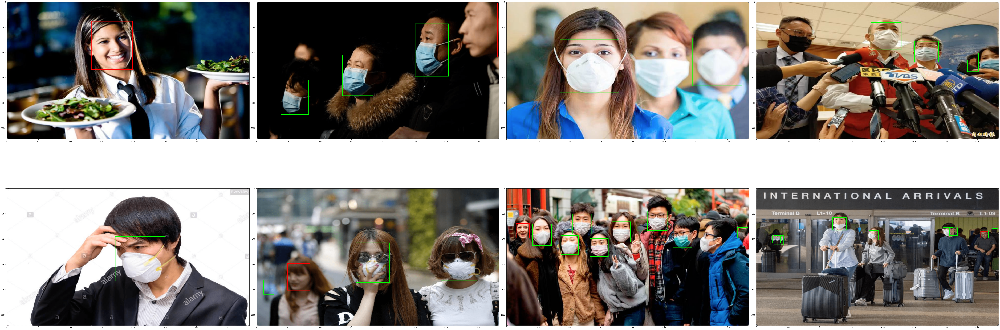

In [13]:
# Visualizing the first 12 images.
OUTPUT_PATH = 'test_images-output/images_annotated' # relative path from $USER_EXPERIMENT_DIR.
COLS = 4 # number of columns in the visualizer grid.
IMAGES = 8 # number of images to visualize.

visualize_images(OUTPUT_PATH, num_cols=COLS, num_images=IMAGES)

## 9. Deploy! <a class="anchor" id="head-9"></a>

In [14]:
!mkdir -p $USER_EXPERIMENT_DIR/experiment_dir_final
# Removing a pre-existing copy of the etlt if there has been any.
import os
output_file=os.path.join(os.environ['USER_EXPERIMENT_DIR'],
                         "experiment_dir_final/resnet18_detector.etlt")
if os.path.exists(output_file):
    os.system("rm {}".format(output_file))
!tao detectnet_v2 export \
            -m /tlt-demo/experiment/experiment_dir_retrain/weights/resnet18_detector_pruned.tlt \
            -o /tlt-demo/experiment/experiment_dir_final/resnet18_detector.etlt \
            -k $KEY

/root/conda/envs/py369/lib/python3.6/site-packages/tlt/__init__.py:20: DeprecationWarning: 
The `nvidia-tlt` package will be deprecated soon. Going forward please migrate to using the `nvidia-tao` package.

  warnings.warn(message, DeprecationWarning)
2022-05-04 11:05:10,859 [INFO] root: Registry: ['nvcr.io']
2022-05-04 11:05:11,137 [INFO] tlt.components.instance_handler.local_instance: Running command in container: nvcr.io/nvidia/tao/tao-toolkit-tf:v3.21.11-tf1.15.4-py3
2022-05-04 11:05:11,670 [WARNING] tlt.components.docker_handler.docker_handler: 
Docker will run the commands as root. If you would like to retain your
local host permissions, please add the "user":"UID:GID" in the
DockerOptions portion of the "/root/.tao_mounts.json" file. You can obtain your
users UID and GID by using the "id -u" and "id -g" commands on the
terminal.
Using TensorFlow backend.
Using TensorFlow backend.
2022-05-04 03:05:26,413 [INFO] root: Building exporter object.
2022-05-04 03:05:28,886 [INFO] root: 

In [15]:
print('Exported model:')
print('------------')
!ls -lh $USER_EXPERIMENT_DIR/experiment_dir_final

Exported model:
------------
total 7.9M
-rw-r--r--. 1 root root 7.9M May  4 11:05 resnet18_detector.etlt


### A. Int8 Optimization <a class="anchor" id="head-9-1"></a>
DetectNet_v2 model supports int8 inference mode in TRT. In order to use int8 mode, we must calibrate the model to run 8-bit inferences. This involves 2 steps

* Generate calibration tensorfile from the training data using tlt-int8-tensorfile
* Use tlt-export to generate int8 calibration table.

*Note: For this example, we generate a calibration tensorfile containing 10 batches of training data.
Ideally, it is best to use atleast 10-20% of the training data to calibrate the model. The more data provided during calibration, the closer int8 inferences are to fp32 inferences.*

In [16]:
!tao detectnet_v2 calibration_tensorfile -e /tlt-demo/tlt_specs/detectnet_v2_retrain_resnet18_kitti.txt \
                                  -m 40 \
                                  -o /tlt-demo/experiment/experiment_dir_final/calibration.tensor

/root/conda/envs/py369/lib/python3.6/site-packages/tlt/__init__.py:20: DeprecationWarning: 
The `nvidia-tlt` package will be deprecated soon. Going forward please migrate to using the `nvidia-tao` package.

  warnings.warn(message, DeprecationWarning)
2022-05-04 11:23:42,593 [INFO] root: Registry: ['nvcr.io']
2022-05-04 11:23:42,816 [INFO] tlt.components.instance_handler.local_instance: Running command in container: nvcr.io/nvidia/tao/tao-toolkit-tf:v3.21.11-tf1.15.4-py3
2022-05-04 11:23:43,493 [WARNING] tlt.components.docker_handler.docker_handler: 
Docker will run the commands as root. If you would like to retain your
local host permissions, please add the "user":"UID:GID" in the
DockerOptions portion of the "/root/.tao_mounts.json" file. You can obtain your
users UID and GID by using the "id -u" and "id -g" commands on the
terminal.
Using TensorFlow backend.
Using TensorFlow backend.
2022-05-04 03:23:56,500 [INFO] __main__: This method is soon to be deprecated. Please use the -e opt

Writing calibration tensorfile: 100%|███████████| 40/40 [02:04<00:00,  3.12s/it]
Time taken to run __main__:main: 0:02:06.140752.
2022-05-04 11:26:05,317 [INFO] tlt.components.docker_handler.docker_handler: Stopping container.


In [17]:
#!rm -rf $USER_EXPERIMENT_DIR/experiment_dir_final/resnet18_detector.etlt
!rm -rf $USER_EXPERIMENT_DIR/experiment_dir_final/calibration.bin
!tao detectnet_v2 export \
            -m /tlt-demo/experiment/experiment_dir_retrain/weights/resnet18_detector_pruned.tlt \
            -o /tlt-demo/experiment/experiment_dir_final/resnet18_detector.etlt \
            -k $KEY  \
            --cal_data_file /tlt-demo/experiment/experiment_dir_final/calibration.tensor \
            --data_type int8 \
            --batches 20 \
            --batch_size 4 \
            --max_batch_size 4\
            --engine_file /tlt-demo/experiment/experiment_dir_final/resnet18_detector.trt.int8 \
            --cal_cache_file /tlt-demo/experiment/experiment_dir_final/calibration.bin \
            --verbose

/root/conda/envs/py369/lib/python3.6/site-packages/tlt/__init__.py:20: DeprecationWarning: 
The `nvidia-tlt` package will be deprecated soon. Going forward please migrate to using the `nvidia-tao` package.

  warnings.warn(message, DeprecationWarning)
2022-05-04 11:55:33,662 [INFO] root: Registry: ['nvcr.io']
2022-05-04 11:55:33,854 [INFO] tlt.components.instance_handler.local_instance: Running command in container: nvcr.io/nvidia/tao/tao-toolkit-tf:v3.21.11-tf1.15.4-py3
2022-05-04 11:55:34,319 [WARNING] tlt.components.docker_handler.docker_handler: 
Docker will run the commands as root. If you would like to retain your
local host permissions, please add the "user":"UID:GID" in the
DockerOptions portion of the "/root/.tao_mounts.json" file. You can obtain your
users UID and GID by using the "id -u" and "id -g" commands on the
terminal.
Using TensorFlow backend.
Using TensorFlow backend.
2022-05-04 03:55:47,165 [INFO] root: Building exporter object.
2022-05-04 03:55:49,513 [INFO] root: 

### B. Generate TensorRT engine <a class="anchor" id="head-9-2"></a>
Verify engine generation using the `tlt-converter` utility included with the docker.

The `tlt-converter` produces optimized tensorrt engines for the platform that it resides on. Therefore, to get maximum performance, please instantiate this docker and execute the `tlt-converter` command, with the exported `.etlt` file and calibration cache (for int8 mode) on your target device. The converter utility included in this docker only works for x86 devices, with discrete NVIDIA GPU's. 

For the jetson devices, please download the converter for jetson from the dev zone link [here](https://developer.nvidia.com/tlt-converter). 

If you choose to integrate your model into deepstream directly, you may do so by simply copying the exported `.etlt` file along with the calibration cache to the target device and updating the spec file that configures the `gst-nvinfer` element to point to this newly exported model. Usually this file is called `config_infer_primary.txt` for detection models and `config_infer_secondary_*.txt` for classification models.

In [3]:
!tao converter $USER_EXPERIMENT_DIR/experiment_dir_final/resnet18_detector.etlt \
               -k $KEY \
               -c $USER_EXPERIMENT_DIR/experiment_dir_final/calibration.bin \
               -o output_cov/Sigmoid,output_bbox/BiasAdd \
               -d 3,544,960 \
               -i nchw \
               -m 64 \
               -t int8 \
               -e $USER_EXPERIMENT_DIR/experiment_dir_final/resnet18_detector.trt \
               -b 4

/root/conda/envs/py369/lib/python3.6/site-packages/tlt/__init__.py:20: DeprecationWarning: 
The `nvidia-tlt` package will be deprecated soon. Going forward please migrate to using the `nvidia-tao` package.

  warnings.warn(message, DeprecationWarning)
2022-05-04 15:27:48,602 [INFO] root: Registry: ['nvcr.io']
2022-05-04 15:27:48,934 [INFO] tlt.components.instance_handler.local_instance: Running command in container: nvcr.io/nvidia/tao/tao-toolkit-tf:v3.21.11-tf1.15.5-py3
2022-05-04 15:27:49,507 [WARNING] tlt.components.docker_handler.docker_handler: 
Docker will run the commands as root. If you would like to retain your
local host permissions, please add the "user":"UID:GID" in the
DockerOptions portion of the "/root/.tao_mounts.json" file. You can obtain your
users UID and GID by using the "id -u" and "id -g" commands on the
terminal.
2022-05-04 15:27:53,279 [INFO] tlt.components.docker_handler.docker_handler: Stopping container.


## 10. Verify Deployed Model <a class="anchor" id="head-10"></a>
Verify the exported model by visualizing inferences on TensorRT.
In addition to running inference on a `.tlt` model in [step 8](#head-8), the `tlt-infer` tool is also capable of consuming the converted `TensorRT engine` from [step 9.B](#head-9-2).

*If after int-8 calibration the accuracy of the int-8 inferences seem to degrade, it could be because the there wasn't enough data in the calibration tensorfile used to calibrate thee model or, the training data is not entirely representative of your test images, and the calibration maybe incorrect. Therefore, you may either regenerate the calibration tensorfile with more batches of the training data, and recalibrate the model, or calibrate the model on a few images from the test set. This may be done using `--cal_image_dir` flag in the `tlt-export` tool. For more information, please follow the instructions in the USER GUIDE.

### A. Inference using TensorRT engine <a class="anchor" id="head-10-1"></a>

In [ ]:
!tlt-infer detectnet_v2 -e $SPECS_DIR/detectnet_v2_inference_kitti_etlt.txt \
                        -o $USER_EXPERIMENT_DIR/etlt_infer_testing \
                        -i $DATA_DOWNLOAD_DIR/test_images \
                        -k $KEY

In [ ]:
# visualize the first 12 inferenced images.
OUTPUT_PATH = 'etlt_infer_testing/images_annotated' # relative path from $USER_EXPERIMENT_DIR.
COLS = 4 # number of columns in the visualizer grid.
IMAGES = 8 # number of images to visualize.

visualize_images(OUTPUT_PATH, num_cols=COLS, num_images=IMAGES)